# **Brazilian E-Commerce Public Dataset by Olist**

This Project was carried out by Alpha's Team:
1. Arkirndra Muhammad Nikola
2. Valeria Trisna Yunita
3. Erza Anandhika Valerian Vacquier

# Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
import missingno
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.preprocessing import RobustScaler
import category_encoders as ce
from sklearn.compose import ColumnTransformer
from sklearn.metrics import silhouette_score
from tabulate import tabulate

import warnings
warnings.filterwarnings('ignore')

# 1. Business Understanding

## 1.1 Context

Perkembangan e-commerce di Brazil menunjukkan pertumbuhan yang sangat pesat dalam beberapa tahun terakhir. Pada tahun 2023, pasar ritel e-commerce di Brazil menghasilkan pendapatan lebih dari 36 miliar dolar AS. Menurut estimasi dari Statista, pendapatan e-commerce di Brazil akan melampaui 60 miliar dolar AS pada tahun 2025 ([Statista, 2024](https://www.statista.com/forecasts/289746/e-commerce-revenue-forecast-in-brazil)). Hal ini menunjukkan adanya pertumbuhan yang signifikan dalam industri ini, yang diharapkan terus berlanjut di masa mendatang.

Brazil telah menjadi pangsa pasar yang matang dalam sektor e-commerce. Berdasarkan data  ([Statista (2024)](https://www.statista.com/topics/4697/e-commerce-in-brazil/)), pendapatan e-commerce di Brazil diperkirakan mencapai 49,173 miliar dolar pada tahun 2022, dengan volume pasar yang bisa mencapai 86,532 miliar dolar pada tahun 2025. Pada tahun 2021, pasar ini telah menghasilkan lebih dari 41,130 miliar dolar. Brazil juga merupakan negara dengan jumlah pengguna internet terbesar di Amerika Latin, dengan total 165 juta pengguna pada Januari 2022.

Segmen e-commerce di Brazil telah menghasilkan total pendapatan nasional sebesar 170 miliar real Brazil pada tahun 2022. Angka ini meningkat dua kali lipat dibandingkan dengan tahun 2019 dan mengalami kenaikan sebesar 12% dari tahun 2021. Pertumbuhan ini mencerminkan peningkatan adopsi teknologi digital oleh konsumen Brazil serta peningkatan kepercayaan terhadap transaksi online.
Potensi besar e-commerce di Brazil menjadikan Olist sebagai subjek penelitian yang sangat relevan. Olist adalah salah satu perusahaan marketplace terbesar di Brazil yang beroperasi di sektor e-commerce. Olist memfasilitasi koneksi antara penjual dan pelanggan dengan mudah melalui kontrak tunggal. Ini memungkinkan penjual untuk menjual dan mengirim produk mereka melalui mitra logistik Olist. Ketika pelanggan membeli produk dari toko Olist, penjual menerima notifikasi untuk memenuhi pesanan tersebut. Setelah produk diterima atau estimasi pengiriman tersedia, pelanggan menerima survei kepuasan di mana mereka dapat memberikan ulasan dan rating.

Olist, dengan model bisnisnya yang unik, tidak hanya menghubungkan penjual dan pelanggan tetapi juga menyediakan solusi logistik yang efisien, menjadikannya pionir dalam inovasi e-commerce di Brazil. Penelitian terhadap Olist penting dilakukan untuk mengungkap dinamika kluster pengguna di platform ini. Mengetahui bagaimana Olist berhasil menarik dan mempertahankan berbagai segmen pengguna dapat memberikan wawasan berharga bagi pelaku bisnis e-commerce. Dengan menganalisis kluster pengguna, penelitian ini bertujuan untuk memahami karakteristik dan perilaku konsumen yang berbelanja melalui Olist, yang dapat digunakan untuk mengembangkan strategi pemasaran yang lebih efektif dan meningkatkan pengalaman pelanggan.


## 1.2 Problem Statement

Pengelompokan customer adalah langkah krusial dalam strategi bisnis untuk memastikan program pemasaran yang tepat sasaran. Customer Olist datang dari berbagai latar belakang dan minat, membuat penggalian kebutuhan mereka menjadi esensial. Dengan memahami kebutuhan ini, bisnis dapat mengurangi biaya pemasaran yang tidak efektif dan meningkatkan efisiensi. Berikut adalah beberapa analisis yang perlu dilakukan untuk mencapai tujuan tersebut:

1. Customer Olist terbesar dari negara mana?
2. Seller Olist terbesar dari negara mana?
3. Sistem pembayaran apa yang digunakan oleh customer Olist?
4. Bagaimana tren penjualan disetiap bulannya?
5. Bagaiman tren (seasonal) penjualan hariannya?
6. Bagaimanakah karakteristik setiap kluster yang terbentuk?
7. Bagaimana Sistem Rekomendasi yang tepat untuk masing-masing klusternya?

## 1.3 Goal/Tujuan

Berdasarkan permasalahan yang telah diidentifikasi, perusahaan Olist ingin memperoleh jawaban yang jelas untuk beberapa pertanyaan strategis guna menemukan solusi dan rekomendasi yang tepat. Tujuan utama adalah memperbaiki dan mempertahankan kinerja perusahaan melalui segmentasi customer dan rekomendasi berbasis data historis. Dengan demikian, perusahaan dapat menyusun program bisnis yang tepat sasaran, meningkatkan retensi customer, dan menarik customer baru. Hasil temuan dan model yang dibuat akan dipresentasikan kepada stakeholder untuk mendukung pengambilan keputusan dan penyusunan strategi pemasaran yang lebih efisien.


## 1.4 Analytic Approach

Dalam proyek ini, kami menerapkan Analisis RFM dan Klasterisasi K-Means untuk melakukan segmentasi pelanggan. Analisis RFM mengelompokkan kebiasaan pelanggan berdasarkan:

1. Recency: jumlah hari sejak transaksi terakhir pelanggan.
2. Frequency: seberapa sering pelanggan melakukan pembelian.
3. Monetary: total nilai transaksi pelanggan.

Untuk menentukan jumlah klaster dengan algoritma K-Means, kami menggunakan:
1. Silhouette Score: Silhouette Score menilai sejauh mana setiap data berada dalam klaster yang tepat dibandingkan dengan klaster lain di sekitarnya. Skor ini berkisar antara -1 hingga 1, dengan skor lebih tinggi menunjukkan penempatan yang lebih baik dalam klaster tersebut dan terpisah dari klaster lainnya. Skor mendekati 1 menunjukkan klaster yang tepat, sedangkan skor mendekati -1 menunjukkan bahwa data mungkin lebih baik ditempatkan di klaster lain. Nilai sekitar 0 menunjukkan adanya tumpang tindih antar klaster.

2. Metode Elbow: Metode ini menilai varian dalam klaster sebagai fungsi dari jumlah klaster. Tujuannya adalah untuk mengukur jumlah kuadrat jarak antara setiap titik data dengan pusat klasternya. Jumlah klaster optimal dipilih pada titik "elbow" di grafik, di mana penurunan varian mulai melambat.

3. Domain of Knowledge: untuk penyesuaian dan tujuan bisnis.

## 1.5 Metric Evaluation

Silhouette Coefficient: Indeks ini mengukur sejauh mana setiap sampel sesuai dengan kelompoknya sendiri dibandingkan dengan kelompok lain dalam dataset. Skala nilai Silhouette Coefficient berkisar dari -1 hingga 1, di mana nilai yang lebih tinggi menandakan bahwa kelompok-kelompok tersebut lebih terdefinisi dengan baik.

Elbow Method: Metode ini digunakan untuk menemukan jumlah cluster optimal dalam sebuah dataset. Dalam metode ini, nilai inertia (jarak rata-rata setiap titik data ke pusat klaster terdekat) diperlihatkan terhadap jumlah klaster, dan titik siku pada grafik ini menunjukkan jumlah klaster yang optimal.

# Data Description

Dataset ini memiliki 9 file csv yang saling berhubungan satu sama lain.

![alt text](https://i.imgur.com/HRhd2Y0.png)

Setiap fitur atau kolom dari dataset dijelaskan di bawah ini:

* fitur pada tabel `customers`:

Fitur | Deskripsi
----------|---------------
**customer_id** | kunci untuk order dataset. Setiap order memiliki id yang unik.
**customer_unique_id**    | identifikasi  unik setiap customer.
**customer_zip_code_prefix** | 5 digit pertama kode pos customer.
**customer_city** | nama kota customer.
**customer_state** |  provinsi customer.

* fitur pada tabel `sellers` :

Fitur | Deskripsi
----------|---------------
**seller_id** |   identifikasi unik setiap penjual.
**seller_zip_code_prefix** | 5 digit pertama kode pos penjual.
**seller_city** | nama kota penjual.
**seller_state** | provinsi penjual.


* fitur pada tabel `order_items`:

Fitur | Deskripsi
----------|---------------
**order_id** | identifikasi unik setiap order.
**order_item_id** | nomor urut untuk mengidentifikasi jumlah item yang termasuk dalam pesanan yang sama.
**product_id** |identifikasi unik setiap produk.
**seller_id** | identifikasi unik setiap penjual.
**shipping_limit_date** | menunjukkan tanggal batas pengiriman penjual untuk menangani pesanan ke mitra logistik.
**price** | harga item.
**freight_value** | biaya ongkos kirim tiap satu produk.

* fitur pada tabel  `order_payments`:

Feature | Description
----------|---------------
**order_id** | identifikasi unik setiap order.
**payment_sequential** | pelanggan dapat membayar pesanan dengan lebih dari satu metode pembayaran. Jika dia melakukannya, urutan akan dibuat untuk mengakomodasi semua pembayaran.
**payment_type** |  metode pembayaran yang dipilih oleh customer.
**payment_installments** | jumlah angsuran yang dipilih oleh customer.
**payment_value** | total transaksi.



* fitur pada tabel  `orders`:

Fitur | Deskripsi
----------|---------------
**order_id** | identifikasi unik setiap order.
**customer_id** | identifikasi unik setiap customer.
**order_status** | status pesanan (delivered, shipped, etc).
**order_purchase_timestamp** | menunjukkan waktu pembelian.
**order_approved_at** | menunjukkan waktu persetujuan pembayaran.
**order_delivered_carrier_date** | menunjukkan waktu pengiriman pesanan. Saat itu ditangani ke mitra logistik.
**order_delivered_customer_date** | Menunjukkan waktu penerimaan pesanan. Saat itu ditangani oleh pelanggan.
**order_estimated_delivery_date** | Menunjukkan perkiraan tanggal pengiriman yang diinformasikan kepada pelanggan pada saat pembelian.


* fitur pada tabel  `order_reviews`:

Fitur | Deskripsi
----------|---------------
**review_id** | identifikasi unik setiap review.
**order_id** |  identifikasi unik setiap order.
**review_score** | Nilai kepuasan dengan rentang dari 1 sampai 5 yang diberikan oleh pelanggan.
**review_comment_title** | Judul komentar dari ulasan yang ditinggalkan oleh pelanggan, dalam bahasa Portugis.
**review_comment_message** | Isi komentar dari ulasan yang ditinggalkan oleh pelanggan, dalam bahasa Portugis.
**review_creation_date** | Menunjukkan tanggal pengiriman survei kepuasan kepada pelanggan.
**review_answer_timestamp** | Menampilkan Tanggal waktu jawaban survei kepuasan.


* fitur pada tabel  `products`:

Fitur | Deskripsi
----------|---------------
**product_id** | id setiap produk.
**product_category_name** | kategori nama produk, dalam bahasa Portugis.
**product_name_lenght** | Panjang karakter tiap nama produk.
**product_description_lenght** | Panjang karakter tiap deskripsi produk.
**product_photos_qty** | jumlah foto produk yang diterbitkan.
**product_weight_g** | berat produk diukur dalam gram.
**product_length_cm** | Panjang produk diukur (cm).
**product_height_cm** | Tinggi produk diukur  (cm).
**product_width_cm** | Lebar produk diukur (cm).


* fitur pada tabel `geolocation`:

Fitur | Deskripsi
----------|---------------
**geolocation_zip_code_prefix** | 5 digit pertama kode pos.
**geolocation_lat** | kordinat latitude.
**geolocation_lng** | kordinat longitude.
**geolocation_city** | nama kota.
**geolocation_state** | nama provinsi.


* fitur pada tabel  `category_name`:

Fitur | Deskripsi
----------|---------------
**product_category_name** | nama kategori produk dalam bahasa portugis.
**product_category_name_english** | nama kategori produk dalam bahasa inggris.

# 2. Data Understanding

**Data Understanding** merupakan tahap **pengenalan dataset**. Dari tahap ini, kita dapat mengidentifikasi berbagai anomali yang ada dalam dataset kita yang perlu diperbaiki selama proses data cleaning. Setiap tindakan yang diambil untuk menangani anomali akan didukung oleh penjelasan yang memadai, baik berdasarkan pengetahuan domain maupun analisis statistik.

Ini adalah dataset publik e-commerce Brasil dari pesanan yang dibuat di Toko Olist. Dataset ini memiliki informasi tentang 100.000 pesanan dari tahun 2016 hingga 2018 yang dibuat di beberapa pasar di Brasil. Fiturnya memungkinkan untuk melihat pesanan dari berbagai dimensi: dari status pesanan, harga, kinerja pembayaran dan pengiriman, lokasi pelanggan, atribut produk, hingga ulasan yang ditulis oleh pelanggan. Kami juga merilis dataset geolokasi yang menghubungkan kode pos Brasil dengan koordinat lat/lng.

Ini adalah data komersial nyata, telah disamarkan, dan referensi kepada perusahaan dan mitra dalam teks ulasan telah diganti dengan nama-nama keluarga besar Game of Thrones.

Data ini diambil dari Kaggle.com : https://www.kaggle.com/datasets/olistbr/brazilian-ecommerce?select=olist_products_dataset.csv

## 2.1 Load Dataset

### 2.1.1 Dataset olist_customers_datasets.csv

Dataset ini berisi informasi tentang pelanggan dan lokasinya. Pada dataset ini,  setiap pesanan diberikan kepada customer_id yang unik.

In [ ]:
df_raw_customers = pd.read_csv('olist_customers_dataset.csv')
df_raw_customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [ ]:
df_raw_customers.shape

(99441, 5)

In [ ]:
pd.DataFrame({
    'Data Features': df_raw_customers.columns.values,
    'Data Type' : df_raw_customers.columns.dtype,
    'Null Value(%)': df_raw_customers.isna().mean().values * 100,
    'Duplicate Data' : df_raw_customers.duplicated().sum(),
    'Nunique Data': df_raw_customers.nunique().values,
    'Sample Unique': [df_raw_customers[col].unique() for col in df_raw_customers.columns]}
).round(3)

,Data Features,Data Type,Null Value(%),Duplicate Data,Nunique Data,Sample Unique
0,customer_id,object,0.0,0,99441,"[06b8999e2fba1a1fbc88172c00ba8bc7, 18955e83d337fd6b2def6b18a428ac77, 4e7b3e00288586ebd08712fdd03..."
1,customer_unique_id,object,0.0,0,96096,"[861eff4711a542e4b93843c6dd7febb0, 290c77bc529b7ac935b93aa66c333dc3, 060e732b5b29e8181a18229c7b0..."
2,customer_zip_code_prefix,object,0.0,0,14994,"[14409, 9790, 1151, 8775, 13056, 89254, 4534, 35182, 81560, 30575, 39400, 20231, 18682, 5704, 95..."
3,customer_city,object,0.0,0,4119,"[franca, sao bernardo do campo, sao paulo, mogi das cruzes, campinas, jaragua do sul, timoteo, c..."
4,customer_state,object,0.0,0,27,"[SP, SC, MG, PR, RJ, RS, PA, GO, ES, BA, MA, MS, CE, DF, RN, PE, MT, AM, AP, AL, RO, PB, TO, PI,..."


Dapat dilihat dari tabel diatas, bahwa dari 5 kolom yang ada pada dataset olist customer, tidak terdapat null values dan duplicate data. Lalu, semua data memiliki data type object.

### 2.1.2 Dataset olist_geolocation_datasets.csv

Dataset ini berisi informasi tentang kode pos Brazil dan koordinat lintang/bujurnya.

In [ ]:
df_raw_geolocation = pd.read_csv('olist_geolocation_dataset.csv')
df_raw_geolocation.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [ ]:
df_raw_geolocation.shape

(1000163, 5)

In [ ]:
pd.DataFrame({
    'Data Features': df_raw_geolocation.columns.values,
    'Data Type' : df_raw_geolocation.columns.dtype,
    'Null Value(%)': df_raw_geolocation.isna().mean().values * 100,
    'Duplicate Data' : df_raw_geolocation.duplicated().sum(),
    'Nunique Data': df_raw_geolocation.nunique().values,
    'Sample Unique': [df_raw_geolocation[col].unique() for col in df_raw_geolocation.columns]}
).round(3)

,Data Features,Data Type,Null Value(%),Duplicate Data,Nunique Data,Sample Unique
0,geolocation_zip_code_prefix,object,0.0,261831,19015,"[1037, 1046, 1041, 1035, 1012, 1047, 1013, 1029, 1011, 1032, 1014, 1039, 1024, 1009, 1020, 1043,..."
1,geolocation_lat,object,0.0,261831,717360,"[-23.54562128115268, -23.54608112703553, -23.54612896641469, -23.5443921648681, -23.541577961711..."
2,geolocation_lng,object,0.0,261831,717613,"[-46.63929204800168, -46.64482029837157, -46.64295148361138, -46.63949930627844, -46.64160722329..."
3,geolocation_city,object,0.0,261831,8011,"[sao paulo, são paulo, sao bernardo do campo, jundiaí, taboão da serra, sãopaulo, sp, sa£o paulo..."
4,geolocation_state,object,0.0,261831,27,"[SP, RN, AC, RJ, ES, MG, BA, SE, PE, AL, PB, CE, PI, MA, PA, AP, AM, RR, DF, GO, RO, TO, MT, MS,..."


Dapat dilihat dari tabel diatas, bahwa dari 5 kolom yang ada pada dataset geolocation, tidak terdapat null values, namun terdapat 261831 duplicate data pada setiap kolomnya. Lalu, semua data memiliki data type object. Akan dilakukan analisa lebih lanjut pada tahap berikutnya.

### 2.1.3 Dataset olist_order_items_datasets.csv


Dataset ini mencakup data tentang barang yang dibeli dalam setiap pesanan.

Notes:
order_id = 00143d0f86d6fbd9f9b38ab440ac16f5 memiliki 3 barang (produk yang sama). Setiap barang memiliki biaya pengiriman yang dihitung sesuai dengan ukuran dan beratnya. Untuk mendapatkan total nilai pengiriman untuk setiap pesanan, hanya perlu menjumlahkannya.

contoh:

Nilai total item pesanan adalah: 21.33 * 3 = 63.99

Nilai total pengiriman adalah: 15.10 * 3 = 45.30

Nilai total pesanan (produk + pengiriman) adalah: 45.30 + 63.99 = 109.29

In [ ]:
df_raw_order_items = pd.read_csv('olist_order_items_dataset.csv')
df_raw_order_items.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [ ]:
df_raw_order_items.shape

(112650, 7)

In [ ]:
pd.DataFrame({
    'Data Features': df_raw_order_items.columns.values,
    'Data Type' : df_raw_order_items.columns.dtype,
    'Null Value(%)': df_raw_order_items.isna().mean().values * 100,
    'Duplicate Data' : df_raw_order_items.duplicated().sum(),
    'Nunique Data': df_raw_order_items.nunique().values,
    'Sample Unique': [df_raw_order_items[col].unique() for col in df_raw_order_items.columns]}
).round(3)

,Data Features,Data Type,Null Value(%),Duplicate Data,Nunique Data,Sample Unique
0,order_id,object,0.0,0,98666,"[00010242fe8c5a6d1ba2dd792cb16214, 00018f77f2f0320c557190d7a144bdd3, 000229ec398224ef6ca0657da4f..."
1,order_item_id,object,0.0,0,21,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]"
2,product_id,object,0.0,0,32951,"[4244733e06e7ecb4970a6e2683c13e61, e5f2d52b802189ee658865ca93d83a8f, c777355d18b72b67abbeef9df44..."
3,seller_id,object,0.0,0,3095,"[48436dade18ac8b2bce089ec2a041202, dd7ddc04e1b6c2c614352b383efe2d36, 5b51032eddd242adc84c38acab8..."
4,shipping_limit_date,object,0.0,0,93318,"[2017-09-19 09:45:35, 2017-05-03 11:05:13, 2018-01-18 14:48:30, 2018-08-15 10:10:18, 2017-02-13 ..."
5,price,object,0.0,0,5968,"[58.9, 239.9, 199.0, 12.99, 199.9, 21.9, 19.9, 810.0, 145.95, 53.99, 59.99, 45.0, 74.0, 49.9, 99..."
6,freight_value,object,0.0,0,6999,"[13.29, 19.93, 17.87, 12.79, 18.14, 12.69, 11.85, 70.75, 11.65, 11.4, 8.88, 12.98, 23.32, 13.37,..."


Dapat dilihat dari tabel diatas, bahwa dari 7 kolom yang ada pada dataset order_items, tidak terdapat null values dan duplicate data pada setiap kolomnya. Lalu, semua data memiliki data type object.

### 2.1.4 Dataset olist_order_payments_datasets.csv


Dataset ini mencakup data tentang opsi pembayaran pesanan.

In [ ]:
df_raw_order_payments = pd.read_csv('olist_order_payments_dataset.csv')
df_raw_order_payments.head()


,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [ ]:
df_raw_order_payments.shape

(103886, 5)

In [ ]:
pd.DataFrame({
    'Data Features': df_raw_order_payments.columns.values,
    'Data Type' : df_raw_order_payments.columns.dtype,
    'Null Value(%)': df_raw_order_payments.isna().mean().values * 100,
    'Duplicate Data' : df_raw_order_payments.duplicated().sum(),
    'Nunique Data': df_raw_order_payments.nunique().values,
    'Sample Unique': [df_raw_order_payments[col].unique() for col in df_raw_order_payments.columns]}
).round(3)

,Data Features,Data Type,Null Value(%),Duplicate Data,Nunique Data,Sample Unique
0,order_id,object,0.0,0,99440,"[b81ef226f3fe1789b1e8b2acac839d17, a9810da82917af2d9aefd1278f1dcfa0, 25e8ea4e93396b6fa0d3dd708e7..."
1,payment_sequential,object,0.0,0,29,"[1, 2, 4, 5, 3, 8, 6, 7, 10, 11, 17, 19, 27, 12, 9, 15, 13, 14, 16, 25, 22, 26, 29, 28, 18, 21, ..."
2,payment_type,object,0.0,0,5,"[credit_card, boleto, voucher, debit_card, not_defined]"
3,payment_installments,object,0.0,0,24,"[8, 1, 2, 3, 6, 5, 4, 10, 7, 12, 9, 13, 15, 24, 11, 18, 14, 20, 21, 17, 22, 0, 16, 23]"
4,payment_value,object,0.0,0,29077,"[99.33, 24.39, 65.71, 107.78, 128.45, 96.12, 81.16, 51.84, 341.09, 51.95, 188.73, 141.9, 75.78, ..."


Dapat dilihat dari tabel diatas, bahwa dari 5 kolom yang ada pada dataset order_payments, tidak terdapat null values dan duplicate data pada setiap kolomnya. Lalu, semua data memiliki data type object.

### 2.1.5 Dataset olist_order_reviews_datasets.csv


Dataset ini mencakup data tentang ulasan yang dibuat oleh pelanggan.

In [ ]:
df_raw_order_reviews = pd.read_csv('olist_order_reviews_dataset.csv')
df_raw_order_reviews.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela Internet seguro e prático Parabéns a todos feliz Pá...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [ ]:
df_raw_order_reviews.shape

(99224, 7)

In [ ]:
pd.DataFrame({
    'Data Features': df_raw_order_reviews.columns.values,
    'Data Type' : df_raw_order_reviews.columns.dtype,
    'Null Value(%)': df_raw_order_reviews.isna().mean().values * 100,
    'Duplicate Data' : df_raw_order_reviews.duplicated().sum(),
    'Nunique Data': df_raw_order_reviews.nunique().values,
    'Sample Unique': [df_raw_order_reviews[col].unique() for col in df_raw_order_reviews.columns]}
).round(3)

,Data Features,Data Type,Null Value(%),Duplicate Data,Nunique Data,Sample Unique
0,review_id,object,0.000,0,98410,"[7bc2406110b926393aa56f80a40eba40, 80e641a11e56f04c1ad469d5645fdfde, 228ce5500dc1d8e020d8d132287..."
1,order_id,object,0.000,0,98673,"[73fc7af87114b39712e6da79b0a377eb, a548910a1c6147796b98fdf73dbeba33, f9e4b658b201a9f2ecdecbb34be..."
2,review_score,object,0.000,0,5,"[4, 5, 1, 3, 2]"
3,review_comment_title,object,88.342,0,4527,"[nan, recomendo, Super recomendo, Não chegou meu produto , Ótimo, Muito bom., Bom, Maravilhoso!,..."
4,review_comment_message,object,58.703,0,36159,"[nan, Recebi bem antes do prazo estipulado., Parabéns lojas lannister adorei comprar pela Intern..."
5,review_creation_date,object,0.000,0,636,"[2018-01-18 00:00:00, 2018-03-10 00:00:00, 2018-02-17 00:00:00, 2017-04-21 00:00:00, 2018-03-01 ..."
6,review_answer_timestamp,object,0.000,0,98248,"[2018-01-18 21:46:59, 2018-03-11 03:05:13, 2018-02-18 14:36:24, 2017-04-21 22:02:06, 2018-03-02 ..."


Dapat dilihat dari tabel diatas, bahwa dari 7 kolom yang ada pada dataset order_reviews, terdapat null values pada kolom review_comment_title sebesar 88.342% dan pada review_comment_message sebesar 58.703%. Hal ini akan dilakukan analisa lebih lanjut pada tahap selanjutnya. Lalu, tidak terdapat duplicate data pada setiap kolomnya. Setelah tu, semua data memiliki data type object.

### 2.1.6 Dataset olist_orders_dataset.csv

Dataset ini memiliki data order_id, dan customer_id yang dapat menyambungkan dataset satu dan lainnya.

In [ ]:
df_raw_orders = pd.read_csv('olist_orders_dataset.csv')
df_raw_orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [ ]:
df_raw_orders.shape

(99441, 8)

In [ ]:
pd.DataFrame({
    'Data Features': df_raw_orders.columns.values,
    'Data Type' : df_raw_orders.columns.dtype,
    'Null Value(%)': df_raw_orders.isna().mean().values * 100,
    'Duplicate Data' : df_raw_orders.duplicated().sum(),
    'Nunique Data': df_raw_orders.nunique().values,
    'Sample Unique': [df_raw_orders[col].unique() for col in df_raw_orders.columns]}
).round(3)

,Data Features,Data Type,Null Value(%),Duplicate Data,Nunique Data,Sample Unique
0,order_id,object,0.000,0,99441,"[e481f51cbdc54678b7cc49136f2d6af7, 53cdb2fc8bc7dce0b6741e2150273451, 47770eb9100c2d0c44946d9cf07..."
1,customer_id,object,0.000,0,99441,"[9ef432eb6251297304e76186b10a928d, b0830fb4747a6c6d20dea0b8c802d7ef, 41ce2a54c0b03bf3443c3d931a3..."
2,order_status,object,0.000,0,8,"[delivered, invoiced, shipped, processing, unavailable, canceled, created, approved]"
3,order_purchase_timestamp,object,0.000,0,98875,"[2017-10-02 10:56:33, 2018-07-24 20:41:37, 2018-08-08 08:38:49, 2017-11-18 19:28:06, 2018-02-13 ..."
4,order_approved_at,object,0.161,0,90733,"[2017-10-02 11:07:15, 2018-07-26 03:24:27, 2018-08-08 08:55:23, 2017-11-18 19:45:59, 2018-02-13 ..."
5,order_delivered_carrier_date,object,1.793,0,81018,"[2017-10-04 19:55:00, 2018-07-26 14:31:00, 2018-08-08 13:50:00, 2017-11-22 13:39:59, 2018-02-14 ..."
6,order_delivered_customer_date,object,2.982,0,95664,"[2017-10-10 21:25:13, 2018-08-07 15:27:45, 2018-08-17 18:06:29, 2017-12-02 00:28:42, 2018-02-16 ..."
7,order_estimated_delivery_date,object,0.000,0,459,"[2017-10-18 00:00:00, 2018-08-13 00:00:00, 2018-09-04 00:00:00, 2017-12-15 00:00:00, 2018-02-26 ..."


Dapat dilihat dari tabel diatas, bahwa dari 8 kolom yang ada pada dataset orders_dataset, terdapat null values sebesar 0.161% pada kolom order_approved_at, 1.793% pada kolom order_delivered_carrier_date, dan 2.982% pada kolom order_delivered_customer_date. Untuk duplicate data, tidak ada pada setiap kolomnya. Lalu, semua data memiliki data type object.

### 2.1.7 Dataset olist_products_dataset.csv

Dataset ini mencakup data tentang produk yang dijual oleh Olist.

In [ ]:
df_raw_products = pd.read_csv('olist_products_dataset.csv')
df_raw_products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [ ]:
df_raw_products.shape

(32951, 9)

In [ ]:
pd.DataFrame({
    'Data Features': df_raw_products.columns.values,
    'Data Type' : df_raw_products.columns.dtype,
    'Null Value(%)': df_raw_products.isna().mean().values * 100,
    'Duplicate Data' : df_raw_products.duplicated().sum(),
    'Nunique Data': df_raw_products.nunique().values,
    'Sample Unique': [df_raw_products[col].unique() for col in df_raw_products.columns]}
).round(3)

,Data Features,Data Type,Null Value(%),Duplicate Data,Nunique Data,Sample Unique
0,product_id,object,0.000,0,32951,"[1e9e8ef04dbcff4541ed26657ea517e5, 3aa071139cb16b67ca9e5dea641aaa2f, 96bd76ec8810374ed1b65e29197..."
1,product_category_name,object,1.851,0,73,"[perfumaria, artes, esporte_lazer, bebes, utilidades_domesticas, instrumentos_musicais, cool_stu..."
2,product_name_lenght,object,1.851,0,66,"[40.0, 44.0, 46.0, 27.0, 37.0, 60.0, 56.0, 57.0, 36.0, 54.0, 49.0, 43.0, 51.0, 59.0, 22.0, 39.0,..."
3,product_description_lenght,object,1.851,0,2960,"[287.0, 276.0, 250.0, 261.0, 402.0, 745.0, 1272.0, 184.0, 163.0, 1156.0, 630.0, 728.0, 1827.0, 2..."
4,product_photos_qty,object,1.851,0,19,"[1.0, 4.0, 2.0, 3.0, 5.0, 9.0, 6.0, nan, 7.0, 12.0, 10.0, 11.0, 17.0, 8.0, 15.0, 13.0, 14.0, 20...."
5,product_weight_g,object,0.006,0,2204,"[225.0, 1000.0, 154.0, 371.0, 625.0, 200.0, 18350.0, 900.0, 400.0, 600.0, 1100.0, 7150.0, 250.0,..."
6,product_length_cm,object,0.006,0,99,"[16.0, 30.0, 18.0, 26.0, 20.0, 38.0, 70.0, 40.0, 27.0, 17.0, 50.0, 68.0, 100.0, 29.0, 36.0, 21.0..."
7,product_height_cm,object,0.006,0,102,"[10.0, 18.0, 9.0, 4.0, 17.0, 5.0, 24.0, 8.0, 13.0, 19.0, 7.0, 11.0, 2.0, 15.0, 25.0, 23.0, 51.0,..."
8,product_width_cm,object,0.006,0,95,"[14.0, 20.0, 15.0, 26.0, 13.0, 11.0, 44.0, 40.0, 17.0, 12.0, 16.0, 45.0, 30.0, 50.0, 23.0, 34.0,..."


Dapat dilihat dari tabel diatas, bahwa dari 9 kolom yang ada pada dataset product_dataset, terdapat null values sebesar 0.1.851% pada kolom product_category_name, product_name_lenght, product_description_lenght, dan product_photos_qty. Lalu terdapat null values sebesar  0.006% pada kolom product_weight_g, product_length_cm, product_height_cm, dan product_width_cm. Untuk duplicate data, tidak ada pada setiap kolomnya. Lalu, semua data memiliki data type object.

### 2.1.8 Dataset olist_sellers_datasets.csv

Dataset ini mencakup data tentang penjual yang memenuhi pesanan di Olist.

In [ ]:
df_raw_sellers = pd.read_csv('olist_sellers_dataset.csv')
df_raw_sellers.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [ ]:
df_raw_sellers.shape

(3095, 4)

In [ ]:
pd.DataFrame({
    'Data Features': df_raw_sellers.columns.values,
    'Data Type' : df_raw_sellers.columns.dtype,
    'Null Value(%)': df_raw_sellers.isna().mean().values * 100,
    'Duplicate Data' : df_raw_sellers.duplicated().sum(),
    'Nunique Data': df_raw_sellers.nunique().values,
    'Sample Unique': [df_raw_sellers[col].unique() for col in df_raw_sellers.columns]}
).round(3)

,Data Features,Data Type,Null Value(%),Duplicate Data,Nunique Data,Sample Unique
0,seller_id,object,0.0,0,3095,"[3442f8959a84dea7ee197c632cb2df15, d1b65fc7debc3361ea86b5f14c68d2e2, ce3ad9de960102d0677a81f5d0b..."
1,seller_zip_code_prefix,object,0.0,0,2246,"[13023, 13844, 20031, 4195, 12914, 20920, 55325, 16304, 1529, 80310, 75110, 13530, 1222, 5372, 8..."
2,seller_city,object,0.0,0,611,"[campinas, mogi guacu, rio de janeiro, sao paulo, braganca paulista, brejao, penapolis, curitiba..."
3,seller_state,object,0.0,0,23,"[SP, RJ, PE, PR, GO, SC, BA, DF, RS, MG, RN, MT, CE, PB, AC, ES, RO, PI, MS, SE, MA, AM, PA]"


Dapat dilihat dari tabel diatas, bahwa dari 4 kolom yang ada pada dataset seller_dataset, tidak terdapat null values dan duplicate data pada setiap kolomnya. Lalu, semua data memiliki data type object.

### 2.1.9 Dataset olist_product_category_name_translation_datasets.csv

Menerjemahkan product_category_name ke dalam bahasa Inggris.

In [ ]:
df_raw_product_category_name_translation = pd.read_csv('product_category_name_translation.csv')
df_raw_product_category_name_translation.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [ ]:
df_raw_product_category_name_translation.shape

(71, 2)

In [ ]:
pd.DataFrame({
    'Data Features': df_raw_product_category_name_translation.columns.values,
    'Data Type' : df_raw_product_category_name_translation.columns.dtype,
    'Null Value(%)': df_raw_product_category_name_translation.isna().mean().values * 100,
    'Duplicate Data' : df_raw_product_category_name_translation.duplicated().sum(),
    'Nunique Data': df_raw_product_category_name_translation.nunique().values,
    'Sample Unique': [df_raw_product_category_name_translation[col].unique() for col in df_raw_product_category_name_translation.columns]}
).round(3)

,Data Features,Data Type,Null Value(%),Duplicate Data,Nunique Data,Sample Unique
0,product_category_name,object,0.0,0,71,"[beleza_saude, informatica_acessorios, automotivo, cama_mesa_banho, moveis_decoracao, esporte_la..."
1,product_category_name_english,object,0.0,0,71,"[health_beauty, computers_accessories, auto, bed_bath_table, furniture_decor, sports_leisure, pe..."


Dapat dilihat dari tabel diatas, bahwa dari 2 kolom yang ada pada dataset product_categort_name_translation_dataset, tidak terdapat null values dan duplicate data pada setiap kolomnya. Lalu, semua data memiliki data type object.

## 2.2 Merging Dataset

Akan dilakukan merging data dari dataset yang sudah ada. Menggabungkan data pelanggan dengan data pesanan, item pesanan, dan pembayaran membantu bisnis memahami pelanggan lebih baik. Dengan informasi ini, bisnis bisa mengetahui apa yang dibeli setiap pelanggan, seberapa sering mereka berbelanja, dan berapa banyak yang mereka belanjakan. Hal ini memungkinkan bisnis untuk menawarkan layanan yang lebih personal dan membuat promosi yang lebih tepat sasaran.  Dengan begitu, bisnis bisa meningkatkan kepuasan pelanggan, meningkatkan penjualan, dan menjalankan operasi dengan lebih efisien.

In [ ]:
df_merge = df_raw_customers.merge(df_raw_orders, on= 'customer_id')
df_merge = df_merge.merge(df_raw_order_items, on= 'order_id')
df_merge = df_merge.merge(df_raw_order_payments, on= 'order_id')
df_merge = df_merge.merge(df_raw_products, on= 'product_id')
df_merge = df_merge.merge(df_raw_product_category_name_translation, on='product_category_name', how='left')
df_merge.head()


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,146.87,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,275.79,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,275.79,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,...,140.61,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,...,137.58,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture


Setelah dilakukan merging antar dataset yang diperlukan, terdapat 22 kolom seperti yang dapat dilihat tabel diatas.

In [ ]:
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 117601 entries, 0 to 117600
Data columns (total 31 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   customer_id                    117601 non-null  object 
 1   customer_unique_id             117601 non-null  object 
 2   customer_zip_code_prefix       117601 non-null  int64  
 3   customer_city                  117601 non-null  object 
 4   customer_state                 117601 non-null  object 
 5   order_id                       117601 non-null  object 
 6   order_status                   117601 non-null  object 
 7   order_purchase_timestamp       117601 non-null  object 
 8   order_approved_at              117586 non-null  object 
 9   order_delivered_carrier_date   116356 non-null  object 
 10  order_delivered_customer_date  115034 non-null  object 
 11  order_estimated_delivery_date  117601 non-null  object 
 12  order_item_id                 

Terdapat 22 kolom yang terdapat pada df_merge, dengan dtypes yaitu float64 sebanyak 3 kolom, int64 sebanyak 4 kolom, dan object sebanyak 15 kolom

## 2.3 Data Cleaning

In [ ]:
df_prep = df_merge.copy()

Melakukan pengcopyan data agar mempermudah pada saat melakukan data cleaning.

## Handling Missing Values

In [ ]:
#Display The Attribute Information of df_olist Dataframe
for n, dataset in enumerate([df_prep]):
    prompt = 'df_olist'
    print('\n'+(f' Information Attribute of {prompt} DataSet ').center(151,'='))
    items = [[
        col,
        dataset[col].dtype,
        dataset[col].nunique(),
        list(dataset[col].unique()),
        dataset[col].isnull().sum()
    ] for col in dataset]

    pd.set_option('display.max_colwidth',100)
    display(pd.DataFrame(
        data=items,
        columns=[
            'Attributes',
            'Data Type',
            'Total Unique',
            'Unique Sample',
            'Total Missing'
        ]))


====================================================== Information Attribute of df_olist DataSet ======================================================


,Attributes,Data Type,Total Unique,Unique Sample,Total Missing
0,customer_id,object,98665,"[06b8999e2fba1a1fbc88172c00ba8bc7, 8912fc0c3bbf1e2fbf35819e21706718, f0ac8e5a239118859b1734e1087...",0
1,customer_unique_id,object,95419,"[861eff4711a542e4b93843c6dd7febb0, 9eae34bbd3a474ec5d07949ca7de67c0, 3c799d181c34d51f6d44bbbc563...",0
2,customer_zip_code_prefix,int64,14976,"[14409, 68030, 92480, 25931, 88460, 32341, 78134, 31270, 37540, 89115, 96083, 25640, 39495, 7850...",0
3,customer_city,object,4110,"[franca, santarem, nova santa rita, mage, angelina, contagem, varzea grande, belo horizonte, san...",0
4,customer_state,object,27,"[SP, PA, RS, RJ, SC, MG, MT, BA, ES, PR, MS, CE, MA, RN, TO, RR, PB, DF, GO, PE, PI, RO, AL, SE,...",0
5,order_id,object,98665,"[00e7ee1b050b8499577073aeb2a297a1, c1d2b34febe9cd269e378117d6681172, b1a5d5365d330d10485e0203d54...",0
6,order_status,object,7,"[delivered, shipped, invoiced, canceled, processing, unavailable, approved]",0
7,order_purchase_timestamp,object,98111,"[2017-05-16 15:05:35, 2017-11-09 00:50:13, 2017-05-07 20:11:26, 2018-02-03 19:45:40, 2017-03-23 ...",0
8,order_approved_at,object,90173,"[2017-05-16 15:22:12, 2017-11-10 00:47:48, 2017-05-08 22:22:56, 2018-02-04 22:29:19, 2017-03-23 ...",15
9,order_delivered_carrier_date,object,81016,"[2017-05-23 10:47:57, 2017-11-22 01:43:37, 2017-05-19 20:16:31, 2018-02-19 18:21:47, 2017-03-28 ...",1245


<Axes: >

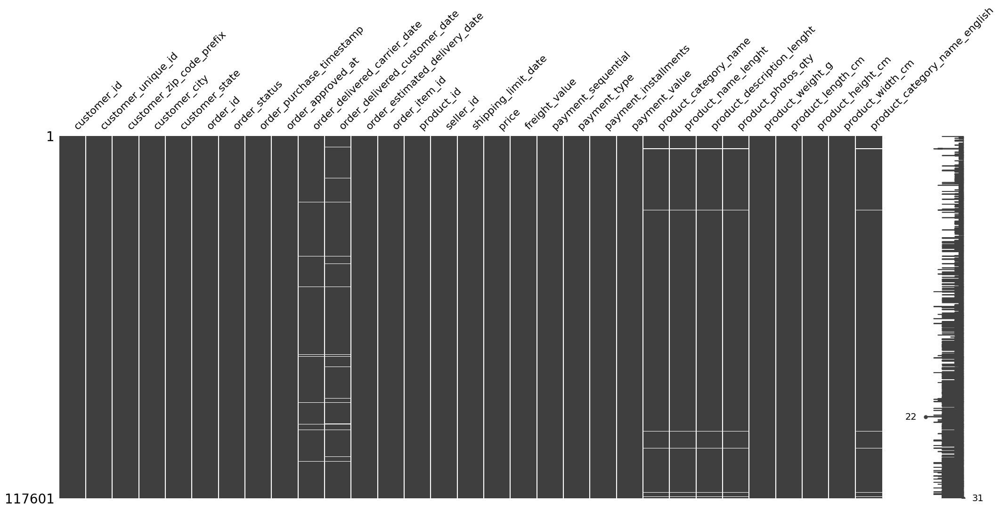

In [ ]:
missingno.matrix(df_prep)

Dari data diatas, didapatkan informasi yaitu terdapat 15 missing values pada order_approved_at, 1245 missing values pada order_delivered_carrier_date, dan 2567 missing values pada order_delivered_customer_date. Missing values tersebut akan diisi sebagai berikut:
1. Kolom Order Approved at -> Kolom Order Purchase Timestamp
2. Kolom Delivered Carrier Data & Deliverid Customer Date akan disesuaikan dengan status ordernya, apabila status order cancel/unavailable akan dilakukan drop karna kita tidak mengklustering data tersebut. Untuk status order lainnya akan diisi dengan rata-rata pengiriman.
3. Kolom Product Category Name, Product Name, Product Description Length, Product Photos Qty, Product Weight, Product Height, Product Width -> untuk kolom kita lakukan drop baris yang memiliki missing value.

#### 1. Missing Values pada Kolom Order Approved at

In [ ]:
df_prep[df_prep['order_approved_at'].isna()]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
14628,1e101e0daffaddce8159d25a8e53f2b2,c8822fce1d0bfa7ddf0da24fff947172,27945,macae,RJ,12a95a3c06dbaec84bcfb0e2da5d228a,delivered,2017-02-17 13:05:55,NaN,2017-02-22 11:23:11,...,95.76,cool_stuff,54.0,1012.0,1.0,1200.0,42.0,25.0,15.0,cool_stuff
14670,74bebaf46603f9340e3b50c6b086f992,f79be7c08dd24b72d34634f1b89333a4,65110,sao jose de ribamar,MA,2babbb4b15e6d2dfe95e2de765c97bce,delivered,2017-02-18 17:15:03,NaN,2017-02-22 11:23:11,...,106.81,cool_stuff,54.0,1012.0,1.0,1200.0,42.0,25.0,15.0,cool_stuff
14700,29c35fc91fc13fb5073c8f30505d860d,7e1a5ca61b572d76b64b6688b9f96473,62700,caninde,CE,5cf925b116421afa85ee25e99b4c34fb,delivered,2017-02-18 16:48:35,NaN,2017-02-22 11:23:10,...,106.81,cool_stuff,54.0,1012.0,1.0,1200.0,42.0,25.0,15.0,cool_stuff
16867,f67cd1a215aae2a1074638bbd35a223a,bc1896dc77f49e6dec880445a9b443a3,21020,rio de janeiro,RJ,88083e8f64d95b932164187484d90212,delivered,2017-02-18 22:49:19,NaN,2017-02-22 11:31:06,...,127.04,telefonia,61.0,440.0,1.0,250.0,18.0,3.0,28.0,telephony
16868,f67cd1a215aae2a1074638bbd35a223a,bc1896dc77f49e6dec880445a9b443a3,21020,rio de janeiro,RJ,88083e8f64d95b932164187484d90212,delivered,2017-02-18 22:49:19,NaN,2017-02-22 11:31:06,...,127.04,telefonia,61.0,440.0,1.0,250.0,18.0,3.0,28.0,telephony
39176,07a2a7e0f63fd8cb757ed77d4245623c,79af1bbf230a2630487975aa5d7d6220,37660,paraisopolis,MG,51eb2eebd5d76a24625b31c33dd41449,delivered,2017-02-18 15:52:27,NaN,2017-02-23 03:09:14,...,77.06,moveis_decoracao,59.0,438.0,1.0,1200.0,30.0,5.0,20.0,furniture_decor
46407,d5de688c321096d15508faae67a27051,d49f3dae6bad25d05160fc17aca5942d,36400,conselheiro lafaiete,MG,7002a78c79c519ac54022d4f8a65e6e8,delivered,2017-01-19 22:26:59,NaN,2017-01-27 11:08:05,...,60.42,moveis_decoracao,59.0,473.0,1.0,600.0,30.0,3.0,20.0,furniture_decor
60071,0bf35cac6cc7327065da879e2d90fae8,c4c0011e639bdbcf26059ddc38bd3c18,13225,varzea paulista,SP,d77031d6a3c8a52f019764e68f211c69,delivered,2017-02-18 11:04:19,NaN,2017-02-23 07:23:36,...,39.95,esporte_lazer,60.0,1738.0,1.0,300.0,16.0,15.0,15.0,sports_leisure
63204,68d081753ad4fe22fc4d410a9eb1ca01,2e0a2166aa23da2472c6a60c4af6f7a6,3573,sao paulo,SP,d69e5d356402adc8cf17e08b5033acfb,delivered,2017-02-19 01:28:47,NaN,2017-02-23 03:11:48,...,163.43,moveis_decoracao,54.0,586.0,1.0,1700.0,33.0,8.0,23.0,furniture_decor
64611,2941af76d38100e0f8740a374f1a5dc3,e1f01a1bd6485e58ad3c769a5427d8a8,8230,sao paulo,SP,7013bcfc1c97fe719a7b5e05e61c12db,delivered,2017-02-18 13:29:47,NaN,2017-02-22 16:25:25,...,65.52,NaN,NaN,NaN,NaN,3100.0,28.0,28.0,50.0,NaN


Apabila dilihat lebih lanjut, antara kolom purchase timestamp dengan order approved at diproses dihari yang sama. sehingga untuk mengisi missing value, akan kita isi dengan nilai yang sama pada kolom order purchase timestamp

In [ ]:
df_prep['order_approved_at'] = df_prep['order_approved_at'].fillna(df_prep['order_purchase_timestamp'])

#### 2. Missing Values pada kolom Order Delivered Carrier Date & Order Delivered Customer Date

In [ ]:
df_prep[df_prep['order_delivered_carrier_date'].isna() | df_prep['order_delivered_customer_date'].isna()]

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
347,c43ef016bf2cafe5db5e670dee714ccd,818048bd4969b726179cf5ab040f9245,26280,nova iguacu,RJ,6b34bb840d9211dc1a1f94e049a79de4,shipped,2018-03-04 11:52:08,2018-03-05 11:56:09,2018-03-06 20:22:27,...,161.23,ferramentas_jardim,39.0,500.0,1.0,8325.0,43.0,14.0,33.0,garden_tools
426,bb248d53ccfad4213d4cc085f4ea8605,37599ecc41d3ff5f4605abeb5145ea59,4840,sao paulo,SP,b7ee003a15e0771e300ba4fa565c1cde,shipped,2017-06-06 22:31:52,2017-06-06 22:45:14,2017-06-07 15:58:40,...,103.55,cama_mesa_banho,54.0,245.0,1.0,1383.0,50.0,10.0,40.0,bed_bath_table
439,10b7134ae8b326cdb2d42aedd3093bc7,05950dd13be9313da9752082073de48d,25245,duque de caxias,RJ,4483bebac87f089540f2e5be0a6589f6,shipped,2017-08-18 18:38:54,2017-08-18 18:50:19,2017-08-21 14:13:59,...,74.99,cama_mesa_banho,54.0,245.0,1.0,1383.0,50.0,10.0,40.0,bed_bath_table
440,10b7134ae8b326cdb2d42aedd3093bc7,05950dd13be9313da9752082073de48d,25245,duque de caxias,RJ,4483bebac87f089540f2e5be0a6589f6,shipped,2017-08-18 18:38:54,2017-08-18 18:50:19,2017-08-21 14:13:59,...,32.79,cama_mesa_banho,54.0,245.0,1.0,1383.0,50.0,10.0,40.0,bed_bath_table
466,f7f4c88bd5093db7e3fc7baad3cd8deb,fe52c2abb172426dd6416cc69e6b3689,6754,taboao da serra,SP,0d760576500ea8611379a97ddcebf3db,shipped,2017-09-16 12:30:24,2017-09-19 03:44:09,2017-09-20 16:09:20,...,106.16,cama_mesa_banho,54.0,245.0,1.0,1383.0,50.0,10.0,40.0,bed_bath_table
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117464,c06176336d389d51bdf77d87e4da8f6d,c474aa6535920a61d59568be0ecfa4c2,12230,sao jose dos campos,SP,a78cdda0b536155a210b115c530b1964,processing,2017-05-22 13:41:03,2017-05-22 13:50:24,NaN,...,102.06,fashion_bolsas_e_acessorios,58.0,431.0,1.0,50.0,16.0,8.0,11.0,fashion_bags_accessories
117494,2034cc6d6d517007a9ba3e22ba643344,cb47d51801e7379766c5cd8ff623f37f,13052,campinas,SP,27d6012b882832dc9ddcf34304eeb77c,canceled,2017-11-11 10:44:49,2017-11-11 10:55:28,NaN,...,96.88,fashion_bolsas_e_acessorios,31.0,101.0,2.0,50.0,16.0,8.0,11.0,fashion_bags_accessories
117514,89bd3cf6475e5036e8e417aa3851e548,24e41e128621c84e494ed29699cacf7a,28024,campos dos goytacazes,RJ,21533e635256523fb56f1ce0d97439b9,shipped,2017-11-07 21:45:08,2017-11-07 21:55:38,2017-11-09 15:56:58,...,198.57,moveis_decoracao,28.0,493.0,3.0,11100.0,47.0,46.0,33.0,furniture_decor
117541,da231380834f900e3fc3a958a1533a33,e3626c985901df173504f3d285ac823f,24937,marica,RJ,42c5091238dc63339c79f5f35f8a5a6b,invoiced,2016-10-10 09:57:05,2016-10-10 11:04:04,NaN,...,338.68,market_place,43.0,919.0,4.0,7500.0,24.0,38.0,23.0,market_place


In [ ]:
df_prep[df_prep['order_delivered_carrier_date'].isna() | df_prep['order_delivered_customer_date'].isna()].groupby('order_status').size()

order_status
approved          3
canceled        559
delivered         9
invoiced        371
processing      375
shipped        1244
unavailable       7
dtype: int64

##### **Missing Values untuk status Approved**

In [ ]:
approved_nan_carrier_date = df_prep[(df_prep['order_status'] == 'approved') & (df_prep['order_delivered_carrier_date'].isna())]
approved_nan_carrier_date

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
41292,8886130db0ea6e9e70ba0b03d7c0d286,7b9d52d22310baecad0f9df64872208d,35590,lagoa da prata,MG,a2e4c44360b4a57bdff22f3a4630c173,approved,2017-02-06 20:18:17,2017-02-06 20:30:19,NaN,...,61.62,informatica_acessorios,52.0,589.0,1.0,100.0,16.0,19.0,16.0,computers_accessories
41293,8886130db0ea6e9e70ba0b03d7c0d286,7b9d52d22310baecad0f9df64872208d,35590,lagoa da prata,MG,a2e4c44360b4a57bdff22f3a4630c173,approved,2017-02-06 20:18:17,2017-02-06 20:30:19,NaN,...,61.62,informatica_acessorios,52.0,589.0,1.0,100.0,16.0,19.0,16.0,computers_accessories
113595,b2191912d8ad6eac2e4dc3b6e1459515,6a068ccd3a149b5c8ceb4e04c83feb8a,8255,sao paulo,SP,132f1e724165a07f6362532bfb97486e,approved,2017-04-25 01:25:34,2017-04-30 20:32:41,NaN,...,179.46,utilidades_domesticas,26.0,52.0,6.0,50.0,53.0,8.0,27.0,housewares


In [ ]:
# Convert columns to datetime objects if they are not already
df_prep['order_delivered_carrier_date'] = pd.to_datetime(df_prep['order_delivered_carrier_date'])
df_prep['order_purchase_timestamp'] = pd.to_datetime(df_prep['order_purchase_timestamp'])

# Hitung selisih waktu antara order_delivered_carrier_date dan order_purchase_timestime
df_prep['delivery_carrier_time'] = df_prep['order_delivered_carrier_date'] - df_prep['order_purchase_timestamp']

# Hitung rata-rata waktu pesanan akan dikirim
mean_delivery_carrier_time = df_prep['delivery_carrier_time'].mean()

print("\nRata-rata waktu pesanan akan dikirim:", mean_delivery_carrier_time)

# Mengganti nilai NaN pada kolom order_delivered_carrier_date dengan mean_delivery_carrier_time
mask = (df_prep['order_status'] == 'approved') & (df_prep['order_delivered_carrier_date'].isna())
df_prep.loc[mask, 'order_delivered_carrier_date'] = df_prep.loc[mask, 'order_purchase_timestamp'] + mean_delivery_carrier_time


Rata-rata waktu pesanan akan dikirim: 3 days 06:55:40.087421362


In [ ]:
approved_nan_customer_date = df_prep[(df_prep['order_status'] == 'approved') & (df_prep['order_delivered_customer_date'].isna())]
approved_nan_customer_date

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,delivery_carrier_time
41292,8886130db0ea6e9e70ba0b03d7c0d286,7b9d52d22310baecad0f9df64872208d,35590,lagoa da prata,MG,a2e4c44360b4a57bdff22f3a4630c173,approved,2017-02-06 20:18:17,2017-02-06 20:30:19,2017-02-10 03:13:57.087421362,...,informatica_acessorios,52.0,589.0,1.0,100.0,16.0,19.0,16.0,computers_accessories,NaT
41293,8886130db0ea6e9e70ba0b03d7c0d286,7b9d52d22310baecad0f9df64872208d,35590,lagoa da prata,MG,a2e4c44360b4a57bdff22f3a4630c173,approved,2017-02-06 20:18:17,2017-02-06 20:30:19,2017-02-10 03:13:57.087421362,...,informatica_acessorios,52.0,589.0,1.0,100.0,16.0,19.0,16.0,computers_accessories,NaT
113595,b2191912d8ad6eac2e4dc3b6e1459515,6a068ccd3a149b5c8ceb4e04c83feb8a,8255,sao paulo,SP,132f1e724165a07f6362532bfb97486e,approved,2017-04-25 01:25:34,2017-04-30 20:32:41,2017-04-28 08:21:14.087421362,...,utilidades_domesticas,26.0,52.0,6.0,50.0,53.0,8.0,27.0,housewares,NaT


In [ ]:
# Hitung selisih waktu antara order_delivered_customer_date dan order_purchase_timestime
df_prep['delivery_customer_time'] = (
    pd.to_datetime(df_prep['order_delivered_customer_date']) -
    pd.to_datetime(df_prep['order_purchase_timestamp'])
)

# Hitung rata-rata waktu pesanan akan dikirim
mean_delivery_customer_time = df_prep['delivery_customer_time'].mean()

print("\nRata-rata waktu pesanan akan diterima pelanggan:", mean_delivery_customer_time)

# Mengganti nilai NaN pada kolom order_delivered_customer_date dengan mean_delivery_customer_time
mask = (df_prep['order_status'] == 'approved') & (df_prep['order_delivered_customer_date'].isna())
df_prep.loc[mask, 'order_delivered_customer_date'] = df_prep.loc[mask, 'order_purchase_timestamp'] + mean_delivery_customer_time


Rata-rata waktu pesanan akan diterima pelanggan: 12 days 11:36:35.858233218


##### **Missing Values untuk Status Canceled**

Pada dataset ini, masih terdapat historis pesanan yang tercancel, karna dalam analisa & modelling data tersebut tidak kita butuhkan, maka kita lakukan drop pada data dengan status order canceled.

In [ ]:
# drop baris dengan status order canceled

df_prep = df_prep[df_prep['order_status'] != 'canceled']

##### **Missing Values untuk status Delivered**

In [ ]:
delivered_nan_carrier_date = df_prep[(df_prep['order_status'] == 'delivered') & (df_prep['order_delivered_carrier_date'].isna())]
delivered_nan_carrier_date

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,delivery_carrier_time,delivery_customer_time
114571,afeb16c7f46396c0ed54acb45ccaaa40,a2ac81ecc3704410ae240e74d4f0af40,13334,indaiatuba,SP,2aa91108853cecb43c84a5dc5b277475,delivered,2017-09-29 08:52:58,2017-09-29 09:07:16,NaT,...,54.0,984.0,2.0,7000.0,16.0,50.0,55.0,furniture_decor,NaT,52 days 10:51:49
117168,e08caf668d499a6d643dafd7c5cc498a,d77cf4be2654aa70ef150f8bfec076a6,91330,porto alegre,RS,2d858f451373b04fb5c984a1cc2defaf,delivered,2017-05-25 23:22:43,2017-05-25 23:30:16,NaT,...,43.0,1873.0,2.0,900.0,26.0,26.0,26.0,sports_leisure,NaT,NaT


In [ ]:
delivered_nan_customer_date = df_prep[(df_prep['order_status'] == 'delivered') & (df_prep['order_delivered_customer_date'].isna())]
delivered_nan_customer_date

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,delivery_carrier_time,delivery_customer_time
5249,ec05a6d8558c6455f0cbbd8a420ad34f,13467e882eb3a701826435ee4424f2bd,18520,cerquilho,SP,2d1e2d5bf4dc7227b3bfebb81328c15f,delivered,2017-11-28 17:44:07,2017-11-28 17:56:40,2017-11-30 18:12:23,...,53.0,555.0,1.0,4105.0,67.0,10.0,67.0,auto,2 days 00:28:16,NaT
22719,29f0540231702fda0cfdee0a310f11aa,1bd06a0c0df8b23dacfd3725d2dc0bb9,12445,pindamonhangaba,SP,2ebdfc4f15f23b91474edf87475f108e,delivered,2018-07-01 17:05:11,2018-07-01 17:15:12,2018-07-03 13:57:00,...,42.0,938.0,5.0,275.0,16.0,14.0,14.0,watches_gifts,1 days 20:51:49,NaT
22734,cfda40ca8dd0a5d486a9635b611b398a,3bc508d482a402715be4d5cf4020cc81,13170,sumare,SP,e69f75a717d64fc5ecdfae42b2e8e086,delivered,2018-07-01 22:05:55,2018-07-01 22:15:14,2018-07-03 13:57:00,...,42.0,938.0,5.0,275.0,16.0,14.0,14.0,watches_gifts,1 days 15:51:05,NaT
60226,5e89028e024b381dc84a13a3570decb4,2f17c5b324ad603491521b279a9ff4de,18255,quadra,SP,f5dd62b788049ad9fc0526e3ad11a097,delivered,2018-06-20 06:58:43,2018-06-20 07:19:05,2018-06-25 08:05:00,...,48.0,1581.0,1.0,7750.0,36.0,51.0,18.0,industry_commerce_and_business,5 days 01:06:17,NaT
62028,28c37425f1127d887d7337f284080a0f,175378436e2978be55b8f4316bce4811,9431,ribeirao pires,SP,20edc82cf5400ce95e1afacc25798b31,delivered,2018-06-27 16:09:12,2018-06-27 16:29:30,2018-07-03 19:26:00,...,43.0,838.0,1.0,550.0,26.0,7.0,36.0,books_general_interest,6 days 03:16:48,NaT
107490,4f1d63d35fb7c8999853b2699f5c7649,ebf7e0d43a78c81991a4c59c145c75db,13560,sao carlos,SP,0d3268bad9b086af767785e3f0fc0133,delivered,2018-07-01 21:14:02,2018-07-01 21:29:54,2018-07-03 09:28:00,...,12.0,503.0,1.0,967.0,37.0,23.0,27.0,toys,1 days 12:13:58,NaT
114100,dd1b84a7286eb4524d52af4256c0ba24,cce5e8188bf42ffb3bb5b18ff58f5965,7261,guarulhos,SP,ab7c89dc1bf4a1ead9d6ec1ec8968a84,delivered,2018-06-08 12:09:39,2018-06-08 12:36:39,2018-06-12 14:10:00,...,45.0,837.0,1.0,1133.0,16.0,15.0,20.0,computers_accessories,4 days 02:00:21,NaT
117168,e08caf668d499a6d643dafd7c5cc498a,d77cf4be2654aa70ef150f8bfec076a6,91330,porto alegre,RS,2d858f451373b04fb5c984a1cc2defaf,delivered,2017-05-25 23:22:43,2017-05-25 23:30:16,NaT,...,43.0,1873.0,2.0,900.0,26.0,26.0,26.0,sports_leisure,NaT,NaT


Pada pesenan dengan order status delivered, namun tidak terdapat tanggal penerimannya, hal ini berarti pesanan tidak diterima oleh customer atau dalam hal ini barang pesanan tersebut hilang. Sehingga kita akan menghapus data tersebut

In [ ]:
# drop baris yang order status delivered namun tgl order deliver carrier null
df_prep = df_prep.loc[~((df_prep['order_status'] == 'delivered') & (df_prep['order_delivered_carrier_date'].isna()))]

# drop baris yang order status delivered namun tgl deliver customer null
df_prep = df_prep.loc[~((df_prep['order_status'] == 'delivered') & (df_prep['order_delivered_customer_date'].isna()))]

##### **Missing Values untuk status Invoiced**

In [ ]:
invoiced_nan_carrier_date = df_prep[(df_prep['order_status'] == 'invoiced') & (df_prep['order_delivered_carrier_date'].isna())]
invoiced_nan_carrier_date

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,delivery_carrier_time,delivery_customer_time
734,159ad0f6cbd047fb360f05bb09e6cfe4,fad2e77bba064ef0e420aae76fb3eea1,19600,rancharia,SP,9ee84e2bfcbb0e4aa06217c6ecbab36e,invoiced,2017-11-09 13:33:20,2017-11-10 03:10:46,NaT,...,54.0,245.0,1.0,1383.0,50.0,10.0,40.0,bed_bath_table,NaT,NaT
1352,293b54046b97ac0c171e5cb2dcd911f1,288ee8f382b32bc001646e4fb85c8d6b,37550,pouso alegre,MG,834780043eaf86f9e26f352161b6dfa8,invoiced,2017-07-31 23:06:33,2017-08-02 02:55:25,NaT,...,55.0,1158.0,2.0,400.0,30.0,10.0,30.0,baby,NaT,NaT
1620,d04b499809157673780addf5719f7af1,357ab7c8b61c05fbb41dd7aaf93ee4bd,17022,bauru,SP,2da6df6ecc3f69f3642ce1fafad85d5a,invoiced,2018-08-07 22:22:53,2018-08-07 22:35:23,NaT,...,43.0,187.0,1.0,750.0,40.0,4.0,30.0,bed_bath_table,NaT,NaT
2966,c132855c926907970dcf6f2bf0b33a24,a8ae36a2bb6c2bbc3b5d62ede131c9ef,18740,taquarituba,SP,b5172d4a722c0ebb34c29bbbb7a3cb42,invoiced,2018-04-17 13:14:13,2018-04-18 05:31:51,NaT,...,56.0,586.0,2.0,300.0,25.0,11.0,18.0,consoles_games,NaT,NaT
4172,fb97bced7f8d4fbff1093208daeaf4af,52b839404c605fbcc692e26872615c0a,36400,conselheiro lafaiete,MG,f330860e4cc30640994fc5d022b00934,invoiced,2018-04-11 16:51:09,2018-04-11 17:10:48,NaT,...,NaN,NaN,NaN,400.0,20.0,12.0,15.0,NaN,NaT,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116684,ad4bd45f6fff9e63bc8447af2af95544,8293393fa92d4db6500fc4cda0ef3537,7500,santa isabel,SP,a6ddd2889891733e0af306332c71a3b8,invoiced,2018-02-14 13:38:46,2018-02-14 13:50:32,NaT,...,60.0,926.0,4.0,1390.0,18.0,11.0,25.0,furniture_decor,NaT,NaT
116855,3d28d14c658443737fdd829791fa639a,0db98973376d0cb34259fc975bc78f04,3143,sao paulo,SP,cba0deb7b7e121a54760408a83ecc42c,invoiced,2018-08-06 15:03:43,2018-08-06 15:15:26,NaT,...,58.0,812.0,1.0,230.0,16.0,16.0,16.0,health_beauty,NaT,NaT
117096,478e7fe4d6b284021cbb2652305ad5ba,39a8a031f95408b55af24858e9be8e68,12990,pedra bela,SP,1b70a3be341959c3c0ea4bd4def0b526,invoiced,2017-12-27 15:02:03,2017-12-27 15:10:24,NaT,...,32.0,1334.0,1.0,12050.0,90.0,20.0,40.0,home_construction,NaT,NaT
117173,47ede0e6f7b364a296f96c88e2552d37,a6d0c6a200ed549e77aecf56cb6172fe,14015,ribeirao preto,SP,8d3280c1ecf98c7dce004f7c67d67acf,invoiced,2017-05-09 08:20:16,2017-05-10 02:50:37,NaT,...,30.0,703.0,1.0,200.0,20.0,20.0,20.0,electronics,NaT,NaT


In [ ]:
# Hitung selisih waktu antara order_delivered_carrier_date dan order_purchase_timestime
df_prep['delivery_carrier_time'] = df_prep['order_delivered_carrier_date'] - df_prep['order_purchase_timestamp']

# Hitung rata-rata waktu pesanan akan dikirim
mean_delivery_carrier_time = df_prep['delivery_carrier_time'].mean()

print("\nRata-rata waktu pesanan akan dikirim:", mean_delivery_carrier_time)

# Mengganti nilai NaN pada kolom order_delivered_carrier_date dengan mean_delivery_carrier_time
mask = (df_prep['order_status'] == 'invoiced') & (df_prep['order_delivered_carrier_date'].isna())
df_prep.loc[mask, 'order_delivered_carrier_date'] = df_prep.loc[mask, 'order_purchase_timestamp'] + mean_delivery_carrier_time


Rata-rata waktu pesanan akan dikirim: 3 days 06:55:25.169026878


In [ ]:
invoiced_nan_customer_date = df_prep[(df_prep['order_status'] == 'invoiced') & (df_prep['order_delivered_customer_date'].isna())]
invoiced_nan_customer_date

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,delivery_carrier_time,delivery_customer_time
734,159ad0f6cbd047fb360f05bb09e6cfe4,fad2e77bba064ef0e420aae76fb3eea1,19600,rancharia,SP,9ee84e2bfcbb0e4aa06217c6ecbab36e,invoiced,2017-11-09 13:33:20,2017-11-10 03:10:46,2017-11-12 20:28:45.169026878,...,54.0,245.0,1.0,1383.0,50.0,10.0,40.0,bed_bath_table,NaT,NaT
1352,293b54046b97ac0c171e5cb2dcd911f1,288ee8f382b32bc001646e4fb85c8d6b,37550,pouso alegre,MG,834780043eaf86f9e26f352161b6dfa8,invoiced,2017-07-31 23:06:33,2017-08-02 02:55:25,2017-08-04 06:01:58.169026878,...,55.0,1158.0,2.0,400.0,30.0,10.0,30.0,baby,NaT,NaT
1620,d04b499809157673780addf5719f7af1,357ab7c8b61c05fbb41dd7aaf93ee4bd,17022,bauru,SP,2da6df6ecc3f69f3642ce1fafad85d5a,invoiced,2018-08-07 22:22:53,2018-08-07 22:35:23,2018-08-11 05:18:18.169026878,...,43.0,187.0,1.0,750.0,40.0,4.0,30.0,bed_bath_table,NaT,NaT
2966,c132855c926907970dcf6f2bf0b33a24,a8ae36a2bb6c2bbc3b5d62ede131c9ef,18740,taquarituba,SP,b5172d4a722c0ebb34c29bbbb7a3cb42,invoiced,2018-04-17 13:14:13,2018-04-18 05:31:51,2018-04-20 20:09:38.169026878,...,56.0,586.0,2.0,300.0,25.0,11.0,18.0,consoles_games,NaT,NaT
4172,fb97bced7f8d4fbff1093208daeaf4af,52b839404c605fbcc692e26872615c0a,36400,conselheiro lafaiete,MG,f330860e4cc30640994fc5d022b00934,invoiced,2018-04-11 16:51:09,2018-04-11 17:10:48,2018-04-14 23:46:34.169026878,...,NaN,NaN,NaN,400.0,20.0,12.0,15.0,NaN,NaT,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116684,ad4bd45f6fff9e63bc8447af2af95544,8293393fa92d4db6500fc4cda0ef3537,7500,santa isabel,SP,a6ddd2889891733e0af306332c71a3b8,invoiced,2018-02-14 13:38:46,2018-02-14 13:50:32,2018-02-17 20:34:11.169026878,...,60.0,926.0,4.0,1390.0,18.0,11.0,25.0,furniture_decor,NaT,NaT
116855,3d28d14c658443737fdd829791fa639a,0db98973376d0cb34259fc975bc78f04,3143,sao paulo,SP,cba0deb7b7e121a54760408a83ecc42c,invoiced,2018-08-06 15:03:43,2018-08-06 15:15:26,2018-08-09 21:59:08.169026878,...,58.0,812.0,1.0,230.0,16.0,16.0,16.0,health_beauty,NaT,NaT
117096,478e7fe4d6b284021cbb2652305ad5ba,39a8a031f95408b55af24858e9be8e68,12990,pedra bela,SP,1b70a3be341959c3c0ea4bd4def0b526,invoiced,2017-12-27 15:02:03,2017-12-27 15:10:24,2017-12-30 21:57:28.169026878,...,32.0,1334.0,1.0,12050.0,90.0,20.0,40.0,home_construction,NaT,NaT
117173,47ede0e6f7b364a296f96c88e2552d37,a6d0c6a200ed549e77aecf56cb6172fe,14015,ribeirao preto,SP,8d3280c1ecf98c7dce004f7c67d67acf,invoiced,2017-05-09 08:20:16,2017-05-10 02:50:37,2017-05-12 15:15:41.169026878,...,30.0,703.0,1.0,200.0,20.0,20.0,20.0,electronics,NaT,NaT


In [ ]:
# Hitung selisih waktu antara order_delivered_customer_date dan order_purchase_timestime
df_prep['delivery_customer_time'] = (
    pd.to_datetime(df_prep['order_delivered_customer_date']) -
    pd.to_datetime(df_prep['order_purchase_timestamp'])
)

# Hitung rata-rata waktu pesanan akan diterima oleh pelanggan
mean_delivery_customer_time = df_prep['delivery_customer_time'].mean()

print("\nRata-rata waktu pesanan akan diterima pelanggan:", mean_delivery_customer_time)

# Mengganti nilai NaN pada kolom order_delivered_customer_date dengan mean_delivery_customer_time
mask = (df_prep['order_status'] == 'invoiced') & (df_prep['order_delivered_customer_date'].isna())
df_prep.loc[mask, 'order_delivered_customer_date'] = (
    pd.to_datetime(df_prep.loc[mask, 'order_purchase_timestamp']) +
    mean_delivery_customer_time
)


Rata-rata waktu pesanan akan diterima pelanggan: 12 days 11:35:34.032292506


##### **Missing Values untuk status Processing**

In [ ]:
processing_nan_carrier_date = df_prep[(df_prep['order_status'] == 'processing') & (df_prep['order_delivered_carrier_date'].isna())]
processing_nan_carrier_date

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,delivery_carrier_time,delivery_customer_time
8070,3714eb406c7704a920e504085717ea5b,56d30b9f16c42d707d89967161296a04,84200,jaguariaiva,PR,fdd647b689626410b725d1cce2ddf37c,processing,2017-12-04 10:09:35,2017-12-27 14:03:00,NaT,...,42.0,972.0,2.0,140.0,16.0,13.0,13.0,auto,NaT,NaT
11680,fdf40effea31c11e4955889228003faa,c1b663ef6272ff98a62943b5ff2bc666,6805,embu das artes,SP,a70705507f1747c0201350acad9d1408,processing,2017-12-15 09:16:12,2017-12-15 09:24:30,NaT,...,45.0,520.0,3.0,600.0,26.0,8.0,22.0,furniture_decor,NaT,NaT
12617,daf6556f032ed495209024a61f359cbc,23ac8dd141d3140b9eba0bf415fb8be9,35545,perdigao,MG,3a7ca38e787a31a356329fad4b45ac35,processing,2018-02-16 08:57:03,2018-02-16 09:07:08,NaT,...,54.0,506.0,2.0,267.0,16.0,17.0,13.0,watches_gifts,NaT,NaT
13594,d2f56edf04860c63c1cb9e4e144fae41,37b7649b45c26eaa7f8b45f4adec9c96,5836,sao paulo,SP,728ea734fefecc42ab07da89fa894f31,processing,2017-08-15 19:58:40,2017-08-16 03:25:15,NaT,...,60.0,1251.0,2.0,800.0,30.0,10.0,30.0,garden_tools,NaT,NaT
15176,3648dee9812c0ff9cc9aab93ea256ba8,799791ea009276e4a032b4e524886bfb,13334,indaiatuba,SP,e25b0e7a7493d60787761f999380b492,processing,2017-10-30 20:40:09,2017-10-30 22:31:36,NaT,...,54.0,1175.0,1.0,1064.0,24.0,20.0,19.0,sports_leisure,NaT,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116533,b1bd6e32de08eb41082fac5622c75fad,10c3c06a641e5d25577f483d4adad569,90850,porto alegre,RS,152c2472d13abe1c989b66d0a8c2dac9,processing,2017-10-15 14:58:12,2017-10-15 15:14:09,NaT,...,37.0,888.0,1.0,1000.0,30.0,5.0,30.0,bed_bath_table,NaT,NaT
116618,d6505f1e68ff1731c2b79517f47a8d4f,e9d46be2cf4eda58a25af60f153a39f2,53620,igarassu,PE,c2509daf9e1312fea710fc46902c9da8,processing,2017-03-16 14:15:16,2017-03-16 14:15:16,NaT,...,63.0,595.0,3.0,100.0,16.0,16.0,16.0,auto,NaT,NaT
116975,8721213de91e5eb5867eb97de23ec440,d1085742841cb2fae8916a506086de13,88780,imbituba,SC,aba7884f1a6e6e52b774eb7654651325,processing,2017-01-25 19:00:25,2017-01-25 19:10:11,NaT,...,63.0,1036.0,2.0,110.0,23.0,6.0,15.0,telephony,NaT,NaT
117238,88c7ed43b844a8645bad673db2d98774,dd08a6df51313e296a1861c1c2fec75c,28020,campos dos goytacazes,RJ,4bcb31b6a61c7fdbcb397a502edd29a1,processing,2017-07-24 10:16:56,2017-07-24 10:30:16,NaT,...,43.0,1519.0,4.0,700.0,24.0,3.0,24.0,garden_tools,NaT,NaT


In [ ]:
# Hitung selisih waktu antara order_delivered_carrier_date dan order_purchase_timestime
df_prep['delivery_carrier_time'] = df_prep['order_delivered_carrier_date'] - df_prep['order_purchase_timestamp']

# Hitung rata-rata waktu pesanan akan dikirim
mean_delivery_carrier_time = df_prep['delivery_carrier_time'].mean()

print("\nRata-rata waktu pesanan akan dikirim:", mean_delivery_carrier_time)

# Mengganti nilai NaN pada kolom order_delivered_carrier_date dengan mean_delivery_carrier_time
mask = (df_prep['order_status'] == 'processing') & (df_prep['order_delivered_carrier_date'].isna())
df_prep.loc[mask, 'order_delivered_carrier_date'] = df_prep.loc[mask, 'order_purchase_timestamp'] + mean_delivery_carrier_time


Rata-rata waktu pesanan akan dikirim: 3 days 06:55:25.169026878


In [ ]:
processing_nan_customer_date = df_prep[(df_prep['order_status'] == 'processing') & (df_prep['order_delivered_customer_date'].isna())]
processing_nan_customer_date

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,delivery_carrier_time,delivery_customer_time
8070,3714eb406c7704a920e504085717ea5b,56d30b9f16c42d707d89967161296a04,84200,jaguariaiva,PR,fdd647b689626410b725d1cce2ddf37c,processing,2017-12-04 10:09:35,2017-12-27 14:03:00,2017-12-07 17:05:00.169026878,...,42.0,972.0,2.0,140.0,16.0,13.0,13.0,auto,NaT,NaT
11680,fdf40effea31c11e4955889228003faa,c1b663ef6272ff98a62943b5ff2bc666,6805,embu das artes,SP,a70705507f1747c0201350acad9d1408,processing,2017-12-15 09:16:12,2017-12-15 09:24:30,2017-12-18 16:11:37.169026878,...,45.0,520.0,3.0,600.0,26.0,8.0,22.0,furniture_decor,NaT,NaT
12617,daf6556f032ed495209024a61f359cbc,23ac8dd141d3140b9eba0bf415fb8be9,35545,perdigao,MG,3a7ca38e787a31a356329fad4b45ac35,processing,2018-02-16 08:57:03,2018-02-16 09:07:08,2018-02-19 15:52:28.169026878,...,54.0,506.0,2.0,267.0,16.0,17.0,13.0,watches_gifts,NaT,NaT
13594,d2f56edf04860c63c1cb9e4e144fae41,37b7649b45c26eaa7f8b45f4adec9c96,5836,sao paulo,SP,728ea734fefecc42ab07da89fa894f31,processing,2017-08-15 19:58:40,2017-08-16 03:25:15,2017-08-19 02:54:05.169026878,...,60.0,1251.0,2.0,800.0,30.0,10.0,30.0,garden_tools,NaT,NaT
15176,3648dee9812c0ff9cc9aab93ea256ba8,799791ea009276e4a032b4e524886bfb,13334,indaiatuba,SP,e25b0e7a7493d60787761f999380b492,processing,2017-10-30 20:40:09,2017-10-30 22:31:36,2017-11-03 03:35:34.169026878,...,54.0,1175.0,1.0,1064.0,24.0,20.0,19.0,sports_leisure,NaT,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116533,b1bd6e32de08eb41082fac5622c75fad,10c3c06a641e5d25577f483d4adad569,90850,porto alegre,RS,152c2472d13abe1c989b66d0a8c2dac9,processing,2017-10-15 14:58:12,2017-10-15 15:14:09,2017-10-18 21:53:37.169026878,...,37.0,888.0,1.0,1000.0,30.0,5.0,30.0,bed_bath_table,NaT,NaT
116618,d6505f1e68ff1731c2b79517f47a8d4f,e9d46be2cf4eda58a25af60f153a39f2,53620,igarassu,PE,c2509daf9e1312fea710fc46902c9da8,processing,2017-03-16 14:15:16,2017-03-16 14:15:16,2017-03-19 21:10:41.169026878,...,63.0,595.0,3.0,100.0,16.0,16.0,16.0,auto,NaT,NaT
116975,8721213de91e5eb5867eb97de23ec440,d1085742841cb2fae8916a506086de13,88780,imbituba,SC,aba7884f1a6e6e52b774eb7654651325,processing,2017-01-25 19:00:25,2017-01-25 19:10:11,2017-01-29 01:55:50.169026878,...,63.0,1036.0,2.0,110.0,23.0,6.0,15.0,telephony,NaT,NaT
117238,88c7ed43b844a8645bad673db2d98774,dd08a6df51313e296a1861c1c2fec75c,28020,campos dos goytacazes,RJ,4bcb31b6a61c7fdbcb397a502edd29a1,processing,2017-07-24 10:16:56,2017-07-24 10:30:16,2017-07-27 17:12:21.169026878,...,43.0,1519.0,4.0,700.0,24.0,3.0,24.0,garden_tools,NaT,NaT


In [ ]:
# Hitung selisih waktu antara order_delivered_customer_date dan order_purchase_timestime
df_prep['delivery_customer_time'] = (
   pd.to_datetime(df_prep['order_delivered_customer_date']) -
    pd.to_datetime(df_prep['order_purchase_timestamp'])  # Convert to datetime for consistency
)

# Hitung rata-rata waktu pesanan akan diterima oleh pelanggan
mean_delivery_customer_time = df_prep['delivery_customer_time'].mean()

print("\nRata-rata waktu pesanan akan diterima pelanggan:", mean_delivery_customer_time)

# Mengganti nilai NaN pada kolom order_delivered_customer_date dengan mean_delivery_customer_time
mask = (df_prep['order_status'] == 'processing') & (df_prep['order_delivered_customer_date'].isna())
df_prep.loc[mask, 'order_delivered_customer_date'] = (
    df_prep.loc[mask, 'order_purchase_timestamp'] + mean_delivery_customer_time
)


Rata-rata waktu pesanan akan diterima pelanggan: 12 days 11:35:34.032292506


##### **Missing Values untuk status Shipped**

In [ ]:
shipped_nan_carrier_date = df_prep[(df_prep['order_status'] == 'shipped') & (df_prep['order_delivered_carrier_date'].isna())]
shipped_nan_carrier_date

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,delivery_carrier_time,delivery_customer_time


In [ ]:
shipped_nan_customer_date = df_prep[(df_prep['order_status'] == 'shipped') & (df_prep['order_delivered_customer_date'].isna())]
shipped_nan_customer_date

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,delivery_carrier_time,delivery_customer_time
347,c43ef016bf2cafe5db5e670dee714ccd,818048bd4969b726179cf5ab040f9245,26280,nova iguacu,RJ,6b34bb840d9211dc1a1f94e049a79de4,shipped,2018-03-04 11:52:08,2018-03-05 11:56:09,2018-03-06 20:22:27,...,39.0,500.0,1.0,8325.0,43.0,14.0,33.0,garden_tools,2 days 08:30:19,NaT
426,bb248d53ccfad4213d4cc085f4ea8605,37599ecc41d3ff5f4605abeb5145ea59,4840,sao paulo,SP,b7ee003a15e0771e300ba4fa565c1cde,shipped,2017-06-06 22:31:52,2017-06-06 22:45:14,2017-06-07 15:58:40,...,54.0,245.0,1.0,1383.0,50.0,10.0,40.0,bed_bath_table,0 days 17:26:48,NaT
439,10b7134ae8b326cdb2d42aedd3093bc7,05950dd13be9313da9752082073de48d,25245,duque de caxias,RJ,4483bebac87f089540f2e5be0a6589f6,shipped,2017-08-18 18:38:54,2017-08-18 18:50:19,2017-08-21 14:13:59,...,54.0,245.0,1.0,1383.0,50.0,10.0,40.0,bed_bath_table,2 days 19:35:05,NaT
440,10b7134ae8b326cdb2d42aedd3093bc7,05950dd13be9313da9752082073de48d,25245,duque de caxias,RJ,4483bebac87f089540f2e5be0a6589f6,shipped,2017-08-18 18:38:54,2017-08-18 18:50:19,2017-08-21 14:13:59,...,54.0,245.0,1.0,1383.0,50.0,10.0,40.0,bed_bath_table,2 days 19:35:05,NaT
466,f7f4c88bd5093db7e3fc7baad3cd8deb,fe52c2abb172426dd6416cc69e6b3689,6754,taboao da serra,SP,0d760576500ea8611379a97ddcebf3db,shipped,2017-09-16 12:30:24,2017-09-19 03:44:09,2017-09-20 16:09:20,...,54.0,245.0,1.0,1383.0,50.0,10.0,40.0,bed_bath_table,4 days 03:38:56,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117206,3f045735fd30e3e9900dc9fe56d05bbd,5d6043efeaeabd4391ba677793e67b91,5223,sao paulo,SP,f98dc0bb1b5d1102af20837256cca2c5,shipped,2018-06-10 14:46:38,2018-06-10 15:11:57,2018-06-11 13:08:00,...,36.0,47.0,2.0,117.0,18.0,10.0,14.0,perfumery,0 days 22:21:22,NaT
117447,f0f671d4034e98cdf20f0c452d6db02b,6532316a8c1a7c7a569482db073530bb,7231,guarulhos,SP,f73b31435ce6dec43df056154c39a1ce,shipped,2018-08-20 12:37:54,2018-08-20 15:35:42,2018-08-24 16:48:00,...,42.0,2129.0,1.0,15008.0,47.0,31.0,51.0,home_construction,4 days 04:10:06,NaT
117448,5dc6f4b9453584208557163c26079be1,e4326d8c6d585d237b12bced2443c73a,80240,curitiba,PR,e723fd90e2d095c2762e5e800d759bfa,shipped,2017-11-25 17:14:25,2017-11-25 17:32:04,2017-11-27 15:28:26,...,35.0,778.0,1.0,225.0,28.0,15.0,17.0,health_beauty,1 days 22:14:01,NaT
117514,89bd3cf6475e5036e8e417aa3851e548,24e41e128621c84e494ed29699cacf7a,28024,campos dos goytacazes,RJ,21533e635256523fb56f1ce0d97439b9,shipped,2017-11-07 21:45:08,2017-11-07 21:55:38,2017-11-09 15:56:58,...,28.0,493.0,3.0,11100.0,47.0,46.0,33.0,furniture_decor,1 days 18:11:50,NaT


In [ ]:
# Mengganti nilai NaN pada kolom order_delivered_customer_date menjadi nilai yang ada pada order_estimated_delivery_date
mask = (df_prep['order_status'] == 'shipped') & (df_prep['order_delivered_customer_date'].isna())
df_prep.loc[mask, 'order_delivered_customer_date'] = df_prep.loc[mask, 'order_estimated_delivery_date']

##### **Missing Values untuk status Unvailable**

Pada dataset ini, terdapat dengan order status unavailable yang artinya pesanan tersebut tidak tersedia. sehingga kita akan melakukan drop pada baris tersebut.

In [ ]:
df_prep = df_prep[df_prep['order_status'] != 'unavailable']

In [ ]:
##menghapus kolom tambahan yaitu delivery_customer_time & delivery_carrier_time  sebagai bantuan

df_prep = df_prep.drop(['delivery_customer_time', 'delivery_carrier_time'], axis=1)

# menghapus baris yang memiliki missing value pada kolom Product Category Name, Product Name, Product Description Length, Product Photos Qty, Product Weight, Product Height, Product Width
df_prep.dropna(inplace=True)

In [ ]:
df_prep.isna().sum().sort_values(ascending = False)

customer_id                      0
price                            0
product_width_cm                 0
product_height_cm                0
product_length_cm                0
product_weight_g                 0
product_photos_qty               0
product_description_lenght       0
product_name_lenght              0
product_category_name            0
payment_value                    0
payment_installments             0
payment_type                     0
payment_sequential               0
freight_value                    0
shipping_limit_date              0
customer_unique_id               0
seller_id                        0
product_id                       0
order_item_id                    0
order_estimated_delivery_date    0
order_delivered_customer_date    0
order_delivered_carrier_date     0
order_approved_at                0
order_purchase_timestamp         0
order_status                     0
order_id                         0
customer_state                   0
customer_city       

Setelah dilakukan pengecekan, sudah tidak terdapat missing value, sehingga dapat kita lakukan proses selanjutnya.

### Missing Value untuk Product Name

In [ ]:
df_prep[['product_id', 'product_category_name_english']].loc[df_prep['product_category_name'].isna()].head()

,product_id,product_category_name_english


In [ ]:
# Fill Missing Value with 'not_defined'
df_prep['product_category_name_english'] = df_prep['product_category_name_english'].fillna(value='not_defined')

In [ ]:
df_prep.drop(labels='product_category_name', inplace=True, axis=1)

## Handling Outliers

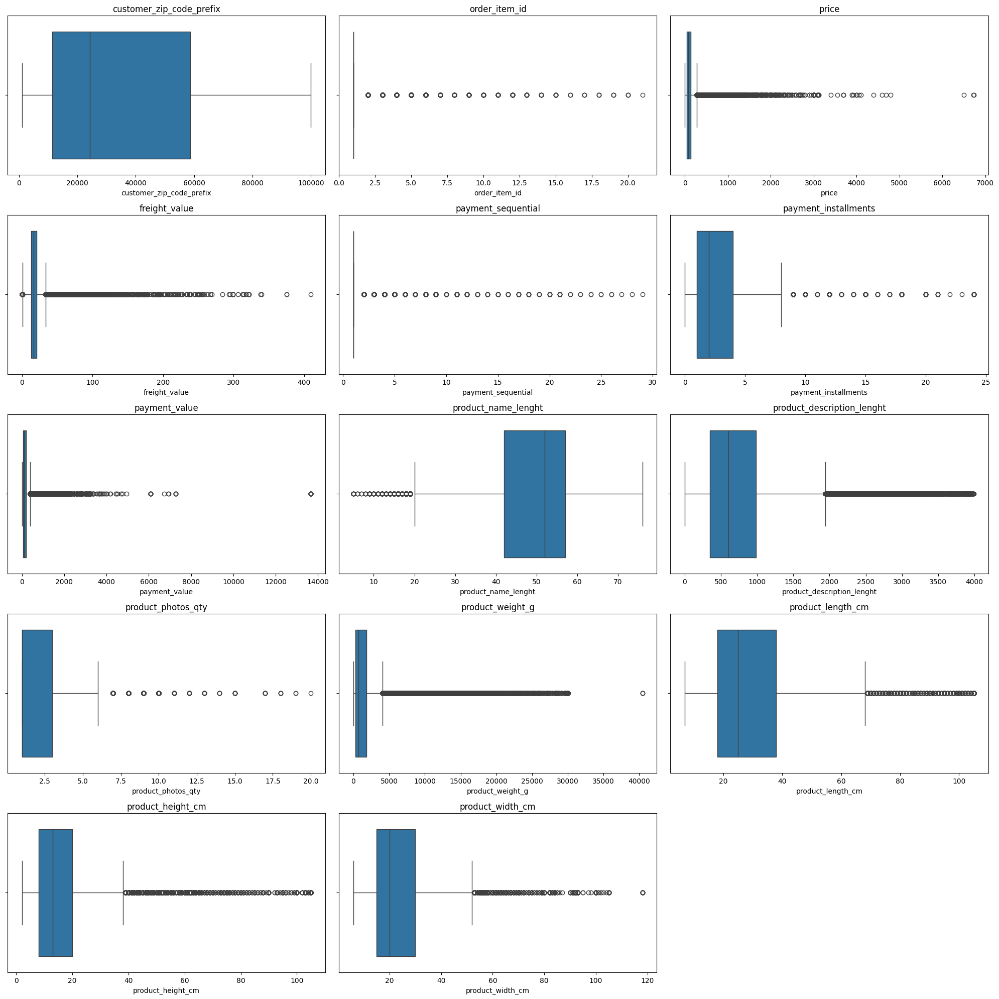

In [ ]:
numerik2 = df_prep.select_dtypes(include='number')
fig = plt.figure(figsize=(20,20)) # horizontal, vertikal

count = 0
for kolom in numerik2.columns:
    count += 1
    plt.subplot(5,3,count)
    sns.boxplot(numerik2, x = kolom)
    fig.tight_layout() # biar tidak tertumpuk
    plt.title(f'{kolom}')
plt.show()

In [ ]:
for kolom in numerik2.columns:
    q1 = df_prep[kolom].describe().loc['25%']
    q3 = df_prep[kolom].describe().loc['75%']
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    jumlah_outliers = df_prep[(df_prep[kolom] < lower_bound) | (df_prep[kolom] > upper_bound)].shape[0]
    print(f"data {kolom} memiliki outliers {jumlah_outliers}")

data customer_zip_code_prefix memiliki outliers 0
data order_item_id memiliki outliers 14263
data price memiliki outliers 8671
data freight_value memiliki outliers 12440
data payment_sequential memiliki outliers 4921
data payment_installments memiliki outliers 7892
data payment_value memiliki outliers 9302
data product_name_lenght memiliki outliers 789
data product_description_lenght memiliki outliers 7302
data product_photos_qty memiliki outliers 3189
data product_weight_g memiliki outliers 16374
data product_length_cm memiliki outliers 3761
data product_height_cm memiliki outliers 7927
data product_width_cm memiliki outliers 2696


Dari data diatas, didapatkan informasi yaitu:

- terdapat 14463 outliers pada order_item_id , 8736 outliers pada price, 12609 outliers pada freight_value, 5019 pada payment_sequential, 7954 pada payment_installment dan 9427 pada payment_value
- kolom customer_zip_code_prefix tidak memiliki outliers

In [ ]:
list_kolom = []
list_lim_bawah = []
list_lim_atas = []
list_min = []
list_max = []


for kolom in df_prep.select_dtypes(include=['float','int']).columns:
    data = df_prep[kolom]
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1
    limit = iqr*1.5

    limit_bawah = q1 - limit
    limit_atas = q3 + limit
    list_kolom.append(kolom)
    list_lim_bawah.append(limit_bawah)
    list_lim_atas.append(limit_atas)

    min_data = data.min()
    list_min.append(min_data)
    max_data = data.max()
    list_max.append(max_data)


pd.DataFrame(
{ 'Kolom' : list_kolom,
 'Limit Bawah' : list_lim_bawah,
 'Limit_Atas' : list_lim_atas,
 'Min' : list_min,
 'Max' : list_max
}
)

,Kolom,Limit Bawah,Limit_Atas,Min,Max
0,customer_zip_code_prefix,-59757.7500,129852.2500,1003.00,99980.00
1,order_item_id,1.0000,1.0000,1.00,21.00
2,price,-102.6000,277.4000,0.85,6735.00
3,freight_value,0.8550,33.4550,0.00,409.68
4,payment_sequential,1.0000,1.0000,1.00,29.00
5,payment_installments,-3.5000,8.5000,0.00,24.00
6,payment_value,-131.7925,382.3475,0.00,13664.08
7,product_name_lenght,19.5000,79.5000,5.00,76.00
8,product_description_lenght,-610.0000,1942.0000,4.00,3992.00
9,product_photos_qty,-2.0000,6.0000,1.00,20.00


Dapat dilihat, bahwa semua data kecuali data customer_zip_code_prefix memiliki outliers. Outliers ini dapat mempengaruhi performa model machine learning. Namun, tidak semua outliers harus dihilangkan, karena outliers ini juga memiliki informasi.

Jika outliers disebabkan oleh kesalahan pengukuran, kesalahan input data, atau anomali yang jelas tidak relevan, maka menghapusnya dapat meningkatkan kualitas data.

## Handling Duplicate

In [ ]:
# Mengecek apakah ada duplikat dalam DataFrame
if df_prep.duplicated().any():
    print("DataFrame memiliki duplikat.")
else:
    print("DataFrame tidak memiliki duplikat.")

DataFrame tidak memiliki duplikat.


Tidak ada missing values pada data lain

Karena dataframe tidak memiliki duplikat, berarti tidak ada yang perlu dilakukan di tahap ini

## Clean Data

In [ ]:
df_prep

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,2,146.87,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,1,275.79,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,1,275.79,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,...,7,140.61,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,...,10,137.58,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,office_furniture
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117596,da37711b17efd5f2539e8196ab215f04,5f2971f9805e3ccb030226e30c8e8390,4313,sao paulo,SP,c8203bb57639618630affac9e8e923dd,delivered,2017-03-27 23:04:18,2017-03-27 23:23:38,2017-03-28 14:18:59,...,1,30.95,43.0,779.0,1.0,300.0,16.0,16.0,16.0,pet_shop
117597,184e0c2cfc746789643521df0e9ff904,c64ede6d0ae8901b1b6fb03528c1b7e6,68660,sao miguel do guama,PA,45b3000bcd10464ac178f32cd783fc83,delivered,2017-12-07 23:55:46,2017-12-09 23:50:32,2017-12-11 20:29:02,...,4,304.11,40.0,1694.0,1.0,2400.0,33.0,10.0,16.0,health_beauty
117598,821a7275a08f32975caceff2e08ea262,046470763123d3d6364f89095b4e47ab,5734,sao paulo,SP,49645a8902c1ba980836b7bff991d69f,delivered,2018-04-04 17:50:52,2018-04-04 18:08:41,2018-04-05 16:36:49,...,3,92.36,29.0,498.0,4.0,300.0,16.0,16.0,11.0,fashion_bags_accessories
117599,1ed0c832c2dd99570a59260e71768bdf,82d46759af0369aad49084bacf85a6c3,37610,bom repouso,MG,51c6d2f460589fa7b65f2da51e860206,delivered,2017-11-14 12:04:09,2017-11-14 12:15:25,2017-11-27 20:44:47,...,5,167.79,33.0,63.0,1.0,6185.0,63.0,11.0,20.0,electronics


In [ ]:
## Check Again for Missing Value
for n, dataset in enumerate([df_prep]):
    prompt = 'df_olist'
    print('\n'+(f' Information Attribute of {prompt} DataSet ').center(151,'='))
    items = [[
        col,
        dataset[col].dtype,
        dataset[col].nunique(),
        list(dataset[col].unique()),
        dataset[col].isnull().sum()
    ] for col in dataset]

    pd.set_option('display.max_colwidth',100)
    display(pd.DataFrame(
        data=items,
        columns=[
            'Attributes',
            'Data Type',
            'Total Unique',
            'Unique Sample',
            'Total Missing'
        ]))


====================================================== Information Attribute of df_olist DataSet ======================================================


,Attributes,Data Type,Total Unique,Unique Sample,Total Missing
0,customer_id,object,96794,"[06b8999e2fba1a1fbc88172c00ba8bc7, 8912fc0c3bbf1e2fbf35819e21706718, f0ac8e5a239118859b1734e1087...",0
1,customer_unique_id,object,93654,"[861eff4711a542e4b93843c6dd7febb0, 9eae34bbd3a474ec5d07949ca7de67c0, 3c799d181c34d51f6d44bbbc563...",0
2,customer_zip_code_prefix,int64,14915,"[14409, 68030, 92480, 25931, 88460, 32341, 78134, 31270, 37540, 89115, 96083, 25640, 39495, 7850...",0
3,customer_city,object,4094,"[franca, santarem, nova santa rita, mage, angelina, contagem, varzea grande, belo horizonte, san...",0
4,customer_state,object,27,"[SP, PA, RS, RJ, SC, MG, MT, BA, ES, PR, MS, CE, MA, RN, TO, RR, PB, DF, GO, PE, PI, RO, AL, SE,...",0
5,order_id,object,96794,"[00e7ee1b050b8499577073aeb2a297a1, c1d2b34febe9cd269e378117d6681172, b1a5d5365d330d10485e0203d54...",0
6,order_status,object,5,"[delivered, shipped, invoiced, processing, approved]",0
7,order_purchase_timestamp,datetime64[ns],96261,"[2017-05-16 15:05:35, 2017-11-09 00:50:13, 2017-05-07 20:11:26, 2018-02-03 19:45:40, 2017-03-23 ...",0
8,order_approved_at,object,88564,"[2017-05-16 15:22:12, 2017-11-10 00:47:48, 2017-05-08 22:22:56, 2018-02-04 22:29:19, 2017-03-23 ...",0
9,order_delivered_carrier_date,datetime64[ns],80331,"[2017-05-23 10:47:57, 2017-11-22 01:43:37, 2017-05-19 20:16:31, 2018-02-19 18:21:47, 2017-03-28 ...",0


berikut merupakan data yang sudah clean.

## Feature Engineering

Feature engineering adalah langkah penting dalam proses analisis data yang bertujuan untuk menciptakan fitur baru atau mengubah fitur yang ada agar model pembelajaran mesin dapat bekerja lebih efektif.

Berikut merupakan penjelasan mengenai penambahan feature engineering:
- order_purchase_timestamp & order_delivered_customer_date: Kolom tanggal diubah menjadi format datetime untuk konsistensi data yang diperlukan dalam analisis waktu yang akurat.
- total_day_delivered: Menghitung selisih hari antara tanggal pesanan dan pengiriman membantu dalam mengidentifikasi estimasi waktu pengiriman.

In [ ]:
# Ensure columns are in datetime format
df_prep['order_purchase_timestamp'] = pd.to_datetime(df_prep['order_purchase_timestamp'])
df_prep['order_delivered_customer_date'] = pd.to_datetime(df_prep['order_delivered_customer_date'])

# Calculate the difference in days
df_prep['total_day_delivered'] = (df_prep['order_delivered_customer_date'] - df_prep['order_purchase_timestamp']).dt.days.astype(int)

# Exploratory Data Analysis

Melakukan penambahan kolom untuk kebutuhan analisis.

In [ ]:
df_eda = df_prep.copy()

# Add kolom
df_eda['order_purchase_timestamp'] = pd.to_datetime(df_eda['order_purchase_timestamp'])
df_eda['order_period_day'] = df_eda['order_purchase_timestamp'].dt.date
df_eda['order_period_month'] = df_eda['order_purchase_timestamp'].dt.to_period('M')
df_eda['order_period_year'] = df_eda['order_purchase_timestamp'].dt.to_period('Y')

## Numerik

In [ ]:
numerik = df_eda.select_dtypes(include='number')
numerik

,customer_zip_code_prefix,order_item_id,price,freight_value,payment_sequential,payment_installments,payment_value,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,total_day_delivered
0,14409,1,124.99,21.88,1,2,146.87,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,8
1,68030,1,112.99,24.90,1,1,275.79,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,18
2,68030,2,112.99,24.90,1,1,275.79,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,18
3,92480,1,124.99,15.62,1,7,140.61,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,18
4,25931,1,106.99,30.59,1,10,137.58,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117596,4313,1,19.99,10.96,1,1,30.95,43.0,779.0,1.0,300.0,16.0,16.0,16.0,2
117597,68660,1,250.00,54.11,1,4,304.11,40.0,1694.0,1.0,2400.0,33.0,10.0,16.0,28
117598,5734,1,84.90,7.46,1,3,92.36,29.0,498.0,4.0,300.0,16.0,16.0,11.0,2
117599,37610,1,167.99,31.93,1,5,167.79,33.0,63.0,1.0,6185.0,63.0,11.0,20.0,35


### Statistika Deskriptif

In [ ]:
numerik.describe().T

,count,mean,std,min,25%,50%,75%,max
customer_zip_code_prefix,115312.0,35088.171760,29818.006760,1003.00,11346.00,24340.00,58748.500,99980.00
order_item_id,115312.0,1.195869,0.698783,1.00,1.00,1.00,1.000,21.00
price,115312.0,120.605881,182.999679,0.85,39.90,74.90,134.900,6735.00
freight_value,115312.0,20.077078,15.861510,0.00,13.08,16.32,21.230,409.68
payment_sequential,115312.0,1.092835,0.725794,1.00,1.00,1.00,1.000,29.00
payment_installments,115312.0,2.944507,2.779414,0.00,1.00,2.00,4.000,24.00
payment_value,115312.0,172.530269,266.520417,0.00,61.01,108.19,189.545,13664.08
product_name_lenght,115312.0,48.780257,10.027671,5.00,42.00,52.00,57.000,76.00
product_description_lenght,115312.0,786.992377,652.947841,4.00,347.00,602.00,985.000,3992.00
product_photos_qty,115312.0,2.208599,1.720354,1.00,1.00,1.00,3.000,20.00


Dari data diatas, dapat dilihat bahwa:
- Data ini memiliki 117019 Baris Data
- Jika dilihat dari Mean dan Mediannya (50%), mean price > median price, maka kemungkinan lebih besar distribusi memiliki ekor yang panjang di sisi kanan (right skewed). begitu juga dengan freight_value dan payment_value.
- Data price, freight_value dan payment_value  termasuk kedalam data kontinu, sedangkan order_item_id, payment_sequential, payment_installment, dan total_day_delivered masuk ke dalam data diskrit.


### Distribusi Data

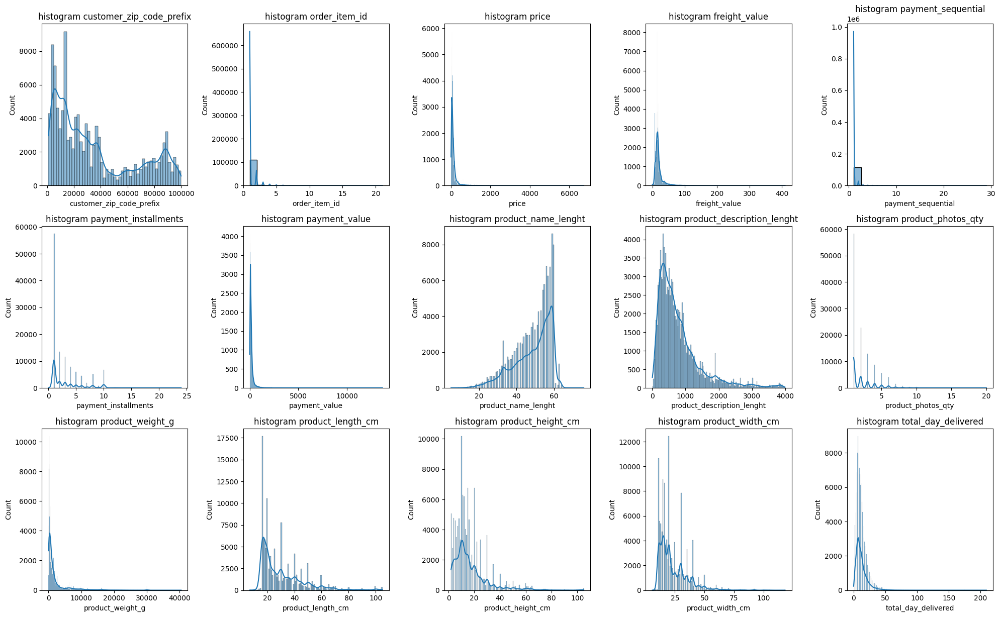

In [ ]:
fig = plt.figure(figsize=(20,20)) # horizontal, vertikal

count = 0
for kolom in numerik.columns:
    count += 1
    plt.subplot(5,5,count)
    sns.histplot(numerik[kolom], kde=True)
    plt.title(f"histogram {kolom}")
    fig.tight_layout() # biar tidak tertumpuk
plt.show()

Dari diagram diatas, dapat diambil informasi bahwa:
- data price, freight_value, payment_value, dan total_day_delivered,  memiliki distribusi right skewed
- fitur fitur pada data ini berdistribusi tidak normal. hal ini dapat mempengaruhi performa dan interpretasi model machine learning. maka dari itu, akan ada langkah langkah untuk penanganan pengubahan skala.
- untuk customer_zip_code_prefix tidak perlu diperhatikan karena angka-angka dalam kolom tersebut merepresentasikan kode pos.

### Analisis Korelasi

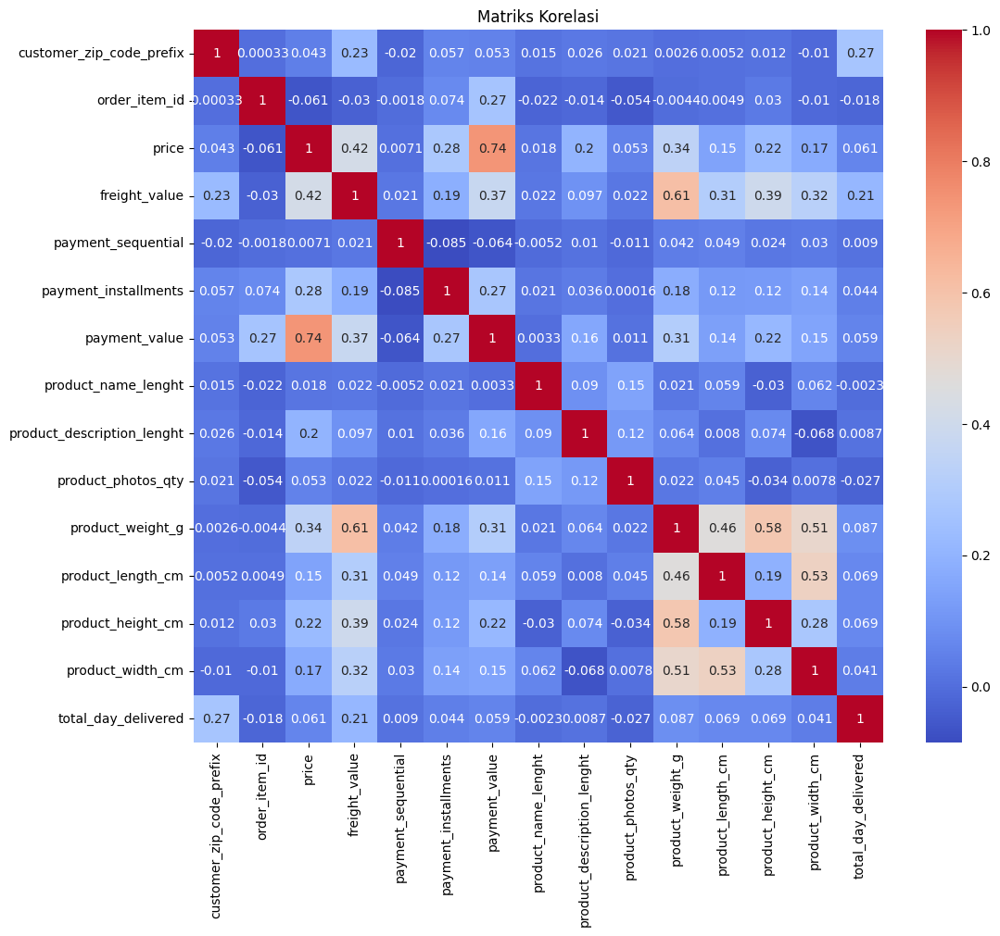

In [ ]:
# Analisis Korelasi
plt.figure(figsize=(12, 10))
sns.heatmap(numerik.corr(), annot=True, cmap='coolwarm')
plt.title('Matriks Korelasi')
plt.show()

Dari visualisasi di atas, didapatkan informasi sebagai berikut:
- Korelasi dengan hubungan positif tertinggi dimiliki oleh price dan payment_value dengan nilai 0.74
- Korelasi dengan hubungan positif tertinggi kedua dimiliki oleh price dan freight_value dengan nilai 0.42
- Kedua hal diatas menunjukkan bahwa semakin tinggi salah satunya, maka akan berdampak positif (naik) pula terhadap satu data lainnya
- payment_sequential dan payment_installment memiliki hubungan negatif dengan nilai -0.086, hal ini menunjukkan semakin besar payment_sequential akan semakin kecil payment_installment yang didapatkan (diluar customer_zip_code_prefix).

## Kategorik

In [ ]:
kategorik = df_eda.select_dtypes(exclude='number')
kategorik

,customer_id,customer_unique_id,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,product_id,seller_id,shipping_limit_date,payment_type,product_category_name_english,order_period_day,order_period_month,order_period_year
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05 00:00:00,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,credit_card,office_furniture,2017-05-16,2017-05,2017
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,2017-11-28 00:09:50,2017-12-19 00:00:00,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,credit_card,office_furniture,2017-11-09,2017-11,2017
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,2017-11-28 00:09:50,2017-12-19 00:00:00,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,credit_card,office_furniture,2017-11-09,2017-11,2017
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,2017-05-26 09:54:04,2017-06-12 00:00:00,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 22:22:56,credit_card,office_furniture,2017-05-07,2017-05,2017
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,2018-02-28 21:09:00,2018-03-22 00:00:00,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2018-02-18 21:29:19,credit_card,office_furniture,2018-02-03,2018-02,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117596,da37711b17efd5f2539e8196ab215f04,5f2971f9805e3ccb030226e30c8e8390,sao paulo,SP,c8203bb57639618630affac9e8e923dd,delivered,2017-03-27 23:04:18,2017-03-27 23:23:38,2017-03-28 14:18:59,2017-03-30 17:06:19,2017-04-13 00:00:00,aea06073397f809424f946979354c9f0,f45122a9ab94eb4f3f8953578bc0c560,2017-04-02 23:23:38,credit_card,pet_shop,2017-03-27,2017-03,2017
117597,184e0c2cfc746789643521df0e9ff904,c64ede6d0ae8901b1b6fb03528c1b7e6,sao miguel do guama,PA,45b3000bcd10464ac178f32cd783fc83,delivered,2017-12-07 23:55:46,2017-12-09 23:50:32,2017-12-11 20:29:02,2018-01-05 17:59:38,2018-01-22 00:00:00,bbf975bffd2ae9ee52f513ae5c8a4b27,04aba03279157f6d4e0fe8ccaf21963c,2017-12-13 23:50:32,credit_card,health_beauty,2017-12-07,2017-12,2017
117598,821a7275a08f32975caceff2e08ea262,046470763123d3d6364f89095b4e47ab,sao paulo,SP,49645a8902c1ba980836b7bff991d69f,delivered,2018-04-04 17:50:52,2018-04-04 18:08:41,2018-04-05 16:36:49,2018-04-06 23:32:21,2018-04-18 00:00:00,f6e0a9ce8a6e91c3a0ca2d3005911d20,cab85505710c7cb9b720bceb52b01cee,2018-04-10 18:08:41,credit_card,fashion_bags_accessories,2018-04-04,2018-04,2018
117599,1ed0c832c2dd99570a59260e71768bdf,82d46759af0369aad49084bacf85a6c3,bom repouso,MG,51c6d2f460589fa7b65f2da51e860206,delivered,2017-11-14 12:04:09,2017-11-14 12:15:25,2017-11-27 20:44:47,2017-12-19 19:37:33,2017-12-12 00:00:00,c98bf47f7bea8f3aee82fa023786b8a1,51a04a8a6bdcb23deccc82b0b80742cf,2017-11-24 12:15:25,credit_card,electronics,2017-11-14,2017-11,2017


Terdapat 18 kolom kategorik di df_eda.

### Count Values

In [ ]:
kategorik.nunique()

customer_id                      96794
customer_unique_id               93654
customer_city                     4094
customer_state                      27
order_id                         96794
order_status                         5
order_purchase_timestamp         96261
order_approved_at                88564
order_delivered_carrier_date     80331
order_delivered_customer_date    95265
order_estimated_delivery_date      446
product_id                       32114
seller_id                         2990
shipping_limit_date              91623
payment_type                         4
product_category_name_english       71
order_period_day                   613
order_period_month                  24
order_period_year                    3
dtype: int64

### Modus

In [ ]:
kategorik.describe(include='object').T

,count,unique,top,freq
customer_id,115312,96794,270c23a11d024a44c896d1894b261a83,63
customer_unique_id,115312,93654,9a736b248f67d166d2fbb006bcb877c3,75
customer_city,115312,4094,sao paulo,18136
customer_state,115312,27,SP,48533
order_id,115312,96794,895ab968e7bb0d5659d16cd74cd1650c,63
order_status,115312,5,delivered,113374
order_approved_at,115312,88564,2017-08-08 20:43:31,63
order_estimated_delivery_date,115312,446,2017-12-20 00:00:00,645
product_id,115312,32114,aca2eb7d00ea1a7b8ebd4e68314663af,536
seller_id,115312,2990,4a3ca9315b744ce9f8e9374361493884,2131


Dari informasi diatas, dapat diambil informasi bahwa:
- Pada payment_type, credit_card merupakan tipe pembayaran paling populer
- Berdasarkan customer_city dan customer_state, sao paulo (SP) merupakan kota dengan data terbanyak.
- customer dengan unique_id 9a736b248f67d166d2fbb006bcb877c3 memiliki frekuensi pemesanan terbanyak yaitu 75 kali

In [ ]:
df_clean = df_eda.copy() # ini penting agar tidak terlalu jauh kalau ingin mengulang cleaning

Melakukan pengcopyan data agar tidak mengulang terlalu jauh jika terjadi error.

In [ ]:
order_qty_trend = df_eda.groupby('order_period_day')['order_id'].count()
revenue_trend = df_eda.groupby('order_period_day')['price'].sum()

date_range = pd.date_range(start=order_qty_trend.index.min(), end=order_qty_trend.index.max())

order_qty_trend = order_qty_trend.reindex(date_range, fill_value=0)
revenue_trend = revenue_trend.reindex(date_range,fill_value=0)

## EDA

Waktu Rata-rata Pengiriman per State

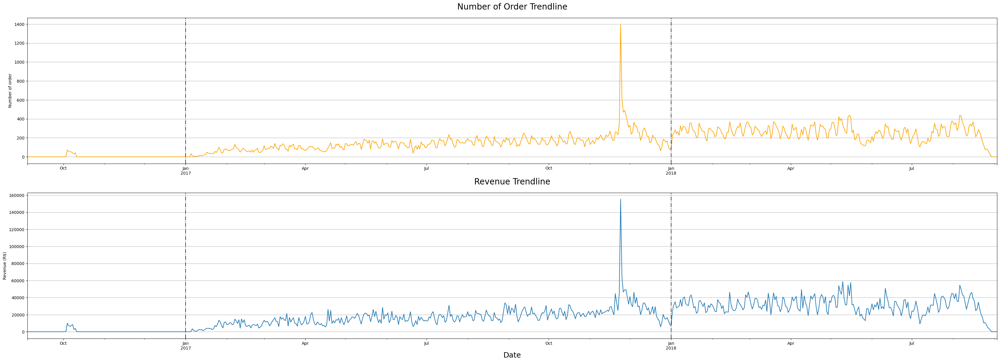

In [ ]:
fig, axes = plt.subplots(2,1, figsize=(42, 14))
order_qty_trend.plot(kind='line', color='orange', ax=axes[0])
revenue_trend.plot(kind='line', ax=axes[1])

axes[0].axvline(x=pd.to_datetime('2017-01-01'), linestyle='-.', color='black',alpha=0.8)
axes[0].axvline(x=pd.to_datetime('2018-01-01'), linestyle='-.', color='black',alpha=0.8)
axes[0].set_xlabel('')
axes[0].set_ylabel('Number of order')
axes[0].set_title('Number of Order Trendline',pad=20,fontsize="20")
axes[0].grid(axis='y')

axes[1].axvline(x=pd.to_datetime('2017-01-01'), linestyle='-.', color='black',alpha=0.8)
axes[1].axvline(x=pd.to_datetime('2018-01-01'), linestyle='-.', color='black',alpha=0.8)
axes[1].set_xlabel('Date', fontsize='18')
axes[1].set_ylabel('Revenue (R$)')
axes[1].set_title('Revenue Trendline',pad=20,fontsize="20")
axes[1].grid(axis='y')

plt.show()

Dari grafik diatas, dapat diambil informasi bahwa:
- Lonjakan Besar: Lonjakan besar dalam jumlah pesanan dan pendapatan pada Oktober 2017 menunjukkan adanya suatu peristiwa penting atau promosi yang meningkatkan aktivitas secara signifikan.
- Stabilisasi: Setelah lonjakan, baik jumlah pesanan maupun pendapatan menurun dan stabil pada tingkat yang lebih tinggi dibandingkan sebelum lonjakan.
- Korelasi: Terdapat korelasi yang jelas antara jumlah pesanan dan pendapatan, di mana lonjakan dalam pesanan juga menyebabkan lonjakan dalam pendapatan.

Jumlah customer per state

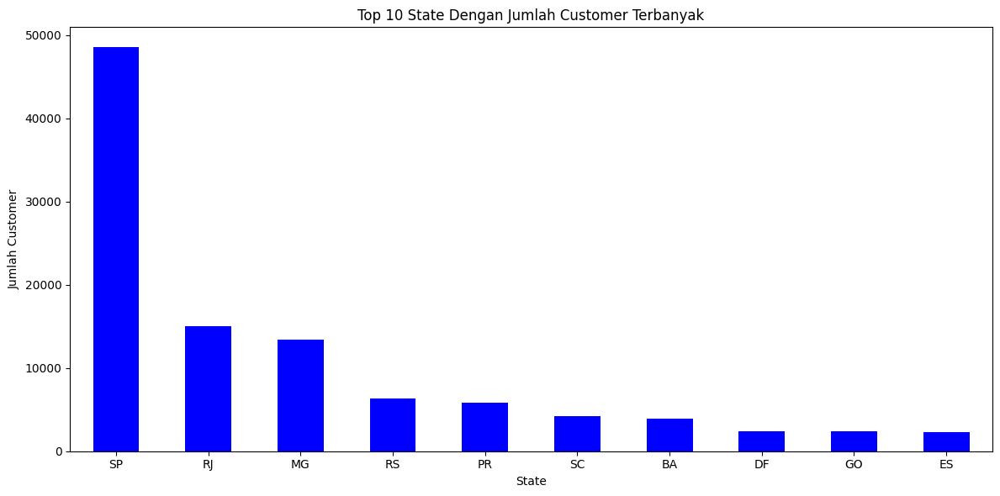

In [ ]:
# Number of customer per state
customer_per_state = df_eda.groupby('customer_state')['customer_unique_id'].count().sort_values(ascending=False).head(10)

# Membuat Grafik
plt.figure(figsize=(12, 6))
customer_per_state.plot(kind='bar', color='blue')
plt.title('Top 10 State Dengan Jumlah Customer Terbanyak')
plt.xlabel('State')
plt.ylabel('Jumlah Customer')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Dari grafik diatas, dapat diambil informasi bahwa:
- São Paulo mendominasi jumlah pelanggan dengan selisih yang sangat signifikan dibandingkan negara bagian lainnya.
- Negara bagian seperti Distrito Federal, Goiás, dan Espírito Santo memiliki jumlah pelanggan yang relatif rendah, menunjukkan adanya potensi pertumbuhan di wilayah tersebut.
- Selain São Paulo, pasar utama lainnya adalah Rio de Janeiro, Minas Gerais, dan Rio Grande do Sul.

Jumlah Seller per State

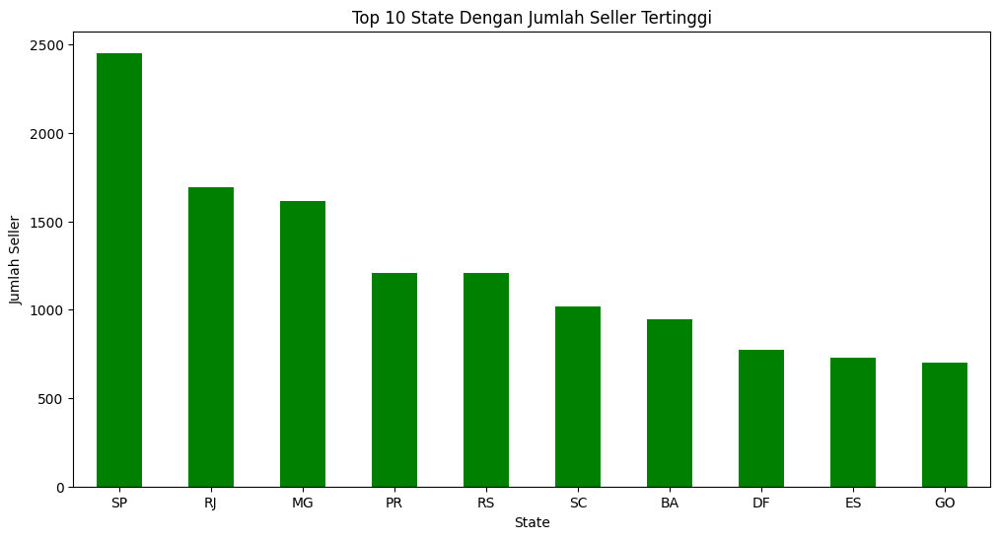

In [ ]:
# Jumlah Seller per State
seller_per_state = df_eda.groupby('customer_state')['seller_id'].nunique().sort_values(ascending=False).head(10)

plt.figure(figsize=(12, 6))
seller_per_state.plot(kind='bar', color='green')
plt.title('Top 10 State Dengan Jumlah Seller Tertinggi')
plt.xlabel('State')
plt.ylabel('Jumlah Seller')
plt.xticks(rotation=0)
plt.show()

Dari grafik diatas, dapat diambil informasi bahwa:
- São Paulo mendominasi jumlah penjual dengan selisih yang sangat signifikan dibandingkan negara bagian lainnya.
- Selain São Paulo, penjual paling banyak lainnya berasal dari Rio de Janeiro, Minas Gerais, dan Rio Grande do Sul.

Distribusi Tipe Pembayaran

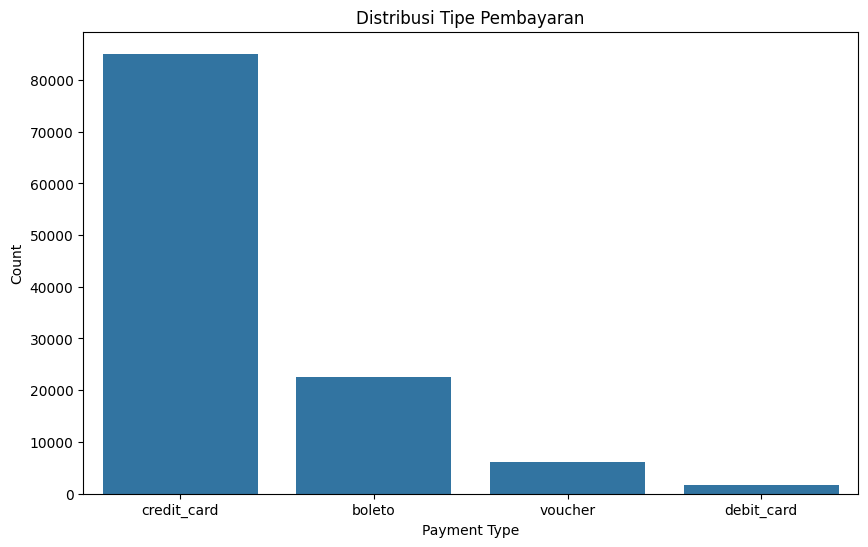

In [ ]:
# Distribusi Tipe Pembayaran
plt.figure(figsize=(10, 6))
sns.countplot(data=df_eda, x='payment_type', order=df_eda['payment_type'].value_counts().index)
plt.title('Distribusi Tipe Pembayaran')
plt.xlabel('Payment Type')
plt.ylabel('Count')
plt.show()

Dari grafik diatas, dapat diambil informasi bahwa:
- Credit_card merupakan tipe pembayaran yang paling populer, diikuti oleh boleto.
- Pembayaran dengan menggunakan debit_card merupakan tipe pembayaran yang paling tidak populer

Rata-rata Harga dan Freight per Order Status

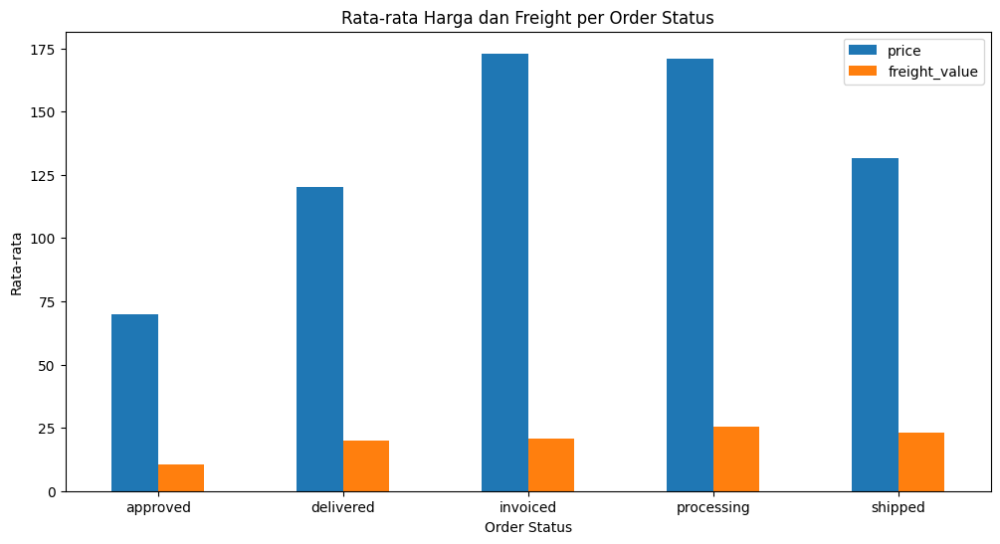

In [ ]:
# Rata-rata Harga dan Freight per Order Status
avg_price_freight = df_eda.groupby('order_status')[['price', 'freight_value']].mean()

avg_price_freight.plot(kind='bar', figsize=(12, 6))
plt.title('Rata-rata Harga dan Freight per Order Status')
plt.xlabel('Order Status')
plt.ylabel('Rata-rata')
plt.xticks(rotation=0)
plt.show()

Dari grafik diatas, dapat diambil informasi bahwa:
- pesanan dengan status invoiced dan processing memiliki rata-rata harga tertinggi
- pesanan dengan status approved memiliki rata-rata harga dan nilai pengiriman terendah.
- Nilai pengiriman cukup konsisten di semua status pesanan selain approved.

Jumlah Order per bulan

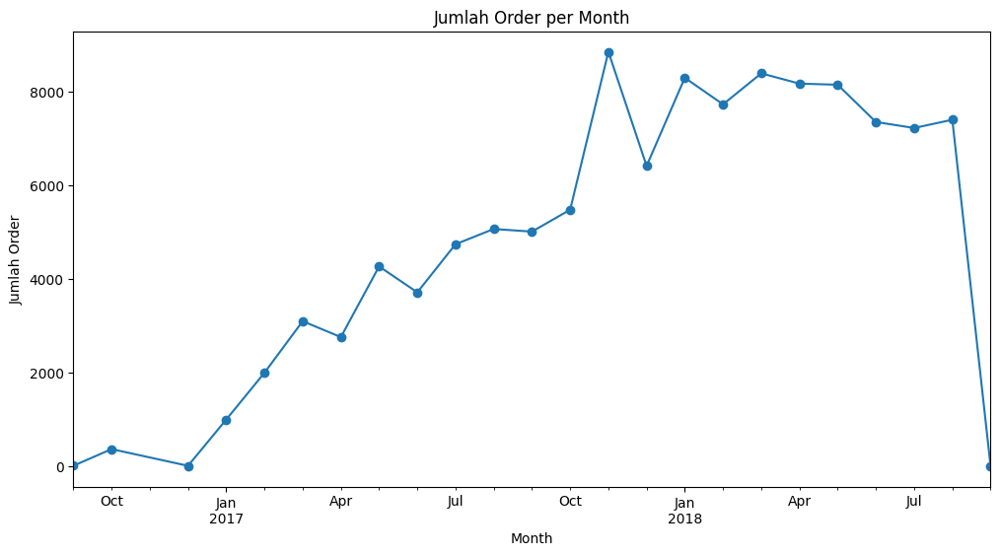

In [ ]:
# Mengonversi kolom timestamp ke datetime
df_eda['order_purchase_timestamp'] = pd.to_datetime(df_eda['order_purchase_timestamp'])

# Jumlah Order per Month
df_eda['month'] = df_eda['order_purchase_timestamp'].dt.to_period('M')
orders_per_month = df_eda.groupby('month')['order_id'].count()

plt.figure(figsize=(12, 6))
orders_per_month.plot(kind='line', marker='o')
plt.title('Jumlah Order per Month')
plt.xlabel('Month')
plt.ylabel('Jumlah Order')
plt.show()

Dari hasil grafik diatas, dapat diambil informasi bahwa:
- grafik ini menunjukkan tren peningkatan jumlah order dari akhir 2016 hingga akhir 2017
- terdapat periode fluktuasi di awal 2018, dan akhirnya penurunan tajam pada pertengahan 2018.

Jumlah Order per Hari tiap Minggunya

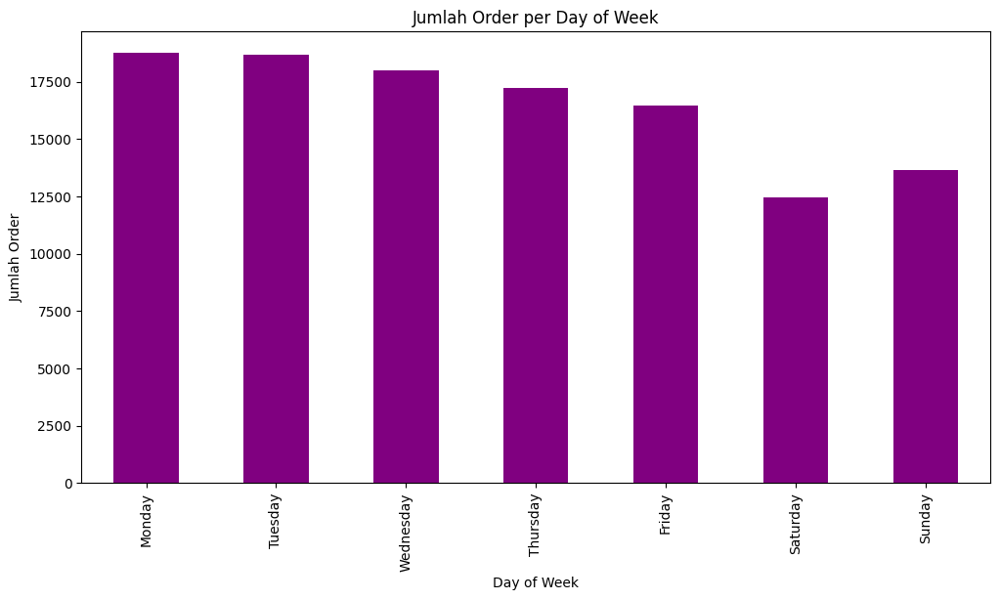

In [ ]:
# Jumlah Order per Day of Week
df_eda['day_of_week'] = df_eda['order_purchase_timestamp'].dt.day_name()
orders_per_day_of_week = df_eda.groupby('day_of_week')['order_id'].count().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

plt.figure(figsize=(12, 6))
orders_per_day_of_week.plot(kind='bar', color='purple')
plt.title('Jumlah Order per Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Jumlah Order')
plt.show()

Dari grafik diatas, dapat diambil informasi bahwa:
- Secara keseluruhan, jumlah order tertinggi terjadi pada hari kerja, terutama di awal minggu (Senin hingga Rabu), dan jumlahnya menurun saat mendekati akhir minggu dan akhir pekan.
- Sabtu memiliki jumlah order terendah
- Minggu sedikit lebih tinggi daripada Sabtu tetapi masih lebih rendah dibandingkan hari kerja.

## RFM Analysis

RFM analysis adalah teknik analisis pemasaran yang digunakan untuk mengidentifikasi dan mengevaluasi nilai pelanggan berdasarkan tiga faktor utama: Recency (kapan terakhir kali pelanggan melakukan pembelian), Frequency (seberapa sering pelanggan melakukan pembelian), dan Monetary (berapa banyak uang yang dihabiskan oleh pelanggan).

Definisi RFM:
1. *Recency (R)*: Mengukur waktu yang telah berlalu sejak transaksi terakhir. Semakin baru transaksi terakhir, semakin tinggi nilai R-nya.
2. *Frequency (F)*: Mengukur jumlah transaksi dalam periode tertentu. Semakin sering transaksi dilakukan, semakin tinggi nilai F-nya.
3. *Monetary (M)*: Mengukur jumlah uang yang dihabiskan oleh pelanggan. Semakin besar jumlah uang yang dihabiskan, semakin tinggi nilai M-nya.

Kegunaan RFM:
1. *Segmentasi Pelanggan*: Membantu dalam mengelompokkan pelanggan berdasarkan kebiasaan belanja mereka sehingga perusahaan dapat menyusun strategi pemasaran yang lebih terfokus.
2. *Personalisasi Pemasaran*: Memungkinkan perusahaan untuk mengirim pesan yang lebih relevan dan menarik kepada setiap segmen pelanggan.
3. *Loyalitas Pelanggan*: Mengidentifikasi pelanggan yang paling berharga dan yang memiliki risiko tinggi untuk berhenti berbelanja, sehingga perusahaan dapat melakukan upaya untuk mempertahankan mereka.
4. *Pengoptimalan Sumber Daya*: Memungkinkan alokasi sumber daya pemasaran yang lebih efisien dengan fokus pada pelanggan yang paling bernilai.
5. *Peningkatan Penjualan*: Melalui pendekatan yang lebih tertarget dan relevan, perusahaan dapat meningkatkan penjualan dan pendapatan.

Batasan RFM:
1. *Data Historis*: Bergantung sepenuhnya pada data historis, yang berarti tidak mempertimbangkan perubahan perilaku pelanggan atau tren pasar terbaru.
2. *Keterbatasan Kategori*: Tidak memperhitungkan faktor-faktor lain seperti preferensi produk, demografi, atau sentimen pelanggan yang juga penting dalam memahami nilai pelanggan.
3. *Asumsi Sederhana*: Mengasumsikan bahwa pelanggan dengan nilai RFM yang tinggi adalah yang paling berharga, padahal nilai pelanggan bisa juga dipengaruhi oleh faktor-faktor lain.
4. *Tidak Dinamis*: Tidak menangkap perubahan dalam perilaku pelanggan secara real-time, sehingga mungkin kurang efektif untuk strategi jangka panjang yang memerlukan adaptasi cepat terhadap perubahan pasar.


In [ ]:
rfm = df_eda[['order_id','customer_unique_id','price','order_purchase_timestamp']].copy()
rfm.dropna(inplace=True)

In [ ]:
rfm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 115312 entries, 0 to 117600
Data columns (total 4 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   order_id                  115312 non-null  object        
 1   customer_unique_id        115312 non-null  object        
 2   price                     115312 non-null  float64       
 3   order_purchase_timestamp  115312 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 4.4+ MB


In [ ]:

rfm['order_purchase_timestamp'] = pd.to_datetime(rfm['order_purchase_timestamp'])

today = pd.to_datetime(rfm['order_purchase_timestamp'].max())

df_rfm = rfm.groupby(['customer_unique_id']).agg({'order_purchase_timestamp': lambda x: (today - x.max()).days,
                                                                              'order_id': 'count',
                                                                              'price': 'sum'})

df_rfm.rename(columns={
    'order_purchase_timestamp': 'recency',
    'order_id': 'frequency',
    'price': 'monetary'
}, inplace=True)

df_rfm.reset_index(inplace=True)

df_rfm.head()

,customer_unique_id,recency,frequency,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,115,1,129.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,118,1,18.90
2,0000f46a3911fa3c0805444483337064,541,1,69.00
3,0000f6ccb0745a6a4b88665a16c9f078,325,1,25.99
4,0004aac84e0df4da2b147fca70cf8255,292,1,180.00


In [ ]:
df_rfm.shape

(93654, 4)

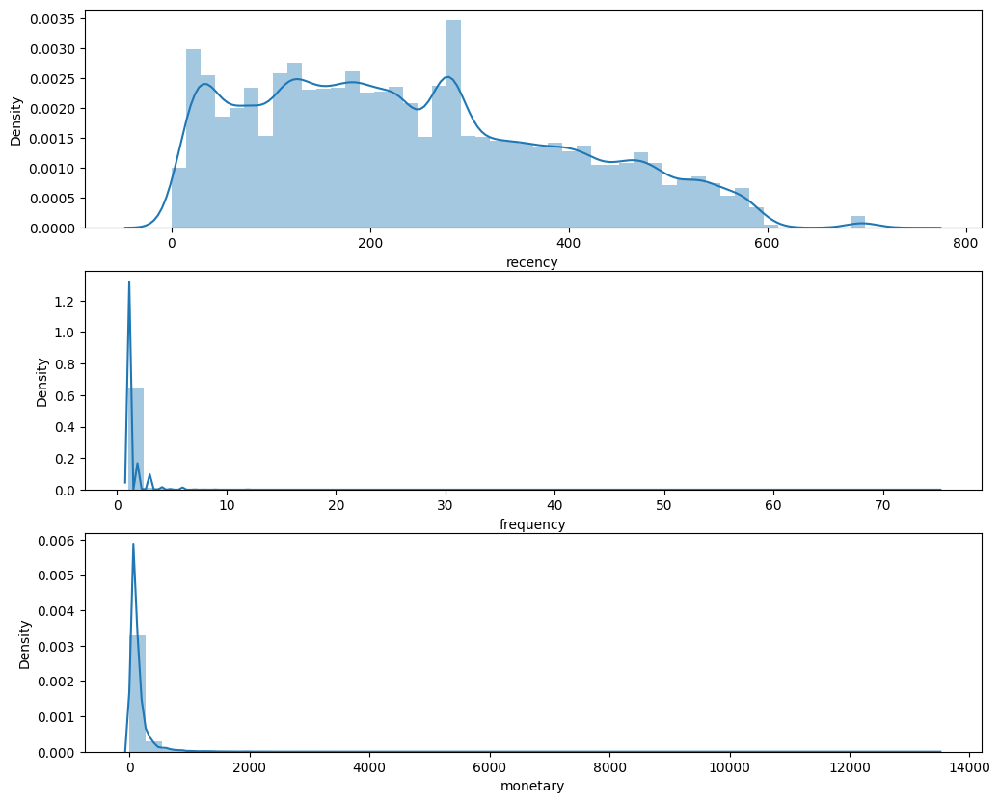

In [ ]:
plt.figure(figsize=(12,10))
# Plot distribution of Recency
plt.subplot(3, 1, 1)
sns.distplot(df_rfm['recency'])
# Plot distribution of Frequency
plt.subplot(3, 1, 2)
sns.distplot(df_rfm['frequency'])
# Plot distribution of Monetary
plt.subplot(3, 1, 3)
sns.distplot(df_rfm['monetary'])

plt.show()

In [ ]:
df_rfm.describe()

,recency,frequency,monetary
count,93654.000000,93654.000000,93654.000000
mean,241.744005,1.231255,148.496651
std,152.973760,0.820620,246.459740
min,0.000000,1.000000,0.850000
25%,118.000000,1.000000,48.900000
50%,222.000000,1.000000,89.900000
75%,351.000000,1.000000,159.900000
max,728.000000,75.000000,13440.000000


In [ ]:
### Merging Dataset

In [ ]:
df_selected = df_eda[['customer_unique_id',
            'customer_state',
            'freight_value',
            'payment_installments',
            'payment_sequential',
            'payment_value',
            'total_day_delivered']]

In [ ]:
df_selected = df_selected.groupby(['customer_unique_id']).aggregate({
    'customer_state':lambda x: x.mode()[0],
    'freight_value':'sum',
    'payment_installments':'max',
    'payment_sequential':'max',
    'payment_value':'sum',
    'total_day_delivered':'sum',
}).reset_index()

In [ ]:
df = df_selected.merge(df_rfm, on= 'customer_unique_id')

df

,customer_unique_id,customer_state,freight_value,payment_installments,payment_sequential,payment_value,total_day_delivered,recency,frequency,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,SP,12.00,8,1,141.90,6,115,1,129.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,SP,8.29,1,1,27.19,3,118,1,18.90
2,0000f46a3911fa3c0805444483337064,SC,17.22,8,1,86.22,25,541,1,69.00
3,0000f6ccb0745a6a4b88665a16c9f078,PA,17.63,4,1,43.62,20,325,1,25.99
4,0004aac84e0df4da2b147fca70cf8255,SP,16.89,6,1,196.89,13,292,1,180.00
...,...,...,...,...,...,...,...,...,...,...
93649,fffcf5a5ff07b0908bd4e2dbc735a684,PE,497.42,10,1,4134.84,54,451,2,1570.00
93650,fffea47cd6d3cc0a88bd621562a9d061,BA,19.69,1,1,84.58,30,266,1,64.89
93651,ffff371b4d645b6ecea244b27531430a,MT,22.56,1,1,112.46,14,572,1,89.90
93652,ffff5962728ec6157033ef9805bacc48,ES,18.69,5,1,133.69,11,123,1,115.00


# Modelling

In [ ]:
!pip install category_encoders

## Feature Selection

In [ ]:
df.drop(columns = 'customer_unique_id').columns

Index(['customer_state', 'freight_value', 'payment_installments',
       'payment_sequential', 'payment_value', 'total_day_delivered', 'recency',
       'frequency', 'monetary'],
      dtype='object')

## Preproccessing

Pada langkah preprocessing, akan dilakukan 3 teknik skala untuk kolom-kolom tertentu untuk meningkatkan kinerja model, serta mengatasi outliers. Berikut merupakan penjelasannya:

1. Binary Encoding untuk 'customer_state':

    - Alasan: Binary Encoding mengonversi variabel kategorikal menjadi format biner, yang membantu model memahami dan memproses variabel kategorikal dengan jumlah kategori yang besar tanpa menyebabkan high cardinality dan mengurangi dimensionalitas data.
2. Ordinal Encoding untuk 'payment_sequential' dan 'payment_installments':

    - Alasan: Ordinal Encoding digunakan karena variabel ini memiliki urutan atau tingkatan yang jelas (misalnya, jumlah cicilan atau urutan pembayaran). Encoding ini mempertahankan informasi urutan yang penting untuk model.
3. RobustScaler untuk 'freight_value', 'payment_value', 'total_day_delivered', 'recency', 'frequency', dan 'monetary':

    - Alasan: RobustScaler mengurangi dampak outlier dengan menggunakan median dan interquartile range (IQR) untuk skala fitur. Fitur-fitur ini (nilai pengiriman, nilai pembayaran, hari pengiriman, recency, frequency, dan monetary) mungkin memiliki outliers yang dapat mengganggu performa model jika menggunakan skala lain seperti StandardScaler atau MinMaxScaler.

In [ ]:
transformer = ColumnTransformer([
    ('binary', ce.BinaryEncoder(), ['customer_state']),
    ('ordinal', OrdinalEncoder(), ['payment_sequential','payment_installments']),
    ('rob', RobustScaler(), ['freight_value', 'payment_value','total_day_delivered','recency','frequency','monetary'])
], remainder='passthrough')

transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('binary', BinaryEncoder(), ['customer_state']),
                                ('ordinal', OrdinalEncoder(),
                                 ['payment_sequential',
                                  'payment_installments']),
                                ('rob', RobustScaler(),
                                 ['freight_value', 'payment_value',
                                  'total_day_delivered', 'recency', 'frequency',
                                  'monetary'])])

In [ ]:
df.columns

Index(['customer_unique_id', 'customer_state', 'freight_value',
       'payment_installments', 'payment_sequential', 'payment_value',
       'total_day_delivered', 'recency', 'frequency', 'monetary'],
      dtype='object')

In [ ]:
df_transformed = transformer.fit_transform(df.drop(columns = 'customer_unique_id'))
df_encoded = pd.DataFrame(df_transformed)
df_encoded

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.0,0.0,0.0,0.0,1.0,0.0,8.0,-0.458466,0.208619,-0.454545,-0.459227,0.0,0.360360
1,0.0,0.0,0.0,0.0,1.0,0.0,1.0,-0.754792,-0.617718,-0.727273,-0.446352,0.0,-0.639640
2,0.0,0.0,0.0,1.0,0.0,0.0,8.0,-0.041534,-0.192483,1.272727,1.369099,0.0,-0.188288
3,0.0,0.0,0.0,1.0,1.0,0.0,4.0,-0.008786,-0.499361,0.818182,0.442060,0.0,-0.575766
4,0.0,0.0,0.0,0.0,1.0,0.0,6.0,-0.067891,0.604751,0.181818,0.300429,0.0,0.811712
...,...,...,...,...,...,...,...,...,...,...,...,...,...
93649,1.0,0.0,0.0,0.0,0.0,0.0,10.0,38.313099,28.972572,3.909091,0.982833,1.0,13.334234
93650,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.155751,-0.204297,1.727273,0.188841,0.0,-0.225315
93651,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.384984,-0.003458,0.272727,1.502146,0.0,0.000000
93652,0.0,0.0,1.0,1.0,1.0,0.0,5.0,0.075879,0.149477,0.000000,-0.424893,0.0,0.226126


In [ ]:
binary_features = transformer.named_transformers_['binary'].get_feature_names_out(['customer_state'])
ordinal_features = ['payment_sequential', 'payment_installments']
robust_features = ['freight_value', 'payment_value','total_day_delivered','recency','frequency','monetary']

# Combine all feature names
all_feature_names = list(binary_features) + ordinal_features + robust_features

# Create a new DataFrame from the transformed data
df_encoded = pd.DataFrame(df_transformed, columns=all_feature_names)

# Display the new DataFrame
df_encoded

,customer_state_0,customer_state_1,customer_state_2,customer_state_3,customer_state_4,payment_sequential,payment_installments,freight_value,payment_value,total_day_delivered,recency,frequency,monetary
0,0.0,0.0,0.0,0.0,1.0,0.0,8.0,-0.458466,0.208619,-0.454545,-0.459227,0.0,0.360360
1,0.0,0.0,0.0,0.0,1.0,0.0,1.0,-0.754792,-0.617718,-0.727273,-0.446352,0.0,-0.639640
2,0.0,0.0,0.0,1.0,0.0,0.0,8.0,-0.041534,-0.192483,1.272727,1.369099,0.0,-0.188288
3,0.0,0.0,0.0,1.0,1.0,0.0,4.0,-0.008786,-0.499361,0.818182,0.442060,0.0,-0.575766
4,0.0,0.0,0.0,0.0,1.0,0.0,6.0,-0.067891,0.604751,0.181818,0.300429,0.0,0.811712
...,...,...,...,...,...,...,...,...,...,...,...,...,...
93649,1.0,0.0,0.0,0.0,0.0,0.0,10.0,38.313099,28.972572,3.909091,0.982833,1.0,13.334234
93650,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.155751,-0.204297,1.727273,0.188841,0.0,-0.225315
93651,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.384984,-0.003458,0.272727,1.502146,0.0,0.000000
93652,0.0,0.0,1.0,1.0,1.0,0.0,5.0,0.075879,0.149477,0.000000,-0.424893,0.0,0.226126


# KMeans Algorithm

KMeans merupakan algoritma clustering yang digunakan untuk mengelompokkan data ke dalam beberapa cluster berdasarkan kemiripan fitur. Algoritma K-Means beroperasi dengan cara mengelompokkan data ke dalam K cluster sehingga setiap data ditempatkan di cluster yang memiliki centroid paling dekat dengan data tersebut dibandingkan dengan centroid cluster lainnya. Jarak antara data dan centroid menjadi faktor utama dalam menentukan clustering data.

Proses umum dari algoritma K-Means dimulai dengan inisialisasi centroid. Pertama-tama, jumlah cluster K ditentukan dan titik-titik centroid awal dipilih secara acak dari data yang ada. Setelah inisialisasi, algoritma menghitung jarak antara setiap titik data dengan semua centroid menggunakan metrik seperti jarak Euclidean. Titik data kemudian ditempatkan dalam cluster yang memiliki centroid terdekat.

Selanjutnya, posisi centroid diperbarui sebagai rata-rata dari semua titik data dalam cluster tersebut. Proses ini berulang hingga posisi centroid stabil atau jumlah iterasi maksimum tercapai. Meskipun jarak Euclidean adalah metrik umum yang digunakan, algoritma juga dapat menggunakan metrik jarak lain seperti Manhattan atau Minkowski tergantung pada karakteristik data.

Salah satu limitasi dari K-Means adalah sensitivitas terhadap inisialisasi awal centroid. Inisialisasi yang acak dapat mengarahkan algoritma ke solusi lokal yang suboptimal. Solusinya dapat dicari dengan menjalankan algoritma beberapa kali dengan inisialisasi centroid yang berbeda atau menggunakan metode seperti K-Means++ untuk meningkatkan inisialisasi centroid.


KMeans clustering dipilih dalam segmentasi pengguna e-commerce Olist karena beberapa alasan:

1. Kemampuan Mengelompokkan Secara Efisien: KMeans efektif dalam mengelompokkan pengguna berdasarkan pola pembelian, preferensi produk, atau perilaku dalam e-commerce. Ini memungkinkan platform untuk memahami kelompok pengguna yang berbeda dan menyesuaikan strategi pemasaran atau rekomendasi produk secara lebih spesifik.

2. Skalabilitas dan Kinerja: Algoritma KMeans relatif cepat dan dapat menangani jumlah data yang besar dengan baik. Hal ini penting dalam konteks e-commerce di mana ada ribuan atau bahkan jutaan pengguna dan transaksi yang perlu dianalisis.

3. Kemudahan Implementasi: KMeans relatif mudah diimplementasikan dan dipahami, baik dari segi teknis maupun interpretasi hasilnya. Ini memungkinkan tim e-commerce untuk dengan cepat mengadopsi dan menggunakan hasil clustering untuk pengambilan keputusan.

4. Pemahaman Konsumen yang Lebih Mendalam: Dengan mengelompokkan pengguna berdasarkan perilaku dan preferensi mereka, e-commerce dapat meningkatkan personalisasi pengalaman pengguna. Misalnya, dengan menawarkan rekomendasi produk yang lebih sesuai atau kategori yang relevan berdasarkan cluster yang mereka miliki.

5. Optimasi Strategi Pemasaran: Dengan memahami kelompok pengguna yang berbeda, platform e-commerce dapat mengarahkan upaya pemasaran ke segmen yang paling responsif yang akan membantu meningkatkan efisiensi dan efektivitas kampanye pemasaran.

Analisis ini akan menggunakan algoritma K-Means yang mengeksplorasi dua model, yaitu K-Means-PCA dan K-Means-RFM. Tujuan dari penerapan kedua model ini adalah untuk memungkinkan perbandingan hasil analisis yang lebih komprehensif dan memperoleh temuan yang dapat divalidasi. Dengan menggunakan K-Means-PCA, kita dapat mengurangi dimensi data melalui Principal Component Analysis (PCA) sehingga mempermudah visualisasi dan pemahaman pola dalam data yang kompleks. Sementara itu, model K-Means-RFM akan mengelompokkan data berdasarkan tiga metrik utama dalam analisis pelanggan: Recency (seberapa baru transaksi terakhir dilakukan), Frequency (seberapa sering transaksi terjadi), dan Monetary (berapa besar nilai transaksi). Melalui pendekatan ganda ini, kita dapat mengevaluasi keefektifan dan konsistensi dari kedua model dalam mengidentifikasi segmen pelanggan yang relevan, serta memastikan bahwa hasil penelitian yang diperoleh memiliki validitas yang kuat dan dapat digunakan sebagai dasar untuk pengambilan keputusan bisnis yang lebih baik.


## 1. Clustering: PCA-KMeans

PCA (Principal Component Analysis) adalah teknik statistik yang digunakan untuk mereduksi dimensi data dengan mengubah data yang memiliki banyak variabel menjadi beberapa variabel utama yang masih mampu menjelaskan sebagian besar variasi dalam data asli. Proses ini melibatkan dekomposisi matriks kovarians data dan transformasi data ke dalam ruang baru yang didasarkan pada komponen utama tersebut.

PCA memiliki beberapa kelebihan seperti:
1. *Reduksi Dimensi*: Mengurangi jumlah variabel tanpa kehilangan banyak informasi penting, yang dapat membuat analisis data lebih mudah dan cepat.
2. *Menghilangkan Redundansi*: Mengurangi korelasi antara variabel, sehingga data yang dianalisis menjadi lebih independen.
3. *Visualisasi*: Membantu dalam visualisasi data berdimensi tinggi dengan memproyeksikan data ke dalam 2D atau 3D.
4. *Meningkatkan Kinerja Model*: Dengan mengurangi noise dan redundansi dalam data, PCA dapat meningkatkan kinerja algoritma pembelajaran mesin.

dan beberapa Kelemahan, seperti:
1. *Kehilangan Informasi*: Proses reduksi dimensi bisa menghilangkan beberapa informasi penting, terutama jika terlalu banyak komponen utama yang dibuang.
2. *Interpretasi Sulit*: Komponen utama sering kali sulit diinterpretasikan secara intuitif karena merupakan kombinasi linear dari variabel asli.
3. *Sensitif terhadap Skala*: PCA sangat dipengaruhi oleh skala variabel, sehingga perlu normalisasi data sebelum menerapkan PCA.
4. *Asumsi Linearitas*: PCA mengasumsikan bahwa hubungan antara variabel adalah linear, yang mungkin tidak selalu benar dalam praktik.
5. *Tidak Menangani Ketidaksejajaran Data*: PCA tidak bekerja dengan baik jika data tidak terdistribusi dengan baik atau jika terdapat outlier yang signifikan.

Kendati demikian, tujuan digunakannya Principal Component Analysis (PCA) dalam analisis ini adalah untuk mengurangi dimensi data yang kompleks sambil mempertahankan sebanyak mungkin variabilitas atau informasi penting yang ada dalam data. Ini dilakukan dengan mengubah data ke dalam set fitur baru yang disebut principal components, yang merupakan kombinasi linear dari fitur asli.


In [ ]:
pca = PCA(n_components=df_encoded.shape[1])
pca.fit(df_encoded)
df_pca = pca.transform(df_encoded)

variance = []
for i in range(0,df_encoded.shape[1]):
    variance.append(np.var(df_pca[:,i]))

pd.DataFrame(variance/sum(variance)*100).sort_values(by=0,ascending=False)

,0
0,58.690642
1,17.392725
2,11.053128
3,5.933322
4,3.206449
5,0.997902
6,0.894701
7,0.555036
8,0.477569
9,0.314143


Seperti yang bisa kita lihat dari hasil di atas, dengan hanya 3 komponen utama, kita sudah menjelaskan 87,13 % varians dalam dataset. Jadi kita akan menggunakan 2 komponen untuk melakukan PCA.

In [ ]:
pca = PCA(n_components=3)
pca.fit(df_encoded)

df_pca = pca.transform(df_encoded)
df_pca = pd.DataFrame(df_pca)
df_pca.rename(columns = {0 : 'PC1', 1:'PC2', 2:'PC3'}, inplace = True)
df_pca

,PC1,PC2,PC3
0,-0.143032,-4.638715,2.391818
1,-2.282389,1.943032,0.839789
2,-0.391308,-4.780633,1.404515
3,-1.394009,-1.015392,0.498589
4,0.230055,-2.837472,1.327966
...,...,...,...
93649,39.834427,-7.563413,-23.118508
93650,-1.303210,1.731912,-0.816020
93651,-1.150533,1.742550,-0.411180
93652,-0.480892,-1.926855,0.983346


### Elbow Method

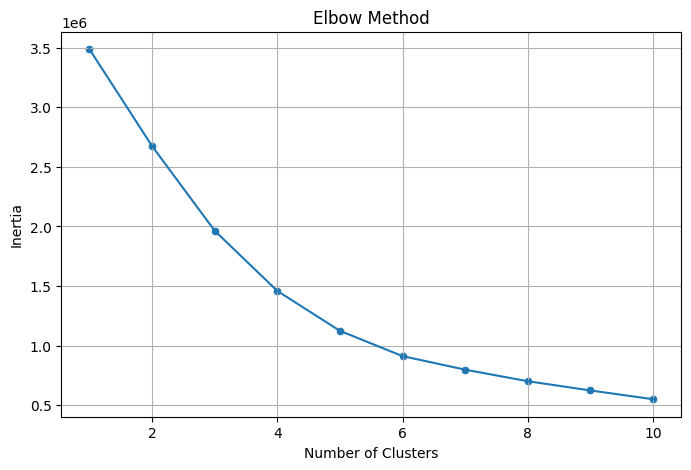

In [ ]:
k=range(1,11)
inertia=[]
plt.figure(figsize=(8,5))
for i in k:
    model=KMeans(n_clusters=i, init='k-means++', random_state=2023)
    model.fit(df_pca)
    inertia.append(model.inertia_)

sns.lineplot(x=k, y=inertia)
sns.scatterplot(x=k, y=inertia)
plt.ylabel('Inertia')
plt.xlabel('Number of Clusters')
plt.title('Elbow Method')
plt.grid(True)
plt.show()

Gambar di atas menunjukkan grafik hasil Elbow Method, yang digunakan untuk menentukan jumlah cluster optimal dalam analisis PCA K-means clustering. Berdasarkan grafik Elbow Method, jumlah cluster optimal terlihat berada di 4. Ini adalah titik di mana penurunan inertia tidak lagi signifikan meskipun jumlah cluster ditingkatkan.

### Silhouette Method

In [ ]:
score=[]
k_num= range(2,8)
best=0

for i in k_num:
    kmean=KMeans(n_clusters=i, init='k-means++', random_state=2023)
    kmean.fit(df_pca)
    labels=kmean.labels_
    sil_score=(silhouette_score(df_pca,labels,metric='euclidean'))
    score.append(sil_score)

    if best<sil_score:
        best=sil_score
        best_k=i

plt.figure(figsize=(8,5))

sns.scatterplot(x=k_num, y=score)
sns.lineplot(x=k_num, y=score)
plt.grid(True)
plt.title('Silhouette Score vs Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xlabel('Number of Clusters')

for x,y in zip(k_num, score):
    label = "{:.2f}".format(y)
    plt.annotate(label,
                 (x,y),
                 textcoords="offset points",
                 xytext=(0,5),
                 ha='center')
plt.tight_layout()
plt.show()

Gambar di atas menunjukkan grafik Silhouette Score untuk berbagai jumlah cluster dalam analisis clustering. Jumlah Cluster Optimal: Berdasarkan grafik Silhouette Score, jumlah cluster optimal tampaknya berada di 2 atau 3. Ini adalah titik di mana nilai Silhouette Score mencapai yang tertinggi, menunjukkan bahwa cluster tersebut paling representatif untuk data. Berbeda dengan elbow method, yang menunjukkan cluster optimal di 4 cluster.

## Clustering Result KMeans with PCA

In [ ]:
kmeans=KMeans(n_clusters=4, init='k-means++', random_state=2023)
kmeans.fit(df_pca)
labels = kmeans.labels_

In [ ]:
silhouette_avg = silhouette_score(df_pca, labels)
print("The average silhouette score is :", silhouette_avg)

The average silhouette score is : 0.5758217905939219


In [ ]:
df_pca['Cluster'] = labels
df_pca

,PC1,PC2,PC3,Cluster
0,-0.143032,-4.638715,2.391818,1
1,-2.282389,1.943032,0.839789,0
2,-0.391308,-4.780633,1.404515,1
3,-1.394009,-1.015392,0.498589,0
4,0.230055,-2.837472,1.327966,1
...,...,...,...,...
93649,39.834427,-7.563413,-23.118508,2
93650,-1.303210,1.731912,-0.816020,0
93651,-1.150533,1.742550,-0.411180,0
93652,-0.480892,-1.926855,0.983346,0


In [ ]:
# Loop untuk menampilkan feature importance dari tiap PC
listimp = []

max_top_features = 20  # Jumlah maksimum fitur teratas yang ingin ditampilkan untuk setiap komponen

for i in range(pca.components_.shape[0]):
    # Feature importance untuk PC ke-i
    pc_i_importance = pd.DataFrame()
    pc_i_importance['feature'] = df_encoded.columns
    pc_i_importance['coef'] = np.abs(pca.components_[i])

    # Menampilkan top max_top_features fitur berdasarkan koefisien tertinggi
    pc_i_importance = pc_i_importance.sort_values('coef', ascending=False).head(max_top_features)
    print(f'PC{i+1} top features:')
    print(pc_i_importance)
    print('')

    # Menambahkan list fitur ke listimp
    listimp.append(pc_i_importance['feature'].tolist())

# Membuat DataFrame dari listimp
listimp_df = pd.DataFrame(listimp).transpose()
listimp_df.columns = [f'PC{i+1}_feature' for i in range(len(listimp_df.columns))]

listimp_df

PC1 top features:
                 feature      coef
8          payment_value  0.900885
12              monetary  0.309248
7          freight_value  0.238378
6   payment_installments  0.141002
9    total_day_delivered  0.102770
11             frequency  0.073650
5     payment_sequential  0.006380
2       customer_state_2  0.003663
4       customer_state_4  0.003331
0       customer_state_0  0.002298
1       customer_state_1  0.002188
3       customer_state_3  0.002177
10               recency  0.000181

PC2 top features:
                 feature      coef
6   payment_installments  0.935658
8          payment_value  0.254725
12              monetary  0.190873
7          freight_value  0.148174
9    total_day_delivered  0.029295
10               recency  0.010942
2       customer_state_2  0.008930
4       customer_state_4  0.008212
5     payment_sequential  0.006802
0       customer_state_0  0.006531
1       customer_state_1  0.006429
3       customer_state_3  0.003873
11             fre

,PC1_feature,PC2_feature,PC3_feature
0,payment_value,payment_installments,freight_value
1,monetary,payment_value,total_day_delivered
2,freight_value,monetary,payment_value
3,payment_installments,freight_value,payment_installments
4,total_day_delivered,total_day_delivered,monetary
5,frequency,recency,frequency
6,payment_sequential,customer_state_2,payment_sequential
7,customer_state_2,customer_state_4,customer_state_4
8,customer_state_4,payment_sequential,customer_state_2
9,customer_state_0,customer_state_0,customer_state_3


In [ ]:
fig = px.scatter_3d(df_pca,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    symbol='Cluster',
                    color='Cluster',
                    opacity=0.9,
                    width=900,
                    height=650)
fig.update_layout(title_text='K-means 3 cluster 3D Plot (Actual values)')

# Posisi Legend
fig.update_layout(legend=dict(
    xanchor='left',
    yanchor='top',
    title='cluster',
    orientation='h'))

Feature Importance

In [ ]:
# Atribut components_ memberikan matriks komponen utama
components = pca.components_

# Menampilkan komponen-komponen
print("Komponen PCA:")
print(components)

# feature importance khusus untuk PC0
pc0_importance = pd.DataFrame({
    'feature': df_encoded.columns,  # Use the original DataFrame's columns
    'coef': np.abs(pca.components_[0])
})

pc0_importance = pc0_importance.sort_values('coef', ascending=False)
pc0_importance

Komponen PCA:
[[ 2.29766570e-03  2.18789106e-03  3.66316630e-03  2.17748992e-03
  -3.33100819e-03  6.38003821e-03  1.41001569e-01  2.38378418e-01
   9.00884947e-01  1.02770458e-01  1.80612897e-04  7.36501926e-02
   3.09248155e-01]
 [-6.53061642e-03 -6.42917207e-03 -8.92988326e-03 -3.87305417e-03
   8.21212426e-03 -6.80230331e-03 -9.35658119e-01 -1.48174066e-01
   2.54725486e-01 -2.92948864e-02 -1.09419635e-02 -6.36481126e-04
  -1.90872992e-01]
 [-1.46276823e-02 -1.41718527e-02 -2.23557022e-02 -1.55446517e-02
   2.23873348e-02 -8.63948301e-02  2.68275270e-01 -7.67216315e-01
   3.05029888e-01 -3.76542360e-01  3.96829605e-03 -1.84406528e-01
  -2.47865134e-01]]


,feature,coef
8,payment_value,0.900885
12,monetary,0.309248
7,freight_value,0.238378
6,payment_installments,0.141002
9,total_day_delivered,0.102770
11,frequency,0.073650
5,payment_sequential,0.006380
2,customer_state_2,0.003663
4,customer_state_4,0.003331
0,customer_state_0,0.002298


## 2. RFM KMeans Clustering

### **Silhouette Score**
Pertama kita akan melihat siluet skor untuk setiap jumlah cluster

## Clustering dengan K-Means

In [ ]:
df_X = df_encoded[['recency', 'frequency', 'monetary']]
df_X

,recency,frequency,monetary
0,-0.459227,0.0,0.360360
1,-0.446352,0.0,-0.639640
2,1.369099,0.0,-0.188288
3,0.442060,0.0,-0.575766
4,0.300429,0.0,0.811712
...,...,...,...
93649,0.982833,1.0,13.334234
93650,0.188841,0.0,-0.225315
93651,1.502146,0.0,0.000000
93652,-0.424893,0.0,0.226126


### Elbow Method

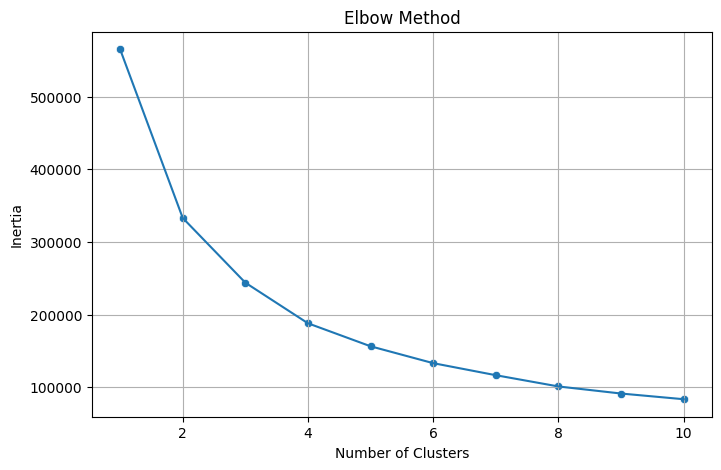

In [ ]:
k=range(1,11)
inertia=[]
plt.figure(figsize=(8,5))
for i in k:
    model=KMeans(n_clusters=i, init='k-means++', random_state=2023)
    model.fit(df_X)
    inertia.append(model.inertia_)

sns.lineplot(x=k, y=inertia)
sns.scatterplot(x=k, y=inertia)
plt.ylabel('Inertia')
plt.xlabel('Number of Clusters')
plt.title('Elbow Method')
plt.grid(True)
plt.show()

Gambar di atas menunjukkan grafik hasil Elbow Method, yang digunakan untuk menentukan jumlah cluster optimal dalam analisis RFM K-means clustering. Berdasarkan grafik Elbow Method, jumlah cluster optimal terlihat berada di 4. Ini adalah titik di mana penurunan inertia tidak lagi signifikan meskipun jumlah cluster ditingkatkan.

### Silhouette

In [ ]:
score=[]
k_num= range(2,8)
best=0

for i in k_num:
    kmean=KMeans(n_clusters=i, init='k-means++', random_state=2023)
    kmean.fit(df_X)
    labels=kmean.labels_
    sil_score=(silhouette_score(df_X,labels,metric='euclidean'))
    score.append(sil_score)

    if best<sil_score:
        best=sil_score
        best_k=i

plt.figure(figsize=(8,5))

sns.scatterplot(x=k_num, y=score)
sns.lineplot(x=k_num, y=score)
plt.grid(True)
plt.title('Silhouette Score vs Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xlabel('Number of Clusters')

for x,y in zip(k_num, score):
    label = "{:.2f}".format(y)
    plt.annotate(label,
                 (x,y),
                 textcoords="offset points",
                 xytext=(0,5),
                 ha='center')
plt.tight_layout()
plt.show()

Gambar di atas menunjukkan grafik Silhouette Score untuk berbagai jumlah cluster dalam analisis clustering. Jumlah Cluster Optimal: Berdasarkan grafik Silhouette Score, jumlah cluster optimal tampaknya berada di 2. Ini adalah titik di mana nilai Silhouette Score mencapai yang tertinggi, menunjukkan bahwa cluster tersebut paling representatif untuk data.

Meskipun silhouette score menunjukkan bahwa penggunaan 2 kluster mungkin lebih optimal secara matematis, memilih 3 kluster dalam segmentasi pelanggan e-commerce kami memiliki justifikasi yang kuat berdasarkan pengetahuan domain. Dengan 3 kluster, kita dapat mengidentifikasi segmen pelanggan yang lebih spesifik dan beragam, seperti mereka yang fokus pada kategori produk tertentu seperti elektronik, fashion, atau kebutuhan rumah tangga. Segmentasi yang lebih rinci ini memungkinkan strategi pemasaran yang lebih terarah dan personalisasi konten yang lebih efektif, yang pada akhirnya meningkatkan tingkat konversi dan kepuasan pelanggan.

Selain itu, penggunaan 3 kluster memberikan pemahaman yang lebih mendalam tentang pola perilaku pelanggan yang kompleks, yang sangat penting untuk pengambilan keputusan strategis. Dengan data yang lebih granular, kita dapat mengembangkan program loyalitas yang lebih tepat sasaran dan menyesuaikan layanan berdasarkan kebutuhan spesifik setiap segmen. Ini tidak hanya meningkatkan retensi pelanggan tetapi juga memungkinkan kita untuk lebih responsif terhadap dinamika pasar dan strategi kompetitor. Oleh karena itu, meskipun 2 kluster mungkin lebih optimal secara teknis, 3 kluster memberikan keuntungan strategis yang lebih besar dalam jangka panjang.

In [ ]:
# Jumlah klaster optimal dari Elbow Method dan Silhouette Score
optimal_clusters = 3

# Lakukan klasterisasi dengan K-Means
kmeans = KMeans(n_clusters=optimal_clusters, init='k-means++', random_state=2023)
labels = kmeans.fit_predict(df_X)

In [ ]:
# Menghitung SSE (Sum of Squared Errors)
sse = kmeans.inertia_
print("Sum of Squared Errors (SSE):", sse)

Sum of Squared Errors (SSE): 243961.7913099363


In [ ]:
# Prediksi klaster untuk setiap data point
labels = kmeans.labels_

# Menghitung nilai siluet untuk semua data points
silhouette_avg = silhouette_score(df_X, labels)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.6988358341391918


In [ ]:
df.head()

,customer_unique_id,customer_state,freight_value,payment_installments,payment_sequential,payment_value,total_day_delivered,recency,frequency,monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,SP,12.00,8,1,141.90,6,115,1,129.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,SP,8.29,1,1,27.19,3,118,1,18.90
2,0000f46a3911fa3c0805444483337064,SC,17.22,8,1,86.22,25,541,1,69.00
3,0000f6ccb0745a6a4b88665a16c9f078,PA,17.63,4,1,43.62,20,325,1,25.99
4,0004aac84e0df4da2b147fca70cf8255,SP,16.89,6,1,196.89,13,292,1,180.00


In [ ]:
# Tambahkan kolom klaster ke DataFrame
df['Cluster'] = labels
df

,customer_unique_id,customer_state,freight_value,payment_installments,payment_sequential,payment_value,total_day_delivered,recency,frequency,monetary,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,SP,12.00,8,1,141.90,6,115,1,129.90,0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,SP,8.29,1,1,27.19,3,118,1,18.90,0
2,0000f46a3911fa3c0805444483337064,SC,17.22,8,1,86.22,25,541,1,69.00,0
3,0000f6ccb0745a6a4b88665a16c9f078,PA,17.63,4,1,43.62,20,325,1,25.99,0
4,0004aac84e0df4da2b147fca70cf8255,SP,16.89,6,1,196.89,13,292,1,180.00,0
...,...,...,...,...,...,...,...,...,...,...,...
93649,fffcf5a5ff07b0908bd4e2dbc735a684,PE,497.42,10,1,4134.84,54,451,2,1570.00,1
93650,fffea47cd6d3cc0a88bd621562a9d061,BA,19.69,1,1,84.58,30,266,1,64.89,0
93651,ffff371b4d645b6ecea244b27531430a,MT,22.56,1,1,112.46,14,572,1,89.90,0
93652,ffff5962728ec6157033ef9805bacc48,ES,18.69,5,1,133.69,11,123,1,115.00,0


In [ ]:
df['Cluster'].value_counts()

Cluster
0    86972
2     6221
1      461
Name: count, dtype: int64

Evaluasi Kualitas Cluster

Menghitung SSE (Sum of Squared Errors)

Analisis Segmentasi Pelanggan


Statistik Klaster:
            recency  frequency     monetary
Cluster                                    
0        241.552051   1.177563   102.578845
1        248.427332   2.702820  2391.309197
2        243.932326   1.872850   624.244416


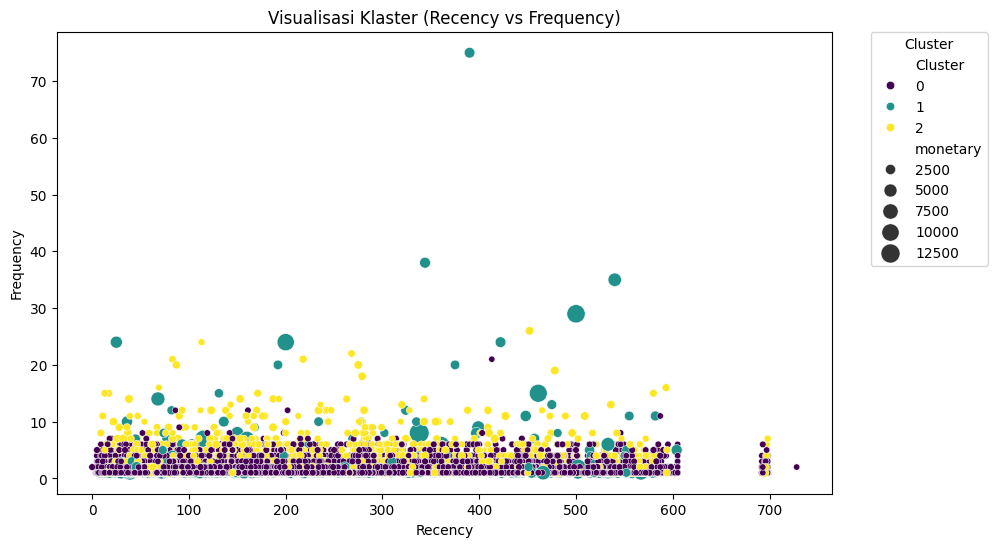

In [ ]:
# Calculate cluster summary statistics
cluster_summary = df.groupby('Cluster')[['recency', 'frequency', 'monetary']].mean()
print("\nStatistik Klaster:")
print(cluster_summary)

# Scatter plot untuk memvisualisasikan klaster dengan monetary sebagai ukuran
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(x='recency', y='frequency', hue='Cluster', size='monetary', data=df, palette='viridis', sizes=(20, 200))
plt.title('Visualisasi Klaster (Recency vs Frequency)')
plt.xlabel('Recency')
plt.ylabel('Frequency')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [ ]:
# Membuat plot 3D scatter
fig = px.scatter_3d(df,
                    x='recency',
                    y='frequency',
                    z='monetary',
                    symbol='Cluster',
                    color='Cluster',
                    opacity=0.9,
                    width=900,
                    height=650)
fig.update_layout(title_text='K-means 3 cluster 3D Plot (Actual values)')

# Posisi Legend
fig.update_layout(legend=dict(
    xanchor='left',
    yanchor='top',
    title='cluster',
    orientation='h'))

In [ ]:
mean_by_cluster = df.groupby('Cluster')[['recency', 'frequency', 'monetary']].mean()
median_by_cluster = df.groupby('Cluster')[['recency', 'frequency', 'monetary']].median()
min_by_cluster = df.groupby('Cluster')[['recency', 'frequency', 'monetary']].min()
max_by_cluster = df.groupby('Cluster')[['recency', 'frequency', 'monetary']].max()

# Combine all statistics into a single DataFrame
combined_stats = pd.concat(
    [mean_by_cluster, median_by_cluster, min_by_cluster, max_by_cluster],
    keys=['Mean', 'Median', 'Min', 'Max']
)

# Reset index for better readability
combined_stats = combined_stats.reset_index()

# Display the table using tabulate for better formatting
print(tabulate(combined_stats, headers='keys', tablefmt='grid'))

+----+-----------+-----------+-----------+-------------+------------+
|    | level_0   |   Cluster |   recency |   frequency |   monetary |
+====+===========+===========+===========+=============+============+
|  0 | Mean      |         0 |   241.552 |     1.17756 |    102.579 |
+----+-----------+-----------+-----------+-------------+------------+
|  1 | Mean      |         1 |   248.427 |     2.70282 |   2391.31  |
+----+-----------+-----------+-----------+-------------+------------+
|  2 | Mean      |         2 |   243.932 |     1.87285 |    624.244 |
+----+-----------+-----------+-----------+-------------+------------+
|  3 | Median    |         0 |   222     |     1       |     81.68  |
+----+-----------+-----------+-----------+-------------+------------+
|  4 | Median    |         1 |   221     |     1       |   1999     |
+----+-----------+-----------+-----------+-------------+------------+
|  5 | Median    |         2 |   223     |     1       |    549     |
+----+-----------+--


Segmentasi Customer Olist Berdasarkan Model K-means
Berdasarkan hasil modeling menggunakan algoritma K-means, customer Olist telah dikelompokkan menjadi beberapa kluster berdasarkan nilai moneter (monetary). Meskipun frekuensi dan recency pembelian tersebar rata, segmentasi moneter ini memberikan wawasan penting tentang perilaku pengeluaran customer. Kluster-kluster ini akan dinamai dan dijelaskan sebagai berikut:

1. Kluster 0: Bargains Spenders

Deskripsi: Customer dalam kluster ini melakukan pembelanjaan di Olist hingga USD 364. Mereka merupakan tipe customer yang belum sepenuhnya percaya untuk berbelanja melalui e-commerce Olist.
Karakteristik:
- Pembelanjaan rendah.
- Kemungkinan besar merupakan pengguna baru atau mereka yang berbelanja sesekali.
- Cenderung mencari penawaran terbaik atau barang diskon.

2. Kluster 2: Value Spenders

Deskripsi: Customer dalam kluster ini berbelanja di Olist antara USD 50 hingga USD 1.500. Mereka sudah percaya untuk berbelanja di Olist dan melakukan pembelian sesuai dengan kebutuhan mereka.
Karakteristik:
- Pembelanjaan menengah.
- Memiliki kepercayaan pada platform e-commerce Olist.
- Berbelanja sesuai kebutuhan tanpa pengeluaran berlebihan.

3. Kluster 1: Big Spenders

Deskripsi: Customer dalam kluster ini berbelanja di Olist lebih dari USD 1.500. Mereka dapat dikategorikan sebagai customer loyal dari Olist.
Karakteristik:
- Pembelanjaan tinggi.
- Sangat percaya pada platform e-commerce Olist.
- Cenderung melakukan pembelian dengan mengutamakan kualitas.

# EDA After Clustering

In [ ]:
df_after = df_eda.merge(df[['customer_unique_id', 'Cluster']], on='customer_unique_id', how='left')
# Define the mapping from numerical clusters to descriptive class names
cluster_mapping = {
    0: 'Bargains Spenders',
    2: 'Value Spenders',
    1: 'Big Spenders'}

df_after['Cluster'] = df_after['Cluster'].replace(cluster_mapping)
df_after.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_height_cm,product_width_cm,product_category_name_english,total_day_delivered,order_period_day,order_period_month,order_period_year,month,day_of_week,Cluster
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,64.0,31.0,office_furniture,8,2017-05-16,2017-05,2017,2017-05,Tuesday,Bargains Spenders
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,64.0,31.0,office_furniture,18,2017-11-09,2017-11,2017,2017-11,Thursday,Bargains Spenders
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,...,64.0,31.0,office_furniture,18,2017-11-09,2017-11,2017,2017-11,Thursday,Bargains Spenders
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,...,64.0,31.0,office_furniture,18,2017-05-07,2017-05,2017,2017-05,Sunday,Bargains Spenders
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,...,64.0,31.0,office_furniture,25,2018-02-03,2018-02,2018,2018-02,Saturday,Bargains Spenders


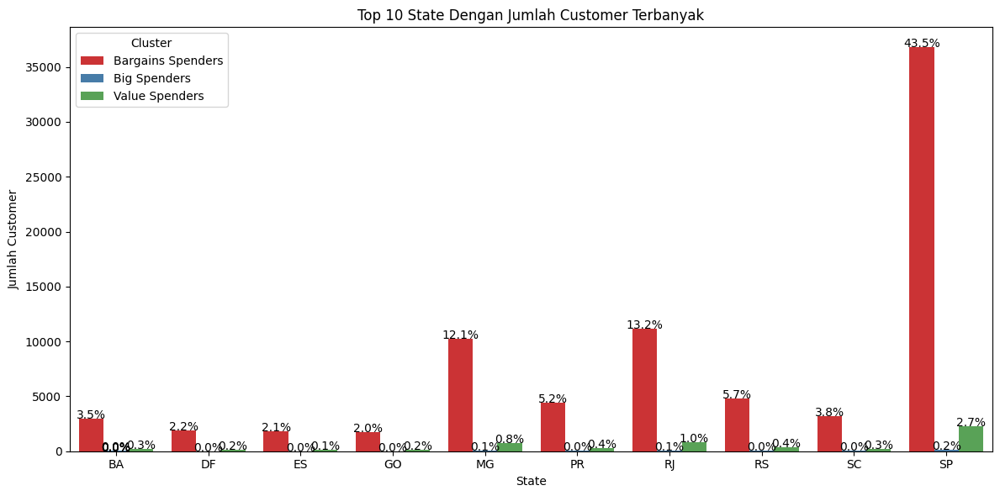

In [ ]:
# Calculate unique customers count and mode values
customer_per_state_cluster = df_after.groupby('customer_unique_id').agg({
    'customer_state': lambda x: x.mode().iloc[0],
    'Cluster': lambda x: x.mode().iloc[0]
}).reset_index()

customer_per_state_cluster.drop(columns='customer_unique_id',inplace=True)

count_customer_per_state_cluster = customer_per_state_cluster.groupby(['customer_state', 'Cluster']).size().reset_index(name='count')
count_customer_per_state_cluster

# Filter to get only the top 10 states by total customer count
top_states = count_customer_per_state_cluster.groupby('customer_state')['count'].sum().sort_values(ascending=False).head(10).index

# Filter the DataFrame to include only the top 10 states
df_top_states = count_customer_per_state_cluster[count_customer_per_state_cluster['customer_state'].isin(top_states)].copy()

# Calculate total number of customers for df_top_states
total_customers = df_top_states['count'].sum()

# Calculate percentage
df_top_states['percentage'] = (df_top_states['count'] / total_customers * 100)

# Plotting the bar plot with percentages
plt.figure(figsize=(12, 6))
barplot = sns.barplot(data=df_top_states, x='customer_state', y='count', hue='Cluster', palette='Set1')

#Add percentages on the bars
for p in barplot.patches:
    height = p.get_height()
    barplot.text(p.get_x() + p.get_width() / 2.,
                 height + 0.1,
                 '{:1.1f}%'.format(height / total_customers* 100),
                 ha="center")

plt.title('Top 10 State Dengan Jumlah Customer Terbanyak')
plt.xlabel('State')
plt.ylabel('Jumlah Customer')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Berdasarkan grafik diatas dapat disimpulkan bahwa, kluster bargains spenders tersebar dan mendominasi di setiap daerah di Brazil, salah satunya kota di Sao Paulo dengan total 43,3% Bargains Spenders, berada disana.Sedangkan populasi kluster Big Spenders & Value Bargaining cenderung sedikit diantara kota dengan jumlah customer terbanyak.

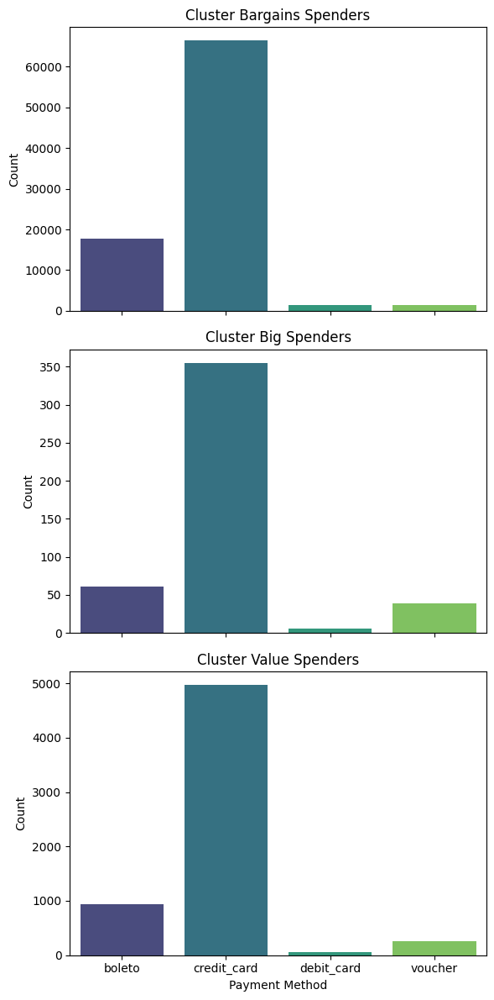

In [ ]:
# Group by customer_unique_id and aggregate payment_type and Cluster by mode
group_cust = df_after.groupby('customer_unique_id').agg({
    'payment_type': lambda x: x.mode().iloc[0],
    'Cluster': lambda x: x.mode().iloc[0]
}).reset_index()

group_cust.drop(columns='customer_unique_id',inplace=True)

count_by_type_cluster = group_cust.groupby(['payment_type', 'Cluster']).size().reset_index(name='count')
count_by_type_cluster

# Get unique clusters
clusters = count_by_type_cluster['Cluster'].unique()

# Plotting bar plots for each cluster
fig, axes = plt.subplots(3,1, figsize=(6, 4 * len(clusters)), sharex=True)

for i, cluster in enumerate(clusters):
    subset_df = count_by_type_cluster[count_by_type_cluster['Cluster'] == cluster]
    ax = axes[i]
    sns.barplot(x='payment_type', y='count', data=subset_df, palette='viridis', ax=ax)
    ax.set_title(f'Cluster {cluster}')
    ax.set_xlabel('Payment Method')
    ax.set_ylabel('Count')

plt.tight_layout()
plt.show()

Tidak ada perbedaan yang signifikan antar cluster terkait dengan metode pembayaran yang digunakan. Metode pembayaran credit card umum digunakan di Brazil dalam transaksi pada ecommerce. Ada beberapa alasan mengapa orang Brasil lebih suka berbelanja menggunakan kartu kredit:

1. Pembayaran Cicilan: Di Brasil, kartu kredit sering
digunakan untuk pembelian dengan cara mencicil. Banyak toko menawarkan opsi untuk membayar dalam beberapa kali cicilan tanpa bunga, yang membuat pembelian barang-barang mahal menjadi lebih terjangkau.

2. Program Poin dan Hadiah: Banyak kartu kredit di Brasil menawarkan program poin dan hadiah yang menarik. Pengguna dapat mengumpulkan poin dari setiap transaksi dan menukarkannya dengan berbagai hadiah, seperti diskon, barang gratis, atau perjalanan.

3. Promosi dan Diskon: Banyak toko dan merchant menawarkan diskon eksklusif bagi pengguna kartu kredit tertentu. Ini membuat berbelanja dengan kartu kredit menjadi lebih menarik dan ekonomis.

4. Meningkatkan Skor Kredit: Penggunaan kartu kredit yang bijak dapat membantu meningkatkan skor kredit seseorang. Hal ini penting untuk pengajuan pinjaman di masa mendatang.


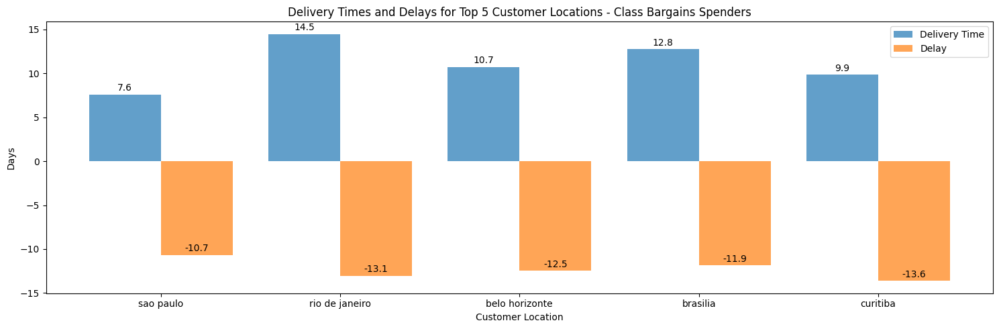

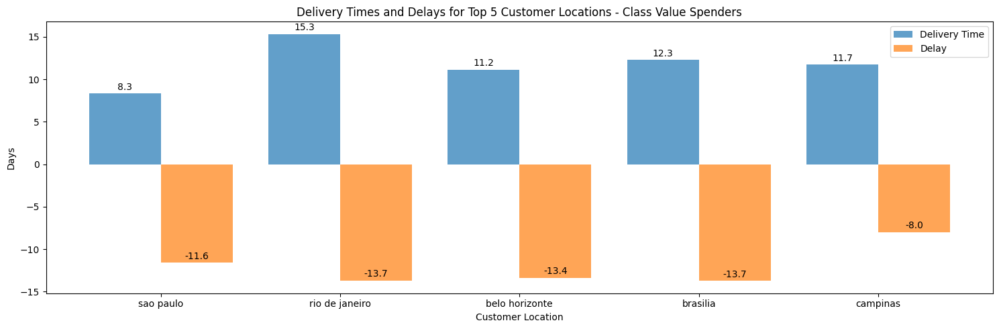

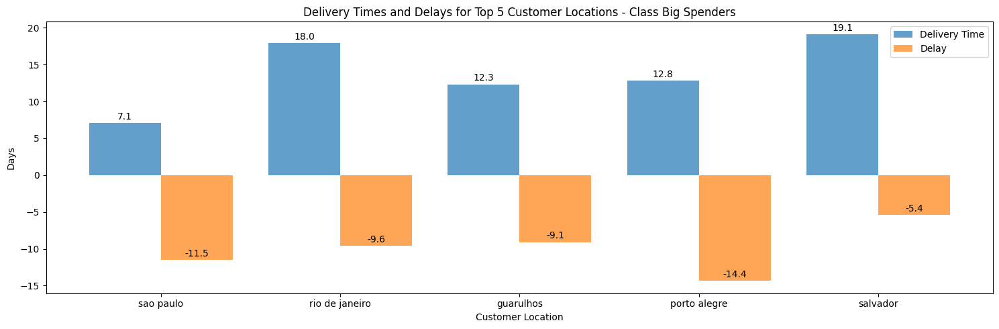

In [ ]:
df_after['delivery_date'] = pd.to_datetime(df_after['order_delivered_customer_date'], errors='coerce')
df_after['estimated_delivery_date'] = pd.to_datetime(df_after['order_estimated_delivery_date'], errors='coerce')

df_after = df_after.dropna(subset=['delivery_date', 'estimated_delivery_date'])

df_after['delivery_time'] = (df_after['delivery_date'] - pd.to_datetime(df_after['order_purchase_timestamp'])).dt.days
df_after['delay'] = (df_after['delivery_date'] - df_after['estimated_delivery_date']).dt.days



def plot_delivery_info_by_location(class_label):
    plt.figure(figsize=(15, 5))

    subset_df = df_after[df_after['Cluster'] == class_label]

    top_locations = subset_df['customer_city'].value_counts().head(5).index

    # Initialize lists to store average delivery time and delay
    delivery_times = []
    delays = []

    for location in top_locations:
        location_data = subset_df[subset_df['customer_city'] == location]

        # Calculate mean delivery time and delay for the location
        delivery_mean = location_data['delivery_time'].mean()
        delay_mean = location_data['delay'].mean()

        delivery_times.append(delivery_mean)
        delays.append(delay_mean)

    # Plotting bar chart for delivery time and delay
    bar_width = 0.4
    index = range(len(top_locations))
    plt.bar(index, delivery_times, width=bar_width, label='Delivery Time', alpha=0.7)
    plt.bar([i + bar_width for i in index], delays, width=bar_width, label='Delay', alpha=0.7)

     # Add labels for bars
    for i, loc in enumerate(top_locations):
        plt.text(i, delivery_times[i] + 0.2, f'{delivery_times[i]:.1f}', ha='center', va='bottom', fontsize=10)
        plt.text(i + bar_width, delays[i] + 0.2, f'{delays[i]:.1f}', ha='center', va='bottom', fontsize=10)

    plt.xlabel('Customer Location')
    plt.ylabel('Days')
    plt.title(f'Delivery Times and Delays for Top 5 Customer Locations - Class {class_label}')
    plt.xticks([i + bar_width / 2 for i in index], top_locations)
    plt.legend()

    plt.tight_layout()
    plt.show()

# Loop through each unique cluster label and plot delivery info by location
for label in df_after['Cluster'].unique():
    plot_delivery_info_by_location(label)

Berdasarkan analisis pengiriman barang untuk tiga kluster customer Olist (Bargain Spenders, Value Spenders, dan Big Spenders), kita dapat mengidentifikasi pola dan tren yang relevan serta memberikan rekomendasi untuk meningkatkan kepuasan customer.

**Kluster Bargain Spenders:**

Observasi: Di 5 kota, pengiriman untuk customer ini relatif lebih cepat dibanding estimasi yang diperkirakan, bahkan hingga 13 hari lebih cepat.
Implikasi: Pengiriman yang cepat ini dapat meningkatkan kepercayaan kluster Bargain Spenders terhadap Olist, mendorong mereka untuk melakukan pembelian berulang.

**Kluster Value Spenders:**

Observasi: Sama seperti kluster Bargain Spenders, pengiriman untuk customer ini di 5 kota juga relatif lebih cepat dibanding estimasi yang diperkirakan, hingga 13 hari lebih cepat.
Implikasi: Kecepatan pengiriman ini memperkuat kepercayaan kluster Value Spenders dan memastikan mereka merasa puas dengan layanan yang diberikan.

**Kluster Big Spenders:**

Observasi: Di 5 kota, pengiriman untuk customer ini juga lebih cepat dibanding estimasi yang diperkirakan, hingga 14 hari lebih cepat di Porto Alegre. Namun, di kota seperti Salvador, pengiriman bisa memakan waktu hingga 20 hari.
Implikasi: Meskipun ada kepuasan tinggi dengan pengiriman yang cepat di beberapa kota, waktu pengiriman yang lama di kota lain seperti Salvador dapat mengurangi kepuasan dan kepercayaan kluster Big Spenders.

**Rekomendasi Strategis**
Berdasarkan analisis di atas, berikut adalah rekomendasi untuk meningkatkan pengalaman dan kepuasan customer di setiap kluster:

Menjaga Loyalitas Kluster Big Spenders:

1.   Standar Pengiriman: Pastikan pengiriman barang untuk kluster Big Spenders selalu berada dalam rentang waktu yang cepat dan konsisten. Usahakan untuk mempertahankan kecepatan pengiriman yang sama di semua kota.
2.   Penanganan Prioritas: Buat sistem penanganan prioritas untuk pengiriman pesanan dari kluster Big Spenders guna memastikan mereka selalu mendapatkan layanan terbaik.
3. Menambah Jasa Kirim/Kurir/ Diversifikasi Mitra Pengiriman: Tambahkan jasa kirim atau kurir tambahan untuk mengurangi beban pada beberapa mitra pengiriman yang ada. Diversifikasi ini akan membantu menghindari overload pada satu mitra pengiriman dan memastikan pengiriman yang cepat dan efisien.
4. Standar Lama Pengiriman: Buat standar waktu pengiriman untuk pengiriman dalam negeri, misalnya 5 hari. Ini akan memberikan ekspektasi yang jelas kepada customer dan membantu mengelola kepuasan mereka.
Peningkatan Kepercayaan:


### Order Time Series Trend Per Klaster

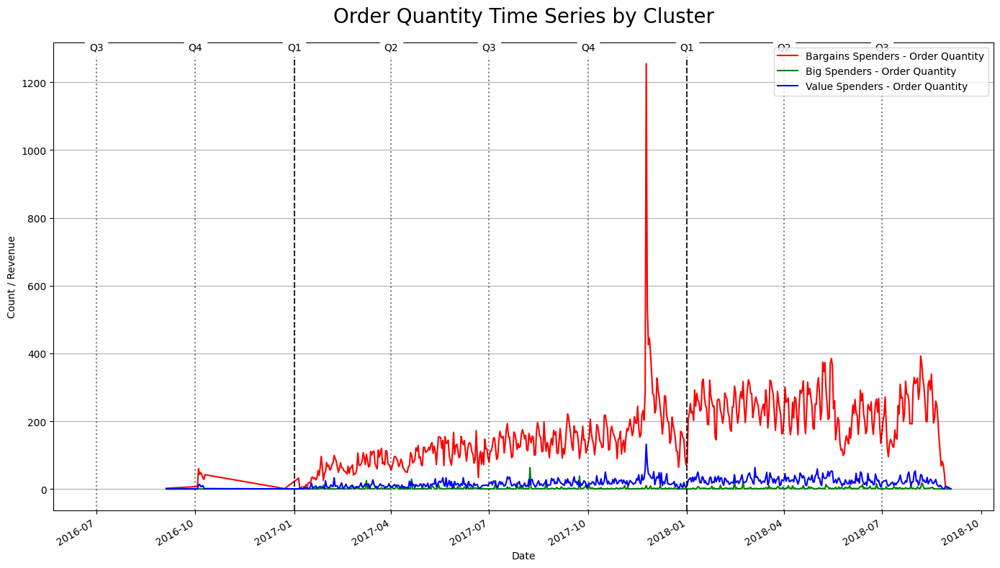

In [ ]:
order_cluster_trend = df_after.groupby(['order_period_day', 'Cluster'])['order_id'].count().reset_index()
pivot_table = order_cluster_trend.pivot(index='order_period_day', columns='Cluster', values='order_id').fillna(0)

pivot_table.index = pd.to_datetime(pivot_table.index)

# Create a figure and axes
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each cluster's order quantity trend
for cluster, color in zip(pivot_table.columns, ['red', 'green', 'blue']):  # Adjust colors as needed
    pivot_table[cluster].plot(kind='line', color=color, ax=ax, label=f'{cluster} - Order Quantity')


# Plot vertical lines for important dates
ax.axvline(x=pd.to_datetime('2017-01-01'), linestyle='--', color='black', alpha=0.8)
ax.axvline(x=pd.to_datetime('2018-01-01'), linestyle='--', color='black', alpha=0.8)

# Get the quarters for each date in the index
quarters = pivot_table.index.to_period('Q')

# Annotate each quarter on the plot
for quarter in quarters.unique():
    quarter_start = quarter.start_time
    ax.axvline(x=quarter_start, linestyle=':', color='black', alpha=0.5)
    ax.text(quarter_start, ax.get_ylim()[1], f'Q{quarter.quarter}', verticalalignment='top', horizontalalignment='center', color='black', fontsize=10, backgroundcolor='white')


# Adjust labels and title for the plot
ax.set_xlabel('Date')
ax.set_ylabel('Count / Revenue')
ax.set_title('Order Quantity Time Series by Cluster', pad=20, fontsize=20)
ax.grid(axis='y')
ax.legend()

plt.tight_layout()
plt.show()

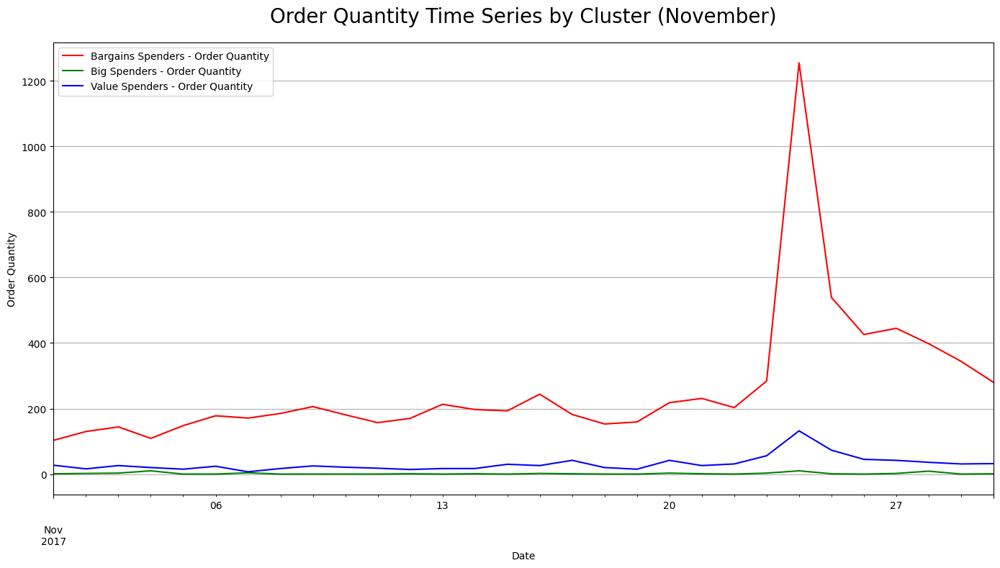

In [ ]:
pivot_table_november = pivot_table[pivot_table.index.month == 11]

# Create a figure and axes
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each cluster's order quantity trend for November
for cluster, color in zip(pivot_table_november.columns, ['red', 'green', 'blue']):  # Adjust colors as needed
    pivot_table_november[cluster].plot(kind='line', color=color, ax=ax, label=f'{cluster} - Order Quantity')

# Plot vertical lines for important dates within November if needed
# Uncomment the following lines if you want to plot vertical lines for specific dates within November
# ax.axvline(x=pd.to_datetime('2017-11-01'), linestyle='--', color='black', alpha=0.8)
# ax.axvline(x=pd.to_datetime('2018-11-01'), linestyle='--', color='black', alpha=0.8)

# Get the days for each date in the index for November
days = pivot_table_november.index.to_period('D')

# Annotate each day on the plot (if needed)
# Uncomment the following block if you want to annotate specific days
# for day in days.unique():
#     day_start = day.start_time
#     ax.axvline(x=day_start, linestyle=':', color='black', alpha=0.5)
#     ax.text(day_start, ax.get_ylim()[1], day.strftime('%d'), verticalalignment='top', horizontalalignment='center', color='black', fontsize=10, backgroundcolor='white')

# Adjust labels and title for the plot
ax.set_xlabel('Date')
ax.set_ylabel('Order Quantity')
ax.set_title('Order Quantity Time Series by Cluster (November)', pad=20, fontsize=20)
ax.grid(axis='y')
ax.legend()

plt.tight_layout()
plt.show()

### Revenue Timeseries Trend Per Klaster

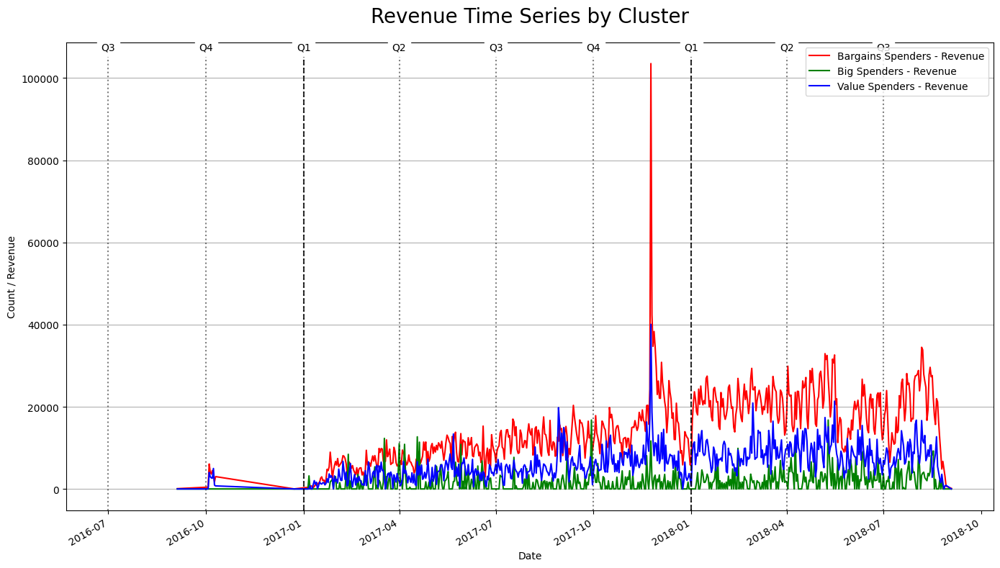

In [ ]:
revenue_cluster_trend = df_after.groupby(['order_period_day', 'Cluster'])['price'].sum().reset_index()
revenue_pivot_table = revenue_cluster_trend.pivot(index='order_period_day', columns='Cluster', values='price').fillna(0)
revenue_pivot_table

revenue_pivot_table.index = pd.to_datetime(revenue_pivot_table.index)

# Create a figure and axes
fig, ax = plt.subplots(figsize=(14, 8))

# Plot each cluster's order quantity trend
for cluster, color in zip(revenue_pivot_table.columns, ['red', 'green', 'blue']):  # Adjust colors as needed
    revenue_pivot_table[cluster].plot(kind='line', color=color, ax=ax, label=f'{cluster} - Revenue')


# Plot vertical lines for important dates
ax.axvline(x=pd.to_datetime('2017-01-01'), linestyle='--', color='black', alpha=0.8)
ax.axvline(x=pd.to_datetime('2018-01-01'), linestyle='--', color='black', alpha=0.8)

# Get the quarters for each date in the index
quarters = pivot_table.index.to_period('Q')

# Annotate each quarter on the plot
for quarter in quarters.unique():
    quarter_start = quarter.start_time
    ax.axvline(x=quarter_start, linestyle=':', color='black', alpha=0.5)
    ax.text(quarter_start, ax.get_ylim()[1], f'Q{quarter.quarter}', verticalalignment='top', horizontalalignment='center', color='black', fontsize=10, backgroundcolor='white')


# Adjust labels and title for the plot
ax.set_xlabel('Date')
ax.set_ylabel('Count / Revenue')
ax.set_title('Revenue Time Series by Cluster', pad=20, fontsize=20)
ax.grid(axis='y')
ax.legend()

plt.tight_layout()
plt.show()

Kedua grafik time series di atas, Total Order dan Revenue (secara berurutan) ini menunjukkan volume pembelian dan pendapatan (revenue) untuk klaster pelanggan yang berbeda pada platform e-commerce dari Juli 2016 hingga Oktober 2018.

1. *Big Spenders (Garis Merah):*
   - Klaster ini menunjukkan tren peningkatan jumlah pesanan yang konsisten dengan beberapa lonjakan signifikan.
   - Klaster ini konsisten menghasilkan pendapatan tertinggi.
   - Terdapat lonjakan signifikan terhadap pendapatan dan volume pesanan pada sekitar November 2017 yang bertepatan dengan Black Friday.
   - Setelah puncak Black Friday, pendapatan dan volume peasnan berfluktuasi tetapi tetap pada tingkat yang lebih tinggi dibandingkan klaster lainnya.
   - Lonjakan ini menunjukkan bahwa promosi besar seperti Black Friday sangat efektif dalam meningkatkan pendapatan dari klaster Big Spenders.

2. *Bargains Spenders (Garis Biru):*
   - Pendapatan dan volume pesanan dari klaster ini relatif rendah dibandingkan dengan Big Spenders tetapi menunjukkan tren yang stabil.
   - Terdapat beberapa lonjakan kecil namun tidak ada yang sebesar lonjakan pada Big Spenders.
   - Ini menunjukkan bahwa pelanggan dalam klaster ini mungkin lebih sensitif terhadap harga dan promosi kecil, tetapi tidak berkontribusi secara signifikan terhadap pendapatan keseluruhan.

3. *Value Spenders (Garis Hijau):*
   - Klaster ini memiliki pendapatan dan volume pesanan terendah sepanjang periode yang diamati.
   - Pendapatan tetap relatif datar dengan fluktuasi kecil.
   - Ini menunjukkan bahwa klaster ini memiliki pengeluaran yang lebih terkendali dan mungkin lebih fokus pada nilai produk daripada jumlah pembelian.

4. *Tren Musiman:*
   - Terdapat peningkatan pendapatan yang signifikan selama Q4, kemungkinan besar dipengaruhi oleh periode belanja liburan, terutama Black Friday.
   - Setelah puncak Black Friday, ada penurunan pendapatan untuk semua klaster, diikuti oleh tren stabil namun berfluktuasi.

Summary:

- Lonjakan signifikan pada November 2017 menunjukkan bahwa promosi besar seperti Black Friday sangat efektif dalam meningkatkan volume pemesanan dan pendapatan, terutama dari klaster Big Spenders. Ini bisa menjadi indikator penting untuk strategi pemasaran, menunjukkan bahwa investasi dalam promosi besar bisa memberikan pengembalian yang signifikan.
- Perbedaan yang jelas dalam pendapatan antara klaster-klaster menunjukkan bahwa perilaku belanja dan respons terhadap promosi sangat bervariasi. Big Spenders memberikan kontribusi terbesar terhadap pendapatan, sehingga program loyalitas atau penawaran khusus mungkin lebih efektif jika ditargetkan kepada mereka.
- Meski terdapat fluktuasi, pendapatan dari klaster Big Spenders tetap lebih stabil setelah Black Friday dibandingkan dengan klaster lainnya. Ini menunjukkan bahwa setelah tertarik oleh promosi besar, pelanggan ini cenderung tetap aktif melakukan pembelian.

# Recommendation System

Dataset preparation

## Recommendation System Product untuk tiap cluster berdasarkan rata-rata payment_value

In [ ]:
# Fungsi untuk mendapatkan rekomendasi produk terbaik untuk setiap cluster
def get_top_products_by_cluster(df, cluster_name, num_recommendations=10):
    # Filter data berdasarkan cluster
    cluster_data = df_after[df_after['Cluster'] == cluster_name]

    # Hitung rata-rata nilai pembayaran untuk setiap produk dalam cluster
    product_ratings = cluster_data.groupby(['product_id', 'product_category_name_english'])['payment_value'].mean().reset_index()

    # Mengurutkan produk berdasarkan nilai rata-rata tertinggi
    top_products = product_ratings.sort_values(by='payment_value', ascending=False).head(num_recommendations)

    return top_products

# Mendapatkan rekomendasi untuk setiap cluster
clusters = df_after['Cluster'].unique()
recommendations_by_cluster = []

for cluster in clusters:
    top_products = get_top_products_by_cluster(df_after, cluster)
    top_products['Cluster'] = cluster
    recommendations_by_cluster.append(top_products)

# Gabungkan hasil rekomendasi untuk setiap cluster ke dalam satu DataFrame
recommendations_df = pd.concat(recommendations_by_cluster, ignore_index=True)
recommendations_df


,product_id,product_category_name_english,payment_value,Cluster
0,630ab0a26067b5145a455aae917d7f0b,toys,561.660000,Bargains Spenders
1,7413f40201dadc558699e8de1cbfa922,sports_leisure,519.480000,Bargains Spenders
2,dcf9390408cfcc20fbe35ae75f74d0c4,auto,517.030000,Bargains Spenders
3,6269367991dd832f09999605131f2c54,auto,517.030000,Bargains Spenders
4,67a7c7243c0585ccc44471b5a5c115e9,auto,508.380000,Bargains Spenders
5,b169ac8237427de1bd8c67b4eabfaa18,housewares,504.090000,Bargains Spenders
6,df872c596e00cd0160e6c8eb5424739f,kitchen_dining_laundry_garden_furniture,502.270000,Bargains Spenders
7,b6479253a96bba2404fe3273ef520eae,housewares,499.460000,Bargains Spenders
8,8f81f9f8a5ad7f2c892d07b91b9c2607,toys,494.680000,Bargains Spenders
9,2d1a8b45479472a709ff5e6be0f1341f,furniture_living_room,491.260000,Bargains Spenders


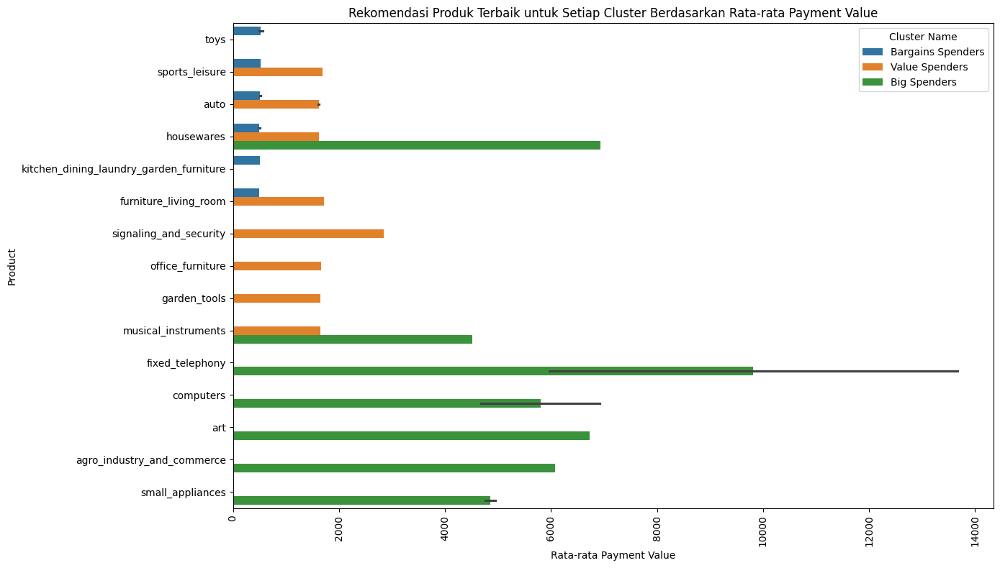

In [ ]:
# Fungsi untuk mendapatkan rekomendasi produk terbaik untuk setiap cluster
def get_top_products_by_cluster(df, cluster_name, num_recommendations=10):
    # Filter data berdasarkan cluster
    cluster_data = df_after[df_after['Cluster'] == cluster_name]

    # Hitung rata-rata nilai pembayaran untuk setiap produk dalam cluster
    product_ratings = cluster_data.groupby(['product_id', 'product_category_name_english'])['payment_value'].mean().reset_index()

    # Mengurutkan produk berdasarkan nilai rata-rata tertinggi
    top_products = product_ratings.sort_values(by='payment_value', ascending=False).head(num_recommendations)

    return top_products

# Mendapatkan rekomendasi untuk setiap cluster
cluster = df_after['Cluster'].unique()
recommendations_by_cluster = []

for cluster in clusters:
    top_products = get_top_products_by_cluster(df_after, cluster)
    top_products['Cluster'] = cluster
    recommendations_by_cluster.append(top_products)

# Gabungkan hasil rekomendasi untuk setiap cluster ke dalam satu DataFrame
recommendations_df = pd.concat(recommendations_by_cluster, ignore_index=True)

# Visualisasi hasil rekomendasi
plt.figure(figsize=(14, 8))
sns.barplot(data=recommendations_df, y='product_category_name_english', x='payment_value', hue='Cluster', dodge=True)
plt.title('Rekomendasi Produk Terbaik untuk Setiap Cluster Berdasarkan Rata-rata Payment Value')
plt.xlabel('Rata-rata Payment Value')
plt.ylabel('Product')
plt.legend(title='Cluster Name')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


Dari hasil grafik diatas setelah menjalankan recommendation system produk berdasarkan rata-rata payment value, dapat diambil informasi bahwa:
- Cluster pada Big Spenders memiliki rekomendasi produk terbaik di fixed_telephony, diikuti dengan housewares dan art
- Cluster pada Value Spenders memiliki rekomendasi produk terbaik di signaling_and_security, diikuti dengan furniture_living_room
- Cluster pada Bargain Spenders memiliki rekomendasi produk terbaik di toys, diikuti dengan sport_leisure

## Rekomendasi Berdasarkan Nilai Pembelian Tertinggi

In [ ]:
# Fungsi untuk mendapatkan rekomendasi produk dengan total nilai pembelian tertinggi untuk setiap cluster
def get_top_value_products_by_cluster(df, cluster_name, num_recommendations=10):
    # Filter data berdasarkan cluster
    cluster_data = df_after[df_after['Cluster'] == cluster_name]

    # Hitung total nilai pembelian untuk setiap produk dalam cluster
    product_value = cluster_data.groupby(['product_id', 'product_category_name_english'])['payment_value'].sum().reset_index()

    # Mengurutkan produk berdasarkan total nilai pembelian tertinggi
    top_products = product_value.sort_values(by='payment_value', ascending=False).head(num_recommendations)

    return top_products

# Mendapatkan rekomendasi untuk setiap cluster
recommendations_by_cluster_value = []

for cluster in clusters:
    top_value_products = get_top_value_products_by_cluster(df_after, cluster)
    top_value_products['Cluster'] = cluster
    recommendations_by_cluster_value.append(top_value_products)

# Gabungkan hasil rekomendasi untuk setiap cluster ke dalam satu DataFrame
recommendations_value_df = pd.concat(recommendations_by_cluster_value, ignore_index=True)

recommendations_value_df

,product_id,product_category_name_english,payment_value,Cluster
0,d1c427060a0f73f6b889a5c7c61f2ac4,computers_accessories,65933.89,Bargains Spenders
1,aca2eb7d00ea1a7b8ebd4e68314663af,furniture_decor,63630.14,Bargains Spenders
2,99a4788cb24856965c36a24e339b6058,bed_bath_table,60527.00,Bargains Spenders
3,bb50f2e236e5eea0100680137654686c,health_beauty,59303.27,Bargains Spenders
4,422879e10f46682990de24d770e7f83d,garden_tools,54566.81,Bargains Spenders
5,6cdd53843498f92890544667809f1595,health_beauty,51410.80,Bargains Spenders
6,368c6c730842d78016ad823897a372db,garden_tools,50929.79,Bargains Spenders
7,3dd2a17168ec895c781a9191c1e95ad7,computers_accessories,48809.51,Bargains Spenders
8,389d119b48cf3043d311335e499d9c6b,garden_tools,44157.18,Bargains Spenders
9,53759a2ecddad2bb87a079a1f1519f73,garden_tools,44018.92,Bargains Spenders


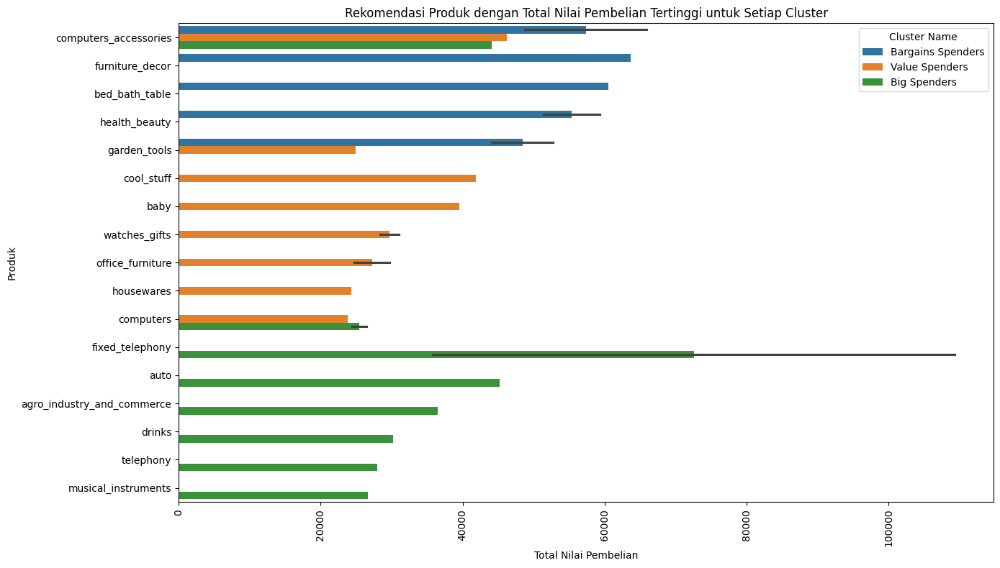

In [ ]:
# Mendapatkan rekomendasi untuk setiap cluster
recommendations_by_cluster_value = []

for cluster in clusters:
    top_value_products = get_top_value_products_by_cluster(df_after, cluster)
    top_value_products['Cluster'] = cluster
    recommendations_by_cluster_value.append(top_value_products)

# Gabungkan hasil rekomendasi untuk setiap cluster ke dalam satu DataFrame
recommendations_value_df = pd.concat(recommendations_by_cluster_value, ignore_index=True)

# Visualisasi hasil rekomendasi berdasarkan total nilai pembelian tertinggi
plt.figure(figsize=(14, 8))
sns.barplot(data=recommendations_value_df, y='product_category_name_english', x='payment_value', hue='Cluster', dodge=True)
plt.title('Rekomendasi Produk dengan Total Nilai Pembelian Tertinggi untuk Setiap Cluster')
plt.xlabel('Total Nilai Pembelian')
plt.ylabel('Produk')
plt.legend(title='Cluster Name')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Dari hasil grafik diatas setelah menjalankan recommendation system produk berdasarkan nilai pembelian tertinggi, dapat diambil informasi bahwa:
- Cluster pada Big Spenders memiliki rekomendasi produk terbaik di fixed_telephony, diikuti dengan auto
- Cluster pada Value Spenders memiliki rekomendasi produk terbaik di computers_accesories, diikuti dengan cool_stuff
- Cluster pada Bargain Spenders memiliki rekomendasi produk terbaik di computers_accesories, diikuti dengan furniture_decor

## Rekomendasi Berdasarkan Frekuensi Pembelian

In [ ]:
# Fungsi untuk mendapatkan rekomendasi produk berdasarkan frekuensi pembelian untuk setiap cluster
def get_frequent_products_by_cluster(df, cluster_name, num_recommendations=10):
    # Filter data berdasarkan cluster
    cluster_data = df_after[df_after['Cluster'] == cluster_name]

    # Hitung frekuensi pembelian untuk setiap produk dalam cluster
    product_frequency = cluster_data.groupby(['product_id', 'product_category_name_english']).size().reset_index(name='purchase_frequency')

    # Mengurutkan produk berdasarkan frekuensi tertinggi
    top_products = product_frequency.sort_values(by='purchase_frequency', ascending=False).head(num_recommendations)

    return top_products

# Mendapatkan rekomendasi untuk setiap cluster berdasarkan frekuensi pembelian
recommendations_by_cluster_frequency = []

for cluster in clusters:
    top_frequent_products = get_frequent_products_by_cluster(df_after, cluster)
    top_frequent_products['Cluster'] = cluster
    recommendations_by_cluster_frequency.append(top_frequent_products)

# Gabungkan hasil rekomendasi untuk setiap cluster ke dalam satu DataFrame
recommendations_frequency_df = pd.concat(recommendations_by_cluster_frequency, ignore_index=True)

# Cetak hasil rekomendasi berdasarkan frekuensi pembelian
print("Rekomendasi Berdasarkan Frekuensi Pembelian:")
recommendations_frequency_df


Rekomendasi Berdasarkan Frekuensi Pembelian:


,product_id,product_category_name_english,purchase_frequency,Cluster
0,aca2eb7d00ea1a7b8ebd4e68314663af,furniture_decor,529,Bargains Spenders
1,99a4788cb24856965c36a24e339b6058,bed_bath_table,491,Bargains Spenders
2,422879e10f46682990de24d770e7f83d,garden_tools,460,Bargains Spenders
3,368c6c730842d78016ad823897a372db,garden_tools,390,Bargains Spenders
4,389d119b48cf3043d311335e499d9c6b,garden_tools,390,Bargains Spenders
5,53759a2ecddad2bb87a079a1f1519f73,garden_tools,368,Bargains Spenders
6,d1c427060a0f73f6b889a5c7c61f2ac4,computers_accessories,335,Bargains Spenders
7,53b36df67ebb7c41585e8d54d6772e08,watches_gifts,314,Bargains Spenders
8,154e7e31ebfa092203795c972e5804a6,health_beauty,281,Bargains Spenders
9,3dd2a17168ec895c781a9191c1e95ad7,computers_accessories,263,Bargains Spenders


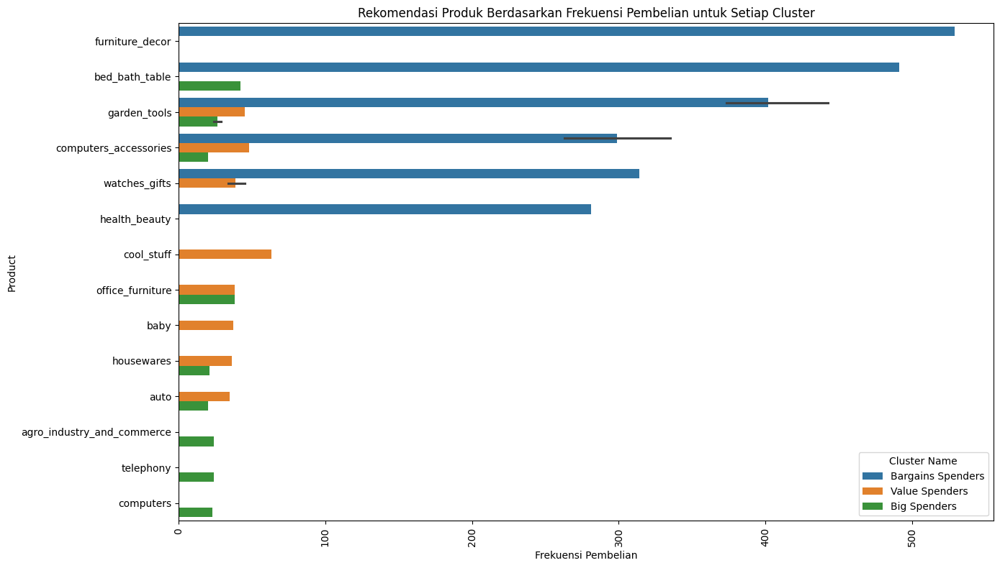

In [ ]:
recommendations_by_cluster_frequency = []

for cluster in clusters:
    top_frequent_products = get_frequent_products_by_cluster(df_after, cluster)
    top_frequent_products['Cluster'] = cluster
    recommendations_by_cluster_frequency.append(top_frequent_products)

# Gabungkan hasil rekomendasi untuk setiap cluster ke dalam satu DataFrame
recommendations_frequency_df = pd.concat(recommendations_by_cluster_frequency, ignore_index=True)

# Visualisasi hasil rekomendasi berdasarkan frekuensi pembelian
plt.figure(figsize=(14, 8))
sns.barplot(data=recommendations_frequency_df, x='purchase_frequency', y='product_category_name_english', hue='Cluster', dodge=True)
plt.title('Rekomendasi Produk Berdasarkan Frekuensi Pembelian untuk Setiap Cluster')
plt.xlabel('Frekuensi Pembelian')
plt.ylabel('Product')
plt.legend(title='Cluster Name')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


Dari hasil grafik diatas setelah menjalankan recommendation system produk berdasarkan frekuensi pembelian, dapat diambil informasi bahwa:
- Cluster pada Big Spenders memiliki rekomendasi produk terbaik di bed_bath_table, diikuti dengan office_furniture
- Cluster pada Value Spenders memiliki rekomendasi produk terbaik di cool_stuff, diikuti dengan computers_accesories
- Cluster pada Bargain Spenders memiliki rekomendasi produk terbaik di furniture_decor, diikuti dengan bed_bath_table

# Conclusion

## Conclusion for Model

Setelah menjalani modelling diatas dan menganalisanya, dapat diambil kesimpulang bahwa:
- Dari 2 metode clustering k-means menggunakan PCA dan RFM,
- Cluster 0 (Bargain Spenders):

    - Rata-rata memiliki recency sekitar 241.54 hari, dengan frekuensi pembelian sekitar 1.18 kali, dan nilai pembelian rata-rata sebesar 102.58 unit mata uang.
    - Median recency adalah 222 hari, dengan median frequency pembelian sebesar 1 kali, dan median monetary sebesar 81.75 unit mata uang.
    - Mereka cenderung melakukan pembelian dengan nilai yang lebih rendah dibandingkan cluster lainnya, tetapi dengan frekuensi yang relatif stabil.
- Cluster 1 (Big Spenders):

    - Rata-rata memiliki recency sekitar 248.43 hari, dengan frekuensi pembelian sekitar 2.70 kali, dan nilai pembelian rata-rata sebesar 2391.31 unit mata uang.
    - Median recency adalah 221 hari, dengan median frequency pembelian sebesar 1 kali, dan median monetary sebesar 1999 unit mata uang.
    - Mereka adalah kelompok dengan nilai pembelian tertinggi dan frekuensi pembelian yang cukup tinggi juga.
- Cluster 2 (Value Spenders):

    - Rata-rata memiliki recency sekitar 243.79 hari, dengan frekuensi pembelian sekitar 1.87 kali, dan nilai pembelian rata-rata sebesar 624.39 unit mata uang.
    - Median recency adalah 223 hari, dengan median frequency pembelian sebesar 1 kali, dan median monetary sebesar 549 unit mata uang.
    - Meskipun tidak sebesar Cluster 1, mereka cenderung melakukan pembelian dengan nilai yang lebih tinggi daripada Cluster 0, namun dengan frekuensi yang tidak terlalu tinggi.

- Dari hasil clustering, akan digunakan hasil dari K-Means clustering RFM dibandingkan PCA dengan total cluster 3.
- Keempat sistem rekomendasi ini memiliki tujuan untuk meningkatkan kepuasan pelanggan, mendorong pembelian lebih lanjut, dan mengoptimalkan nilai sepanjang perjalanan pembelian pelanggan. Dengan menggunakan data mengenai pola pembelian dan preferensi pelanggan, bisnis dapat menghadirkan pengalaman yang lebih personal dan menguntungkan bagi setiap pelanggan mereka.


## Conclusion for Business

Setelah menjalani analisis dan modelling, berikut merupakan konklusi untuk bisnis Olist:
1. Metode pembayaran yang paling umum digunakan di Brasil adalah kartu kredit. Hal ini berlaku merata di semua klaster pelanggan. Popularitas kartu kredit di Brasil disebabkan oleh fleksibilitas pembayaran cicilan tanpa bunga, program poin dan hadiah, serta promosi dan diskon eksklusif yang ditawarkan oleh berbagai merchant.

2.  Semua klaster pelanggan, baik Bargain Spenders, Value Spenders, maupun Big Spenders, menunjukkan bahwa pengiriman barang di 5 kota utama umumnya lebih cepat daripada estimasi yang diberikan. Pengiriman yang lebih cepat ini dapat meningkatkan kepercayaan pelanggan terhadap e-commerce tersebut. Namun, terdapat variasi dalam pengiriman di beberapa kota untuk klaster Big Spenders, seperti di Salvador yang membutuhkan waktu lebih lama.

3.  Lonjakan signifikan dalam jumlah pesanan dan pendapatan pada November 2017, yang bertepatan dengan Black Friday, menunjukkan bahwa promosi besar sangat efektif, terutama untuk klaster Big Spenders. Setelah periode Black Friday, pendapatan dan volume pesanan dari klaster ini tetap lebih tinggi dibandingkan klaster lainnya, menandakan bahwa mereka cenderung tetap aktif setelah tertarik dengan promosi besar.

4.  Klaster Big Spenders konsisten menghasilkan pendapatan tertinggi dengan tren peningkatan pesanan yang stabil. Bargain Spenders memiliki pendapatan dan volume pesanan yang stabil namun lebih rendah dibanding Big Spenders, sedangkan Value Spenders menunjukkan volume pesanan dan pendapatan terendah. Tren musiman menunjukkan peningkatan signifikan selama Q4, dipengaruhi oleh periode belanja liburan.

5. Untuk menjaga loyalitas klaster Big Spenders, penting untuk menjaga ritme pengiriman yang cepat dan menambah jasa kirim/kurir agar pesanan tidak overload pada beberapa mitra pengiriman. Standar pengiriman dalam negeri sebaiknya ditetapkan, misalnya dalam waktu 5 hari. Selain itu, program loyalitas atau penawaran khusus akan lebih efektif jika ditargetkan kepada klaster Big Spenders yang memberikan kontribusi terbesar terhadap pendapatan.

# Recommendation

## Recommendation for Model

Untuk meningkatkan performa model, berikut merupakan rekomendasi yang dapat dilakukan di penelitian selanjutnya:
- Menggunakan algoritma lain seperti DBScan, agglomerative clustering, dll untuk perbandingannya lebih lanjut.
- Feature Engineering Lebih Lanjut: dapat dilakukan penambahan fitur interaksi dan polinomial untuk menangkap hubungan non-linear antara variabel.
- Investigasi Pengaruh Faktor Eksternal: Melakukan studi tentang pengaruh faktor eksternal seperti kebijakan pemerintah, perubahan iklim, dan perkembangan infrastruktur terhadap harga rumah. Mengintegrasikan data eksternal ini dalam model untuk meningkatkan akurasi prediksi.

Dengan melaksanakan rekomendasi ini, penelitian selanjutnya dapat memperbaiki model prediksi harga rumah, menghasilkan estimasi yang lebih akurat, dan memberikan wawasan yang lebih mendalam bagi pengambilan keputusan bisnis.

## Recommendation for Business

Berikut merupakan rekomendasi untuk bisnis OLIST:
1. Mengingat efektivitas promosi besar seperti Black Friday dalam meningkatkan volume pesanan dan pendapatan terutama dari klaster Big Spenders, perusahaan e-commerce harus merencanakan dan melaksanakan promosi besar secara teratur. Selain itu, memperkuat program poin dan hadiah pada kartu kredit akan mendorong lebih banyak transaksi dari klaster ini, karena mereka cenderung memanfaatkan manfaat tersebut.

2. Untuk menjaga dan meningkatkan kepercayaan pelanggan, terutama dari klaster Big Spenders, penting untuk terus meningkatkan efisiensi pengiriman. Menambah mitra pengiriman/kurir dapat menghindari overload pada beberapa mitra yang ada dan memastikan pengiriman tetap cepat dan tepat waktu. Menetapkan standar waktu pengiriman yang konsisten, misalnya dalam 5 hari, juga akan membantu dalam menjaga kepuasan pelanggan.

3. Targetkan Penawaran Khusus kepada Klaster Big Spenders:
Mengingat klaster Big Spenders memberikan kontribusi terbesar terhadap pendapatan, perusahaan harus fokus pada strategi retensi yang diarahkan kepada mereka. Penawaran khusus, program loyalitas yang eksklusif, dan layanan pelanggan yang dipersonalisasi akan meningkatkan kepuasan dan loyalitas klaster ini. Selain itu, evaluasi rutin terhadap respon mereka terhadap berbagai promosi dapat membantu dalam merancang strategi pemasaran yang lebih efektif.